# GNN Experiment Pipeline: ENZYMES Dataset
Αυτό το notebook εκτελεί πείραμα για το μοντέλο GIN (GRAPH ISOMORPHISM NETWORK) χρησιμοποιώντας το dataset ENZYMES.

**Διαδικασία:**
1. Φόρτωση & Ανάλυση Δεδομένων.
2. Εκπαίδευση με 10-Fold Cross-Validation.
3. Αξιολόγηση Μοντέλου σε classification, clustering & stability analysis.
4. Hyperparameter Tuning (προαιρετικά).

Απαραίτητη η ενεργοποίηση της GPU.



## Δομή και Επεξήγηση Εξόδου (Pipeline Output)

Κατά την εκτέλεση του `run_pipeline`, η διαδικασία χωρίζεται σε 4 στάδια.

### 1. Ανάλυση Δεδομένων (Dataset Analysis)
Στην αρχή, το script φορτώνει το dataset **ENZYMES** και τυπώνει μια σύνοψη των χαρακτηριστικών του.
* Πίνακα με `Total Graphs`, `Num Classes`, και μέσους όρους κόμβων/ακμών.
* **Παραγόμενο Αρχείο:** `dataset_info.png` (οπτικοποίηση κατανομής κλάσεων).

### 2. Κύριο Πείραμα (Main Experiment - 10-Fold CV)
Το σύστημα εκτελεί Cross-Validation 10 επαναλήψεων (Folds). Για κάθε Fold:
* **Εκπαίδευση (Training):** Εμφανίζεται η πρόοδος ανά 10 εποχές με το Training Loss και το Validation Accuracy, και σε plot.
* **Εξαγωγή Embeddings:** Μόλις ολοκληρωθεί η εκπαίδευση, το μοντέλο παράγει τα embeddings (`Saved: embeddings_fold_X.npz`).
* **Αξιολόγηση (Evaluation):** Τα embeddings τροφοδοτούνται σε ταξινομητές (SVM, Random Forest, MLP), καθώς και εφαρμόζεται αλγόριθμος kmeans και spectral clustering. Τέλος, εμφανίζεται ένας πίνακας με τα αποτελέσματα του συγκεκριμένου Fold.
* **Ανάλυση Σταθερότητας (Stability):** Το μοντέλο δοκιμάζεται σε δεδομένα με θόρυβο για να ελεγχθεί η ανθεκτικότητά του, και παράγονται τα αντίστοιχα αρχεία.
* Αποθηκεύονται τα embeddings και το μοντέλο για περεταίρω ανάλυση.

### 3. Συγκεντρωτικά Αποτελέσματα (Final Aggregated Results)
Στο τέλος της εκτέλεσης (μετά το Fold 10), τυπώνεται η ενότητα `FINAL AGGREGATED RESULTS`.
* **Internal GNN Metrics:** Η μέση επίδοση του GIN μοντέλου (Accuracy, F1, AUC) σε όλο το Cross-Validation (Μορφή: $\text{Mean} \pm \text{Std}$).
* **External Classifier Metrics:** Η μέση επίδοση των SVM, RF, MLP, μαζί με την τιμή του kmean ARI.
* **Stability Metrics:** Πόσο πέφτει η ακρίβεια όταν προσθέτουμε/αφαιρούμε ακμές, μαζί με αντίστοιχα διαγράμματα.

### 4. Παραγόμενα Αρχεία
Στο τέλος, στον φάκελο εργασίας αποθηκεύονται τα εξής αρχεία για περαιτέρω ανάλυση:
* `experiment_results.csv`: Αναλυτικός πίνακας με όλες τις μετρήσεις για κάθε Fold ξεχωριστά.
* `final_stats.json`: Οι μέσοι όροι και οι τυπικές αποκλίσεις σε μορφή JSON.
* `embeddings_fold_1.npz`: 10 τέτοια αρχεία με τα embeddings από κάθε fold.
* `model_fold_1.pth`: 10 τέτοια αρχεία με τα μοντέλα από κάθε fold.
* `robustness_model_acc.png`: Γράφημα που δείχνει την πτώση της ακρίβειας καθώς αυξάνεται ο θόρυβος στον γράφο.
* `resource_usage.png`: Γράφημα χρόνου εκτέλεσης και χρήσης μνήμης RAM.

imports

In [1]:
# @title
!pip install -q torch_geometric
!pip install -q torch_scatter torch_sparse -f https://data.pyg.org/whl/torch-2.5.1+cu124.html

import torch
print(f"PyTorch Version: {torch.__version__}")
print(f"CUDA Available: {torch.cuda.is_available()}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.7/63.7 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 36.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 56.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 40.0 MB/s eta 0:00:00
PyTorch Version: 2.9.0+cu126
CUDA Available: True


In [2]:
# @title
import torch
import torch.nn.functional as F
import torch.nn as nn
import numpy as np
import os
import time
import psutil
import json
import tracemalloc
import random

from torch.nn import LazyLinear, BatchNorm1d
from torch_geometric.nn.models import GIN
from torch_geometric.nn import global_add_pool
from torch_geometric.datasets import TUDataset
from torch_geometric.loader import DataLoader
from torch_geometric.utils import degree
import torch_geometric.transforms as T
from torch.optim.lr_scheduler import CosineAnnealingLR

from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics import accuracy_score, adjusted_rand_score, f1_score, roc_auc_score
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.pipeline import make_pipeline

import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns

from sklearn.decomposition import PCA

from IPython.display import Image, display

from sklearn.model_selection import GridSearchCV

import pandas as pd

import datetime

from mpl_toolkits.mplot3d import Axes3D
from sklearn.manifold import TSNE

from sklearn.preprocessing import StandardScaler
import copy
import torch.nn.init as init

import itertools
from collections import defaultdict

/usr/local/lib/python3.12/dist-packages/torch_geometric/__init__.py:4: UserWarning: An issue occurred while importing 'torch-scatter'. Disabling its usage. Stacktrace: Could not load this library: /usr/local/lib/python3.12/dist-packages/torch_scatter/_version_cuda.so
  import torch_geometric.typing
/usr/local/lib/python3.12/dist-packages/torch_geometric/__init__.py:4: UserWarning: An issue occurred while importing 'torch-sparse'. Disabling its usage. Stacktrace: Could not load this library: /usr/local/lib/python3.12/dist-packages/torch_sparse/_version_cuda.so
  import torch_geometric.typing


helpers for loging time and memory usage

In [3]:
# @title
SCRIPT_START_TIME = time.time()

In [4]:
# @title
def log_status(message):
    process = psutil.Process(os.getpid())
    mem_info = process.memory_info()
    current_ram = mem_info.rss / (1024 ** 2)
    elapsed_seconds = time.time() - SCRIPT_START_TIME
    elapsed_str = str(datetime.timedelta(seconds=int(elapsed_seconds)))
    print(f"[Elapsed: {elapsed_str}] [RAM: {current_ram:.1f} MB] {message}")

In [5]:
# @title
class ResourceTracker:
    def __init__(self, tag=""):
        self.tag = tag
        self.start_time = None
        self.end_time = None
        self.peak_mem = 0

    def __enter__(self):
        self.start_time = time.time()
        tracemalloc.start()
        return self

    def __exit__(self, exc_type, exc_val, exc_tb):
        self.end_time = time.time()
        _, peak = tracemalloc.get_traced_memory()
        self.peak_mem = peak / (1024 * 1024)
        tracemalloc.stop()

    @property
    def duration(self):
        return self.end_time - self.start_time

    @property
    def memory_mb(self):
        return self.peak_mem

helpers for visualization

In [6]:
# @title
# ==============================================================================
# HELPER: VISUALIZATION FUNCTIONS
# ==============================================================================

def plot_dataset_info(dataset, save_path="dataset_info.png"):
    """
    Plots Class Distribution & Graph Size Statistics (Nodes/Edges).
    """
    y = [data.y.item() for data in dataset]
    classes, counts = np.unique(y, return_counts=True)

    num_nodes = [data.num_nodes for data in dataset]
    num_edges = [data.num_edges for data in dataset]

    print("\n" + "="*40)
    print("      DATASET SUMMARY")
    print("="*40)
    print(f"Total Graphs:    {len(dataset)}")
    print(f"Num Classes:     {len(classes)}")
    print(f"Avg Nodes/Graph: {np.mean(num_nodes):.2f} (Min: {min(num_nodes)}, Max: {max(num_nodes)})")
    print(f"Avg Edges/Graph: {np.mean(num_edges):.2f} (Min: {min(num_edges)}, Max: {max(num_edges)})")
    print("-" * 40)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    bars = ax1.bar(classes, counts, color='skyblue', edgecolor='black', alpha=0.8)
    ax1.set_xlabel('Class Label', fontsize=12)
    ax1.set_ylabel('Count', fontsize=12)
    ax1.set_title('Class Distribution', fontsize=14, fontweight='bold')
    ax1.grid(axis='y', linestyle='--', alpha=0.5)
    ax1.set_xticks(classes)

    for bar in bars:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height,
                 f'{height}', ha='center', va='bottom')

    ax2.hist(num_nodes, bins=30, color='salmon', edgecolor='black', alpha=0.8)
    ax2.set_xlabel('Number of Nodes per Graph', fontsize=12)
    ax2.set_ylabel('Frequency', fontsize=12)
    ax2.set_title('Graph Size Distribution (Nodes)', fontsize=14, fontweight='bold')
    ax2.grid(axis='y', linestyle='--', alpha=0.5)
    avg_nodes = np.mean(num_nodes)
    ax2.axvline(avg_nodes, color='red', linestyle='dashed', linewidth=2, label=f'Avg: {avg_nodes:.1f}')
    ax2.legend()
    plt.tight_layout()
    plt.savefig(save_path, dpi=150)
    plt.show()
    plt.close()
    print(f"[Visuals] Saved extended dataset info to {save_path}")


def plot_final_metrics(all_results, save_path="final_performance_summary.png"):
    """
    Plots Bar Chart of Accuracy vs F1 vs AUC with Error Bars.
    """

    print("\n[Visuals] Generating Final Performance Summary Plot with Error Bars...")

    df = pd.DataFrame(all_results)
    means = df.mean().to_dict()
    stds  = df.std().to_dict()

    models = ["Internal_GIN_Val", "SVM_Lin", "SVM_RBF", "RF", "MLP"]
    labels = ["GIN (Internal)", "SVM (Linear)", "SVM (RBF)", "Random Forest", "MLP (External)"]

    acc_means = [means.get(f"{m}_Acc", 0) for m in models]
    acc_stds  = [stds.get(f"{m}_Acc", 0)  for m in models]
    f1_means  = [means.get(f"{m}_F1", 0)  for m in models]
    f1_stds   = [stds.get(f"{m}_F1", 0)   for m in models]
    auc_means = [means.get(f"{m}_AUC", 0) for m in models]
    auc_stds  = [stds.get(f"{m}_AUC", 0)  for m in models]

    x = np.arange(len(models))
    width = 0.25
    fig, ax = plt.subplots(figsize=(14, 8))

    rects1 = ax.bar(x - width, acc_means, width, yerr=acc_stds, capsize=5,
                    label='Accuracy', color='blue', edgecolor='black', alpha=0.9)

    rects2 = ax.bar(x, f1_means, width, yerr=f1_stds, capsize=5,
                    label='F1 Score', color='red', edgecolor='black', alpha=0.9)

    rects3 = ax.bar(x + width, auc_means, width, yerr=auc_stds, capsize=5,
                    label='AUC', color='green', edgecolor='black', alpha=0.9)

    ax.set_ylabel('Score (0-1)')
    title_suffix = "Results"
    ax.set_title(f'Final Model Performance (Mean ± Std Dev) Internal GIN vs. External Classifiers')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, fontsize=11)
    ax.set_ylim(0, 1.15)
    ax.legend(loc='upper right', fontsize=10)
    ax.grid(axis='y', linestyle='--', alpha=0.5)
    def autolabel(rects):
        for rect in rects:
            height = rect.get_height()
            ax.annotate(f'{height:.2f}',
                        xy=(rect.get_x() + rect.get_width() / 2, height),
                        xytext=(0, 5),
                        textcoords="offset points",
                        ha='center', va='bottom', fontsize=9, fontweight='bold')

    autolabel(rects1)
    autolabel(rects2)
    autolabel(rects3)
    plt.tight_layout()
    plt.savefig(save_path, dpi=150)
    plt.show()
    plt.close()
    print(f"[Visuals] Saved final summary to {save_path}")

def plot_fold_performance(final_stats, filename="fold_performance.png"):
    """
    Plots the scores of all classifiers + KMeans across all folds.
    """

    plt.figure(figsize=(14, 7))

    sample_key = next(iter(final_stats))
    num_folds = len(final_stats[sample_key])
    folds = range(1, num_folds + 1)

    styles = {
        "Internal_GIN_Val_Acc": {'marker': '*', 'label': 'GIN Internal (Val)', 'color': 'purple', 'linewidth': 2.5, 'markersize': 10},
        "SVM_Lin_Acc": {'marker': 'o', 'label': 'SVM Linear', 'color': 'tab:blue'},
        "SVM_RBF_Acc": {'marker': 's', 'label': 'SVM RBF',    'color': 'tab:orange'},
        "RF_Acc":      {'marker': '^', 'label': 'Random Forest','color': 'tab:green'},
        "MLP_Acc":     {'marker': 'd', 'label': 'MLP',        'color': 'tab:red'},
        "KMeans_ARI":  {'marker': 'x', 'label': 'KMeans (ARI)', 'color': 'black', 'linestyle': '--', 'linewidth': 2}
    }

    for name, scores in final_stats.items():
        if name in styles:
            style = styles[name]
            plt.plot(folds, scores, **style)

    plt.title(f'Classifier Accuracy & KMeans ARI per Fold ({num_folds} Folds)', fontsize=14)
    plt.xlabel('Fold Number', fontsize=12)
    plt.ylabel('Score (Accuracy / ARI)', fontsize=12)
    plt.xticks(folds)
    plt.legend(loc='lower right')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.savefig(filename, dpi=300)
    plt.show()
    plt.close()
    print(f"[Visuals] Saved fold performance plot: {filename}")
    return filename

def plot_fold_training_curves(train_histories, val_histories, filename="fold_training_curves.png"):
    """
    Plots Training and Validation curves side-by-side.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

    if isinstance(train_histories, dict):
        iterator = train_histories.items()
    else:
        iterator = enumerate(train_histories)

    for fold_idx, history in iterator:
        epochs = range(1, len(history) + 1)
        ax1.plot(epochs, history, alpha=0.6, linewidth=1.5, label=f'Fold {fold_idx+1}')

    ax1.set_title('Training Accuracy per Fold')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Accuracy')
    ax1.grid(True, linestyle='--', alpha=0.5)

    if val_histories:
        if isinstance(val_histories, dict):
            iterator = val_histories.items()
        else:
            iterator = enumerate(val_histories)

        for fold_idx, history in iterator:
            epochs = range(1, len(history) + 1)
            ax2.plot(epochs, history, alpha=0.6, linewidth=1.5, label=f'Fold {fold_idx+1}')

        ax2.set_title('Validation Accuracy per Fold')
        ax2.set_xlabel('Epochs')
        ax2.grid(True, linestyle='--', alpha=0.5)
        ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small', ncol=1)
    else:

        pass

    plt.suptitle('Learning Curves: Train vs. Validation (All Folds)', fontsize=16)
    plt.tight_layout()
    plt.savefig(filename, dpi=150)
    plt.show()
    plt.close()
    print(f"[Visuals] Saved training curves: {filename}")
    return filename

def plot_cluster_comparison(X, y_true, y_kmeans, y_spectral, save_path):
    """
    Plots 2D t-SNE embeddings thrice side-by-side:
    1. Ground Truth
    2. K-Means
    3. Spectral Clustering
    """

    print("Computing t-SNE for cluster comparison...")
    tsne = TSNE(n_components=2, perplexity=50, random_state=42, init='pca', learning_rate='auto')
    z = tsne.fit_transform(X)
    fig, axes = plt.subplots(1, 3, figsize=(24, 7))
    scatter_kwargs = {'s': 50, 'alpha': 0.8, 'edgecolors': 'w', 'linewidth': 0.2}
    # --- PLOT 1: GROUND TRUTH ---
    scatter1 = axes[0].scatter(z[:, 0], z[:, 1], c=y_true, cmap='tab10', **scatter_kwargs)
    axes[0].set_title("GT (t-SNE)", fontsize=14, fontweight='bold')
    axes[0].axis('off')
    # --- PLOT 2: K-MEANS ---
    scatter2 = axes[1].scatter(z[:, 0], z[:, 1], c=y_kmeans, cmap='tab10', **scatter_kwargs)
    axes[1].set_title("KMeans (t-SNE)", fontsize=14, fontweight='bold')
    axes[1].axis('off')
    # --- PLOT 3: SPECTRAL ---
    scatter3 = axes[2].scatter(z[:, 0], z[:, 1], c=y_spectral, cmap='tab10', **scatter_kwargs)
    axes[2].set_title("Spectral (t-SNE)", fontsize=14, fontweight='bold')
    axes[2].axis('off')
    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    plt.close()
    print(f"[Visuals] Saved 3-panel cluster comparison to {save_path}")

def plot_stability_comparison(res_clean, res_noisy, stab_score):
    """
    Plots grouped bars for Accuracy/F1/ARI comparing Clean vs Noisy.
    """
    metrics = ['SVM_Lin_Acc', 'SVM_RBF_Acc', 'RF_Acc', 'MLP_Acc', 'KMeans_ARI']
    labels  = ['SVM (Lin)', 'SVM (RBF)', 'Random Forest', 'MLP', 'KMeans ARI']

    clean_vals = [res_clean.get(m, 0) for m in metrics]
    noisy_vals = [res_noisy.get(m, 0) for m in metrics]
    x = np.arange(len(labels))
    width = 0.35
    fig, ax = plt.subplots(figsize=(10, 6))
    rects1 = ax.bar(x - width/2, clean_vals, width, label='Original', color='#2ca02c', alpha=0.8)
    rects2 = ax.bar(x + width/2, noisy_vals, width, label='Perturbed (+20% Edges)', color='#d62728', alpha=0.8)
    ax.set_ylabel('Score (0-1)')
    ax.set_title(f'Stability Analysis: Performance Drop under Noise\nEmbedding Stability Score: {stab_score:.3f}')
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend()
    ax.set_ylim(0, 1.15)
    ax.grid(axis='y', linestyle='--', alpha=0.5)

    def autolabel(rects):
        for rect in rects:
            height = rect.get_height()
            ax.annotate(f'{height:.2f}',
                        xy=(rect.get_x() + rect.get_width() / 2, height),
                        xytext=(0, 3), textcoords="offset points",
                        ha='center', va='bottom', fontsize=9)

    autolabel(rects1)
    autolabel(rects2)
    plt.tight_layout()
    save_path = "stability_comparison_plot.png"
    plt.savefig(save_path, dpi=150)
    plt.show()
    print(f"[Visuals] Saved stability comparison to {save_path}")

In [7]:
# @title
def plot_training_results(fold, train_acc, val_acc, train_loss, val_loss):
    epochs = range(1, len(train_acc) + 1)

    plt.figure(figsize=(12, 5))

    # Plot Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_acc, 'b-', label='Train Accuracy')
    plt.plot(epochs, val_acc, 'r-', label='Val Accuracy')
    plt.title(f'Fold {fold+1}: Training & Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot Loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_loss, 'b-', label='Train Loss')
    plt.plot(epochs, val_loss, 'r-', label='Val Loss')
    plt.title(f'Fold {fold+1}: Training & Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.savefig(f"learning_curve_fold_{fold+1}.png")
    plt.show()

resource visualization

In [8]:
# @title
def plot_resource_usage(all_results, save_path="resource_usage.png"):
    """
    Plots Training vs Generation Time with Error Bars and numeric text labels.
    """
    df = pd.DataFrame(all_results)
    means = df.mean(numeric_only=True)
    stds = df.std(numeric_only=True)

    methods = ["GIN", "SVM_Lin", "SVM_RBF", "RF", "MLP"]

    # Extract Data
    train_times = [means.get(f"{m}_Train_Time", 0) for m in methods]
    train_err   = [stds.get(f"{m}_Train_Time", 0) for m in methods]

    gen_times   = [means.get(f"{m}_Gen_Time", 0) for m in methods]
    gen_err     = [stds.get(f"{m}_Gen_Time", 0) for m in methods]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

    # --- PLOT 1: Training Time ---
    bars1 = ax1.bar(methods, train_times, yerr=train_err, capsize=5,
                    color='orange', edgecolor='black', alpha=0.7)

    ax1.set_title("Average Training Time (sec)", fontsize=14, fontweight='bold')
    ax1.set_ylabel("Seconds")
    ax1.grid(axis='y', linestyle='--', alpha=0.5)

    max_h1 = 0
    for rect, err in zip(bars1, train_err):
        height = rect.get_height()
        y_pos = height + err
        max_h1 = max(max_h1, y_pos)

        ax1.text(rect.get_x() + rect.get_width()/2., y_pos + (0.02 * max(train_times)),
                 f'{height:.2f}\n±{err:.2f}',
                 ha='center', va='bottom', fontsize=9, fontweight='bold', color='black')

    ax1.set_ylim(0, max_h1 * 1.25)


    # --- PLOT 2: Generation Time ---
    bars2 = ax2.bar(methods, gen_times, yerr=gen_err, capsize=5,
                    color='teal', edgecolor='black', alpha=0.7)

    ax2.set_title("Average Generation/Inference Time (sec)", fontsize=14, fontweight='bold')
    ax2.set_ylabel("Seconds")
    ax2.grid(axis='y', linestyle='--', alpha=0.5)

    max_h2 = 0
    for rect, err in zip(bars2, gen_err):
        height = rect.get_height()
        y_pos = height + err
        max_h2 = max(max_h2, y_pos)

        ax2.text(rect.get_x() + rect.get_width()/2., y_pos + (0.02 * max(gen_times)),
                 f'{height:.3f}\n±{err:.3f}',
                 ha='center', va='bottom', fontsize=9, fontweight='bold', color='black')

    ax2.set_ylim(0, max_h2 * 1.25)

    plt.tight_layout()
    plt.savefig(save_path, dpi=300)
    plt.show()
    print(f"[Visuals] Saved resource usage report to {save_path}")
    print("\n" + "="*70)
    print("      RESOURCE CONSUMPTION REPORT (Mean ± Std)")
    print("="*70)
    print(f"{'Method':<10} | {'Train Time (s)':<20} | {'Gen Time (s)':<20} | {'Peak RAM (MB)':<15}")
    print("-" * 75)

    def fmt(m, s): return f"{m:.2f} ± {s:.2f}"

    # GIN
    t_m = means.get('GIN_Train_Time',0); t_s = stds.get('GIN_Train_Time',0)
    g_m = means.get('GIN_Gen_Time',0);   g_s = stds.get('GIN_Gen_Time',0)
    r_m = means.get('GIN_Peak_RAM_MB',0);r_s = stds.get('GIN_Peak_RAM_MB',0)

    print(f"{'GIN':<10} | {fmt(t_m, t_s):<20} | {fmt(g_m, g_s):<20} | {fmt(r_m, r_s):<15}")

    for m in methods[1:]:
        t_m = means.get(f'{m}_Train_Time',0); t_s = stds.get(f'{m}_Train_Time',0)
        g_m = means.get(f'{m}_Gen_Time',0);   g_s = stds.get(f'{m}_Gen_Time',0)
        print(f"{m:<10} | {fmt(t_m, t_s):<20} | {fmt(g_m, g_s):<20} | {'-'}")

helper for picking fold with the best clustering and visualising

In [9]:
# @title
def best_clustering_fold(row_data, title_prefix):
        """
        Loads a specific fold's embeddings and plots the cluster comparison.
        """
        fold_idx = int(row_data['fold_idx'])
        ari_score = row_data.get(f'{title_prefix}_ARI', 0)
        if title_prefix == "Best_Performance":
             ari_score = row_data.get('MLP_Acc', 0)

        print(f">> Generating plot for {title_prefix} (Fold {fold_idx+1})...")

        try:
            data = np.load(f"embeddings_fold_{fold_idx+1}.npz")
            X_val, y_val = data['X_val'], data['y_val']

            n_classes = 3
            kmeans = KMeans(n_clusters=n_classes, n_init=20, random_state=42)
            k_labels = kmeans.fit_predict(X_val)

            spectral = SpectralClustering(n_clusters=n_classes, affinity='nearest_neighbors', random_state=42)
            s_labels = spectral.fit_predict(X_val)

            plot_cluster_comparison(
                X_val, y_val, k_labels, s_labels,
                save_path=f"best_{title_prefix.lower()}_fold_{fold_idx+1}.png"
            )
        except FileNotFoundError:
            print(f"!! Warning: Could not find embeddings for fold {fold_idx+1}. Skipping plot.")

helpers for stability analysis

In [10]:
# @title
def perturb_dataset(dataset, noise_level, mode='add'):
    """
    Perturbs the dataset by adding or removing edges.
    """
    log_status("Perturb Dataset...")
    perturbed_list = []

    for data in dataset:
        data = data.clone()
        num_edges = data.num_edges
        num_perturb = int(noise_level * num_edges)

        if mode == 'add':
            # --- ADD EDGES ---
            num_nodes = data.num_nodes
            src = torch.randint(0, num_nodes, (num_perturb,))
            dst = torch.randint(0, num_nodes, (num_perturb,))
            new_edges = torch.stack([src, dst], dim=0)
            data.edge_index = torch.cat([data.edge_index, new_edges], dim=1)

        elif mode == 'remove':
            # --- REMOVE EDGES ---
            num_perturb = min(num_perturb, num_edges)
            num_keep = num_edges - num_perturb
            if num_keep > 0:
                perm = torch.randperm(num_edges)
                keep_indices = perm[:num_keep]
                data.edge_index = data.edge_index[:, keep_indices]
            else:
                data.edge_index = torch.empty((2, 0), dtype=torch.long)

        perturbed_list.append(data)

    return perturbed_list

plot stability analysis results

In [11]:
# @title
def plot_stability_summary(df_results, save_path="final_stability_dual_plot.png"):
    """
    Creates a side-by-side bar chart showing:
    1. Model Accuracy vs Noise
    2. Cosine Similarity vs Noise
    *NOW INCLUDES DATA LABELS ON BARS*
    """
    print(f">> Generating Dual Stability Summary Plot to {save_path}...")

    master_csv = "stability_detailed_ALL_FOLDS.csv"
    if not os.path.exists(master_csv):
        print(f"!! WARNING: {master_csv} not found. Cannot plot Cosine Similarity.")
        return

    df_detailed = pd.read_csv(master_csv)

    plot_df = df_detailed[df_detailed['Mode'] != 'Clean'].copy()

    plot_df['Mode'] = plot_df['Mode'].str.lower()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))
    sns.set_style("whitegrid")

    palette = {"add": "green", "remove": "red"}

    bar1 = sns.barplot(
        data=plot_df,
        x="Noise_Level", y="Model_Accuracy", hue="Mode",
        ax=ax1, palette=palette, capsize=.1, edgecolor='k', errorbar='sd'
    )
    ax1.set_title("Robustness: Model Accuracy (Mean ± Std)", fontsize=14, fontweight='bold')
    ax1.set_ylabel("Accuracy Score")
    ax1.set_xlabel("Noise Level")
    ax1.set_ylim(0, 1.15)

    bar2 = sns.barplot(
        data=plot_df,
        x="Noise_Level", y="Cosine_Similarity", hue="Mode",
        ax=ax2, palette=palette, capsize=.1, edgecolor='k', errorbar='sd'
    )
    ax2.set_title("Stability: Embedding Cosine Similarity (Mean ± Std)", fontsize=14, fontweight='bold')
    ax2.set_ylabel("Similarity (Relative to Clean)")
    ax2.set_xlabel("Noise Level")
    ax2.set_ylim(0.9, 1.02)
    def add_labels(ax, decimals=4):
        for container in ax.containers:

            try:
                ax.bar_label(container, fmt=f'%.{decimals}f', padding=3, fontsize=9, fontweight='bold')
            except AttributeError:
                for rect in container:
                    height = rect.get_height()
                    if height > 0:
                        ax.text(
                            rect.get_x() + rect.get_width() / 2,
                            height,
                            f"{height:.{decimals}f}",
                            ha='center', va='bottom',
                            fontsize=9, fontweight='bold'
                        )

    add_labels(ax1, decimals=2)
    add_labels(ax2, decimals=4)

    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    print(f"[Plots] Saved dual stability plot to {save_path}")

In [12]:
# @title
def plot_robustness_curve(df_detailed, metric="Model_Accuracy", save_path="robustness_curve.png", ylabel="Score"):
    """
    Plots the degradation of a specific metric Model_Accuracy as noise increases.
    """

    print(f">> Generating Robustness Curve for {metric}...")
    if df_detailed.empty:
        print("!! Dataframe is empty. Skipping robustness curve.")
        return

    df_clean = df_detailed[df_detailed['Mode'] == 'Clean'].copy()
    df_add   = df_detailed[df_detailed['Mode'] == 'add'].copy()
    df_rem   = df_detailed[df_detailed['Mode'] == 'remove'].copy()

    clean_add = df_clean.copy()
    clean_add['Mode'] = 'add'

    clean_rem = df_clean.copy()
    clean_rem['Mode'] = 'remove'

    df_plot = pd.concat([clean_add, clean_rem, df_add, df_rem], ignore_index=True)

    plt.figure(figsize=(10, 6))
    sns.set_style("whitegrid")

    palette = {"add": "green", "remove": "red"} # Green/Red


    sns.lineplot(
        data=df_plot,
        x="Noise_Level",
        y=metric,
        hue="Mode",
        palette=palette,
        style="Mode",
        markers=True,
        dashes=False,
        linewidth=2.5,
        errorbar='sd'
    )

    plt.title(f"Model Robustness: {metric} vs. Structural Noise", fontsize=14, fontweight='bold')
    plt.xlabel("Noise Level (Ratio of Edges)", fontsize=12)
    plt.ylabel(f"{metric} Score", fontsize=12)

    vals = df_plot['Noise_Level'].unique()
    plt.xticks(vals, [f"{int(x*100)}%" for x in sorted(vals)])

    plt.legend(title="Perturbation Type", loc='lower left')

    plt.tight_layout()
    plt.savefig(save_path, dpi=300)
    plt.show()
    plt.close()
    print(f"[Plots] Saved robustness curve to {save_path}")

Plot hyperparameter tradeoff

In [29]:
# @title
def plot_tuning_results(results_dict, save_path="tuning_tradeoff.png"):
    """Plots Accuracy vs Compute Cost (Time) for different dimensions."""
    dims = results_dict["dim"]
    accs = [x * 100 for x in results_dict["accuracy"]]
    times = results_dict["training_time"]

    fig, ax1 = plt.subplots(figsize=(10, 6))

    color = 'tab:blue'
    ax1.set_xlabel('Embedding Dimension', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Validation Accuracy (%)', color=color, fontsize=12, fontweight='bold')
    ax1.plot(dims, accs, color=color, marker='o', linewidth=3, label='Accuracy')
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.grid(True, alpha=0.3)

    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Training Time (s)', color=color, fontsize=12, fontweight='bold')
    ax2.plot(dims, times, color=color, marker='s', linestyle='--', linewidth=2, label='Compute Cost')
    ax2.tick_params(axis='y', labelcolor=color)

    plt.title('Hyperparameter Tuning:\nAccuracy vs. Compute Cost', fontsize=14)
    plt.xticks(dims)
    fig.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"[Plot] Saved tuning tradeoff to {save_path}")

# GIN IMPLEMENTATION

*GIN_CONFIG: Προτείνεται από το paper https://arxiv.org/pdf/1810.00826 για bio networks όπως το ENZYMES.*

In [31]:
# ==============================================================================
# GLOBAL HYPERPARAMETERS
# ==============================================================================
GIN_CONFIG = {
    # Model Architecture
    "hidden_channels": 64,
    "num_layers": 5,
    "dropout": 0.5,
    "train_eps": True,

    # Training
    "lr": 0.01,
    "weight_decay": 1e-4,
    "step_size": 50,
    "gamma": 0.5
}

In [32]:
# ==============================================================================
# 1. GIN MODEL
# ==============================================================================
class GINModel(torch.nn.Module):
    def __init__(self, in_channels, out_channels, **kwargs):
        super().__init__()

        dim        = kwargs.get("hidden_dim", GIN_CONFIG["hidden_channels"])
        num_layers = kwargs.get("num_layers", GIN_CONFIG["num_layers"])
        dropout    = kwargs.get("dropout",    GIN_CONFIG["dropout"])
        train_eps  = kwargs.get("train_eps",  GIN_CONFIG["train_eps"])
        jk_mode    = kwargs.get("jk", "cat")

        # Paper Specs: Sum Pooling, JK=Cat, train_eps trainable
        self.gin = GIN(
            in_channels=in_channels,
            hidden_channels=dim,
            num_layers=num_layers,
            dropout=dropout,
            norm=BatchNorm1d(dim),
            jk=jk_mode,
            train_eps=train_eps
        )
        # Internal Head for Supervised Training
        #self.internal_head = LazyLinear(out_channels)
        input_dim = dim
        self.internal_head = torch.nn.Sequential(
            torch.nn.Linear(input_dim, dim),
            torch.nn.BatchNorm1d(dim),
            torch.nn.ReLU(),
            torch.nn.Dropout(p=0.5),
            torch.nn.Linear(dim, out_channels)   # Final Prediction
        )

    def get_embedding(self, x, edge_index, batch):

      node_embeddings = self.gin(x, edge_index)
      #all_node_feats = torch.cat([x, node_embeddings], dim=-1)
      graph_emb = global_add_pool(node_embeddings, batch)
      return graph_emb

    def forward(self, x, edge_index, batch):
        """Forward pass for Adam Optimizer"""
        emb = self.get_embedding(x, edge_index, batch)
        return self.internal_head(emb)
        #return emb

Train and save

In [17]:
# @title
# ==============================================================================
# 2. TRAIN LOOP
# ==============================================================================

def train_and_save(fold_idx, train_loader, val_loader, dataset, device, filename, hyperparams=None):
    """
    Trains a gin model with Early Stopping and saves embeddings from the best epoch.
    """

    stats = {}
    log_status(f"--- Fold {fold_idx+1}: Initializing GIN ---")

    if hyperparams is None: hyperparams = {}

    # 1. Initialize Model
    model = GINModel(dataset.num_features, dataset.num_classes, **hyperparams).to(device)

    learning_rate = hyperparams.get("lr", GIN_CONFIG["lr"])
    w_decay = hyperparams.get("weight_decay", GIN_CONFIG["weight_decay"])

    # 2. Optimizer & Scheduler
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=w_decay)
    # scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=GIN_CONFIG["step_size"], gamma=GIN_CONFIG["gamma"])
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer,
        T_max=350,
        eta_min=0.0001
    )

    log_status("Starting Training Loop...")
    with ResourceTracker("GIN_Train") as rt_train:

      # 3. Training Config
      MAX_EPOCHS = 350
      # TRY NO EARLY STOPPING BUT STILL KEEP BEST MODEL OUT OF EVERY EPOCH
      # patience = 50
      # patience_counter = 0

      # 4. State Tracking for Best Model
      best_val_loss = float('inf')
      best_val_acc = 0.0
      best_model_wts = copy.deepcopy(model.state_dict())
      best_epoch = 0

      # List to store training accuracy per epoch
      train_acc_history = []
      val_acc_history = []
      train_loss_history = []
      val_loss_history = []

      # --- MAIN LOOP ---
      for epoch in range(1, MAX_EPOCHS + 1):
          # --- TRAIN STEP ---
          model.train()
          total_loss = 0
          total_correct = 0
          total_examples = 0

          for data in train_loader:
              data = data.to(device)
              optimizer.zero_grad()

              # Forward pass
              out = model(data.x, data.edge_index, data.batch)
              loss = F.cross_entropy(out, data.y)

              # Backward pass
              loss.backward()
              optimizer.step()
              total_loss += loss.item()

              pred = out.argmax(dim=1)
              total_correct += int((pred == data.y).sum())
              total_examples += data.y.size(0)

          scheduler.step()
          avg_train_loss = total_loss / len(train_loader)

          epoch_train_acc = total_correct / total_examples if total_examples > 0 else 0
          train_acc_history.append(epoch_train_acc)
          train_loss_history.append(avg_train_loss)

          # --- VALIDATION STEP (Run EVERY epoch) ---
          model.eval()
          val_loss = 0
          correct = 0
          total = 0

          with torch.no_grad():
              for data in val_loader:
                  data = data.to(device)
                  out = model(data.x, data.edge_index, data.batch)

                  # Track Loss
                  val_loss += F.cross_entropy(out, data.y).item()

                  # Track Accuracy
                  pred = out.argmax(dim=1)
                  correct += (pred == data.y).sum().item()
                  total += data.y.size(0)

          avg_val_loss = val_loss / len(val_loader)
          val_acc = correct / total if total > 0 else 0

          val_acc_history.append(val_acc)
          val_loss_history.append(avg_val_loss)

          if avg_val_loss < best_val_loss:
              best_val_loss = avg_val_loss
              best_model_wts = copy.deepcopy(model.state_dict())
              best_epoch = epoch
              # patience_counter = 0
          # TRY KEEO BEST ACC
          # if val_acc > best_val_acc:
          #   best_val_acc = val_acc
          #   best_model_wts = copy.deepcopy(model.state_dict())
          #   best_epoch = epoch

          # else:
          #     patience_counter += 1

          # --- LOGGING ---
          if epoch % 10 == 0:
              # log_status(f"Epoch {epoch:03d} | Train: {avg_train_loss:.4f} | Val: {avg_val_loss:.4f} (Acc: {val_acc:.4f}) | Patience: {patience_counter}/{patience}")
              log_status(f"Epoch {epoch:03d} | Train: {avg_train_loss:.4f} | Val: {avg_val_loss:.4f} (Acc: {val_acc:.4f})")

          # --- EARLY STOPPING TRIGGER ---
          # if patience_counter >= patience:
          #     log_status(f"Early stopping triggered at Epoch {epoch}. Best model was Epoch {best_epoch}.")
          #     break

    log_status("Training finished.")
    stats["GIN_Train_Time"] = rt_train.duration
    stats["GIN_Peak_RAM_MB"] = rt_train.memory_mb

    # --- RESTORE BEST WEIGHTS ---
    log_status(f"Restoring best model from Epoch {best_epoch} with Val Loss {best_val_loss:.4f}")
    model.load_state_dict(best_model_wts)

    # --- FINAL METRIC CALCULATION (ACC, F1, AUC) ---
    model.eval()
    all_preds = []
    all_probs = []
    all_labels = []

    with torch.no_grad():
        for data in val_loader:
            data = data.to(device)
            logits = model(data.x, data.edge_index, data.batch)
            probs = F.softmax(logits, dim=1)
            preds = logits.argmax(dim=1)

            all_preds.append(preds.cpu())
            all_probs.append(probs.cpu())
            all_labels.append(data.y.cpu())

    y_true = torch.cat(all_labels).numpy()
    y_pred = torch.cat(all_preds).numpy()
    y_probs = torch.cat(all_probs).numpy()

    final_acc = accuracy_score(y_true, y_pred)
    final_f1 = f1_score(y_true, y_pred, average='weighted')

    try:
        if dataset.num_classes == 2:
            final_auc = roc_auc_score(y_true, y_probs[:, 1])
        else:
            final_auc = roc_auc_score(y_true, y_probs, multi_class='ovr', average='weighted')
    except ValueError:
        final_auc = 0.5
    print(f"\n[Fold {fold_idx+1} FINAL RESULTS]")
    print(f"   > Best Val Acc: {final_acc*100:.2f}%")
    print(f"   > F1-Score:     {final_f1:.4f}")
    print(f"   > AUC:          {final_auc:.4f}")
    print("-" * 40)

    stats["Internal_GIN_Val_Acc"] = final_acc
    stats["Internal_GIN_Val_F1"] = final_f1
    stats["Internal_GIN_Val_AUC"] = final_auc

    # --- SAVE MODEL ---
    weight_path = f"model_fold_{fold_idx+1}.pth"
    torch.save(model.state_dict(), weight_path)

    # --- EXTRACT EMBEDDINGS ---
    def extract(loader):
        vecs, labels = [], []
        model.eval()
        with torch.no_grad():
            for data in loader:
                data = data.to(device)
                emb = model.get_embedding(data.x, data.edge_index, data.batch)
                vecs.append(emb.detach().cpu().numpy())
                labels.append(data.y.cpu().numpy())
        return np.concatenate(vecs), np.concatenate(labels)

    log_status("Extracting embeddings...")

    with ResourceTracker("GIN_Gen") as rt_gen:
      X_train, y_train = extract(train_loader)
      X_val, y_val = extract(val_loader)

    stats["GIN_Gen_Time"] = rt_gen.duration
    print(f"   > Generated Embedding Dimensions: {X_train.shape}")

    # --- SAVE EMBEDDINGS ---
    np.savez(filename, X_train=X_train, y_train=y_train, X_val=X_val, y_val=y_val)
    log_status(f"Saved: {filename}")

    plot_training_results(fold_idx, train_acc_history, val_acc_history, train_loss_history, val_loss_history)

    return filename, train_acc_history, val_acc_history, model, stats

Evaluate classifiers

In [18]:
# @title
# ==============================================================================
# 3. EVALUATION
# ==============================================================================
def evaluate_classifiers(filename, fold_idx, n_classes=3):
    log_status(f"Loading '{filename}' for Evaluation...")
    data = np.load(filename)
    X_train, y_train = data['X_train'], data['y_train']
    X_val, y_val     = data['X_val'], data['y_val']

    results = {}

    # ==========================================================================
    # SUPERVISED CLASSIFIERS FOR EXTERNAL ACCURACY
    # ==========================================================================

    classifiers = {
        "SVM_Lin": make_pipeline(StandardScaler(), SVC(kernel='linear', probability=True, max_iter=10000)),
        "SVM_RBF": make_pipeline(StandardScaler(), SVC(kernel='rbf', probability=True, max_iter=10000)),
        "RF":      RandomForestClassifier(n_estimators=50, n_jobs=1, random_state=42), # n_jobs=1 prevents freeze
        "MLP":     make_pipeline(StandardScaler(), MLPClassifier(hidden_layer_sizes=(64, 32), max_iter=500, random_state=42))
    }

    print(f"\n   [Fold {fold_idx+1} Evaluation]")
    print(f"   {'Model':<10} | {'Acc':<8} | {'F1':<8} | {'AUC':<8} | {'Time(s)':<8}")
    print("   " + "-"*60)

    for name, model in classifiers.items():

        clean_name = name.strip()

        with ResourceTracker() as rt_train:
            try:
              model.fit(X_train, y_train)
            except Exception as e:
              print(f"   !! Error training {name}: {e}")
              continue
        results[f"{clean_name}_Train_Time"] = rt_train.duration

        with ResourceTracker() as rt_gen:
            pred = model.predict(X_val)
            prob = model.predict_proba(X_val)
        results[f"{clean_name}_Gen_Time"] = rt_gen.duration

        # Acc and F1
        acc = accuracy_score(y_val, pred)
        f1  = f1_score(y_val, pred, average='weighted')

        # AUC
        try:
            auc = roc_auc_score(y_val, prob, multi_class='ovr', average='weighted')
        except ValueError:
            auc = 0.5

        results[f"{clean_name}_Acc"] = acc
        results[f"{clean_name}_F1"]  = f1
        results[f"{clean_name}_AUC"] = auc
        print(f"   {clean_name:<10} | {acc*100:.1f}%   | {f1*100:.1f}%   | {auc:.3f}    | {rt_train.duration:.2f}s")

    # ==========================================================================
    # UNSUPERVISED: K-Means
    # ==========================================================================
    kmeans = KMeans(n_clusters=n_classes, n_init=20, random_state=42)
    kmeans_labels = kmeans.fit_predict(X_val)

    kmeans_ari = adjusted_rand_score(y_val, kmeans_labels)
    results["KMeans_ARI"] = kmeans_ari
    print(f"   >> KMeans ARI: {kmeans_ari:.4f}")

    # ==========================================================================
    # UNSUPERVISED: Spectral Clustering
    # ==========================================================================
    spectral = SpectralClustering(n_clusters=n_classes,
                                  affinity='nearest_neighbors',
                                  random_state=42,
                                  n_neighbors=10)
    spectral_labels = spectral.fit_predict(X_val)
    spectral_ari = adjusted_rand_score(y_val, spectral_labels)
    results["Spectral_ARI"] = spectral_ari
    print(f"   >> Spectral ARI: {spectral_ari:.4f}")
    print("   " + "="*60 + "\n")

    # ==========================================================================
    # VISUALIZATION ONLY FOR FOLD 0
    # ==========================================================================
    if fold_idx == 0:
        plot_cluster_comparison(
            X_val,
            y_val,
            kmeans_labels,
            spectral_labels,
            save_path="pca_cluster_comparison_fold_1.png"
        )

    return results

Stability analysis

In [19]:
# @title
def run_stability_analysis(dataset, device, fold_idx, model=None, model_path=None):
    """
    Comprehensive Stability Analysis:
    - Calculates Cosine Similarity between Clean and Noisy validation sets.
    - Evaluates downstream performance on noisy data.
    - Saves a detailed CSV for this fold.
    - Returns summary_stats for main pipeline aggregation.
    """

    print(f"\n>> ] Running Analysis for Fold {fold_idx+1}...")

    # Load Model from current fold
    if model is not None:
        model.eval()
    elif model_path:
        print(f"   Loading model weights from {model_path}...")
        model = GINModel(dataset.num_features, dataset.num_classes).to(device)
        model.load_state_dict(torch.load(model_path))
        model.eval()
    else:
        raise ValueError("Must provide model object or model_path")

    # 2. Redo split so data are the same
    kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
    y_all = [data.y.item() for data in dataset]
    _, val_idx = list(kfold.split(dataset, y_all))[fold_idx]

    val_ds_clean = dataset[torch.tensor(val_idx)]
    val_loader_clean = DataLoader(val_ds_clean, batch_size=32, shuffle=False)

    def get_metrics(loader):
        vecs = []
        correct = 0
        total = 0

        with torch.no_grad():
            for data in loader:
                data = data.to(device)

                # Get Embeddings
                emb = model.get_embedding(data.x, data.edge_index, data.batch)
                vecs.append(emb.detach().cpu().numpy())

                # Get Predictions
                out = model(data.x, data.edge_index, data.batch)
                pred = out.argmax(dim=1)

                correct += int((pred == data.y).sum())
                total += data.y.size(0)

        accuracy = correct / total if total > 0 else 0
        return np.concatenate(vecs), accuracy

    # Clean baseline
    X_val_clean, acc_clean = get_metrics(val_loader_clean)
    print(f"   > Clean Baseline Acc: {acc_clean*100:.2f}%")

    # Stability tests -> 8 cases
    noise_modes = ['add', 'remove']
    noise_levels = [0.05, 0.1, 0.15, 0.20]

    summary_stats = {'add': {}, 'remove': {}}
    csv_records = []

    csv_records.append({
        "Fold": fold_idx + 1,
        "Mode": "Clean",
        "Noise_Level": 0.0,
        "Cosine_Similarity": 1.0,
        "Model_Accuracy": acc_clean
    })


    for mode in noise_modes:
        for level in noise_levels:

            # Perturb
            val_ds_noisy = perturb_dataset(val_ds_clean, noise_level=level, mode=mode)
            val_loader_noisy = DataLoader(val_ds_noisy, batch_size=32, shuffle=False)

            # Get noisy metrics
            X_val_noisy, acc_noisy = get_metrics(val_loader_noisy)

            # Cosine Similarity
            cos_sims = cosine_similarity(X_val_clean, X_val_noisy).diagonal()
            avg_cos_sim = float(np.mean(cos_sims))

            # Store in summary_stats using the mode directly
            summary_stats[mode][level] = acc_noisy

            # Add to CSV records
            csv_records.append({
                "Fold": fold_idx + 1,
                "Mode": mode,
                "Noise_Level": level,
                "Cosine_Similarity": avg_cos_sim,
                "Model_Accuracy": acc_noisy
            })

    # 6. Save Detailed CSV
    df_fold = pd.DataFrame(csv_records)
    csv_filename = f"stability_fold_{fold_idx+1}_detailed.csv"
    df_fold.to_csv(csv_filename, index=False)

    print(f"\n   [Fold {fold_idx+1} Stability Report]")
    print(f"   {'Mode':<10} | {'Noise':<8} | {'Acc':<8} | {'CosSim':<8}")
    print("   " + "-"*40)
    # Print Clean Baseline first
    print(f"   {'Clean':<10} | {'0%':<8} | {acc_clean:.4f}   | 1.0000")

    # Iterate through the records to print (skip the first 'Clean' row we just printed)
    for row in csv_records[1:]:
        print(f"   {row['Mode']:<10} | {int(row['Noise_Level']*100)}%      | {row['Model_Accuracy']:.4f}   | {row['Cosine_Similarity']:.4f}")
    print("   " + "-"*40 + "\n")

    return summary_stats

In [39]:
# @title
# ==============================================================================
# MAIN PIPELINE
# ==============================================================================
def run_pipeline(
    run_dataset_analysis=True,
    run_main_experiment=True,
    enable_stability=True,
    run_hyperparameter_tuning_emb=False,
    run_hyperparameter_tuning_jk=False,
    n_folds=10
):
    print("STARTING PIPELINE")

    SCRIPT_START_TIME = time.time()

    # --------------------------------------------------------------------------
    # 1. DATASET LOADING + PLOTTING
    # --------------------------------------------------------------------------

    print(f"Loading {DATASET_NAME}")
    dataset = TUDataset(root='data/TUDataset', name='ENZYMES', use_node_attr=True).shuffle()
    if run_dataset_analysis:
      print("\nRunning Dataset Analysis & Plotting...")
      plot_dataset_info(dataset)
      print(f"Dataset Features: {dataset.num_features} (Input Dimension)")

    # --------------------------------------------------------------------------
    # 2. PREPARE K-FOLD CV
    # --------------------------------------------------------------------------
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    if run_main_experiment:
      print(f"Starting Main Experiment ({n_folds}-Fold CV)...")
      kfold = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=42)
      y_all = [data.y.item() for data in dataset]

      fold_train_histories = {}
      fold_val_histories = {}
      fold_metrics_lists = defaultdict(list)
      all_fold_results = []

      # --------------------------------------------------------------------------
      # 3. TRAINING LOOP
      # --------------------------------------------------------------------------

      for fold, (train_idx, val_idx) in enumerate(kfold.split(dataset, y_all)):
          print(f"\n{'='*40}")
          print(f"STARTING FOLD {fold+1}/10")

          train_ds = dataset[torch.tensor(train_idx)]
          val_ds   = dataset[torch.tensor(val_idx)]
          train_loader = DataLoader(train_ds, batch_size=32, shuffle=True)
          val_loader   = DataLoader(val_ds, batch_size=32, shuffle=False)

          filename = f"embeddings_fold_{fold+1}.npz"

          saved_file, train_hist, val_hist, trained_model, gin_stats = train_and_save(fold, train_loader, val_loader, dataset, device, filename)
          fold_train_histories[fold] = train_hist
          fold_val_histories[fold] = val_hist

          # Evaluate Classifiers & Clustering
          fold_scores = evaluate_classifiers(saved_file, fold, n_classes=dataset.num_classes)

          full_fold_result = {**fold_scores, **gin_stats}
          full_fold_result['fold_idx'] = fold

          # Do stability analysis
          if enable_stability:
            print(f">> Running Stability Analysis for Fold {fold+1}...")
            stability_stats = run_stability_analysis(dataset, device, fold_idx=fold, model=trained_model)

            for mode, levels in stability_stats.items():
              for level, score in levels.items():
                col_name = f"Stab_{mode.capitalize()}_{int(level*100)}"
                full_fold_result[col_name] = score

          all_fold_results.append(full_fold_result)
          for key, value in full_fold_result.items():
            if isinstance(value, (int, float)):
              fold_metrics_lists[key].append(value)

    # --------------------------------------------------------------------------
    # 4. AGGREGATE RESULTS & SAVE
    # --------------------------------------------------------------------------
    if run_main_experiment:
      print("\n" + "="*60)
      print("FINAL AGGREGATED RESULTS")
      print("="*60)

      df_results = pd.DataFrame(all_fold_results)

      cols = list(df_results.columns)
      priority_cols = ['fold_idx', 'Internal_GIN_Val_Acc', 'Internal_GIN_Val_F1', 'Internal_GIN_Val_AUC']

      priority_cols = [c for c in priority_cols if c in cols]
      other_cols = [c for c in cols if c not in priority_cols]
      df_results = df_results[priority_cols + other_cols]

      csv_filename = f"experiment_results.csv"
      df_results.to_csv(csv_filename, index=False)
      print(f"[Data] Saved per-fold results to {csv_filename}")

      final_stats = {
        "mean": df_results.mean().to_dict(),
        "std": df_results.std().to_dict()
      }

      print(f"\n--- INTERNAL GNN METRICS  ---")
      for metric in ['Internal_GIN_Val_Acc', 'Internal_GIN_Val_F1', 'Internal_GIN_Val_AUC']:
          if metric in final_stats['mean']:
              m = final_stats['mean'][metric]
              s = final_stats['std'][metric]
              print(f"{metric:<25}: {m:.4f} ± {s:.4f}")
      print("-" * 40)

      print(f"--- EXTERNAL CLASSIFIER METRICS ---")
      for col in df_results.columns:
        if col not in priority_cols and col in final_stats['mean']:
           mean_val = final_stats['mean'][col]
           std_val  = final_stats['std'][col]
           print(f"{col: <25}: {mean_val:.4f} ± {std_val:.4f}")

      json_filename = f"final_stats.json"
      with open(json_filename, 'w') as f:
        json.dump(final_stats, f, indent=4)
      print(f"[Data] Saved summary stats to {json_filename}")

    # --------------------------------------------------------------------------
    # 5. PLOTS
    # --------------------------------------------------------------------------

      plot_final_metrics(all_fold_results, f"final_performance.png")
      plot_resource_usage(all_fold_results)
      plot_fold_training_curves(fold_train_histories, fold_val_histories, "fold_training_curves.png")
      plot_fold_performance(fold_metrics_lists)
      if enable_stability:
        plot_stability_summary(df_results, "final_stability_bar_chart.png")

    # --------------------------------------------------------------------------
    # 6. MERGE DETAILED STABILITY REPORTS & PLOT ROBUSTNESS
    # --------------------------------------------------------------------------
    if (run_dataset_analysis and enable_stability):
      print("\n>> Merging detailed stability reports...")
      stability_frames = []
      for f_idx in range(10):
        fname = f"stability_fold_{f_idx+1}_detailed.csv"
        if os.path.exists(fname):
          stability_frames.append(pd.read_csv(fname))

      if stability_frames:
        df_stability_all = pd.concat(stability_frames, ignore_index=True)
        master_csv = "stability_detailed_ALL_FOLDS.csv"
        df_stability_all.to_csv(master_csv, index=False)
        print(f"[Data] Saved master stability file: {master_csv}")


        if 'Model_Accuracy' in df_stability_all.columns:
            plot_robustness_curve(
                df_stability_all,
                metric="Model_Accuracy",
                save_path="robustness_model_acc.png",
                ylabel="GIN Model Accuracy"
            )

        if 'Cosine_Similarity' in df_stability_all.columns:
            plot_robustness_curve(
                df_stability_all,
                metric="Cosine_Similarity",
                save_path="robustness_cosine_sim.png",
                ylabel="Avg Cosine Similarity"
            )

    # --------------------------------------------------------------------------
    # 7. HYPERPARAMETER TUNING (Embedding Dimension)
    # --------------------------------------------------------------------------
    if run_hyperparameter_tuning_emb:
        print("\n" + "="*60)
        print("STARTING HYPERPARAMETER TUNING (Embedding Dimension)")
        print("="*60)

        embedding_dims = [16, 32, 64, 128, 256]
        tuning_results = {"dim": [], "accuracy": [], "f1": [], "training_time": []}


        skf_tune = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
        y_all = [data.y.item() for data in dataset]
        train_idx, val_idx = next(skf_tune.split(dataset, y_all))

        tune_train_loader = DataLoader(dataset[torch.tensor(train_idx)], batch_size=32, shuffle=True)
        tune_val_loader   = DataLoader(dataset[torch.tensor(val_idx)], batch_size=32, shuffle=False)

        for dim in embedding_dims:
            print(f"\n»»» Testing Hidden Dimension: {dim} «««")

            temp_filename = f"tuning_dim_{dim}.npz"

            tune_params = {"hidden_dim": dim, "lr": 0.01, "dropout": 0.5}

            _, _, _, _, tune_stats = train_and_save(
                fold_idx=999, # Dummy index
                train_loader=tune_train_loader,
                val_loader=tune_val_loader,
                dataset=dataset,
                device=device,
                filename=temp_filename,
                hyperparams=tune_params
            )

            tuning_results["dim"].append(dim)
            tuning_results["accuracy"].append(tune_stats["Internal_GIN_Val_Acc"])
            tuning_results["f1"].append(tune_stats["Internal_GIN_Val_F1"])
            tuning_results["training_time"].append(tune_stats["GIN_Train_Time"])

            if os.path.exists(temp_filename):
                os.remove(temp_filename)

        pd.DataFrame(tuning_results).to_csv("tuning_results.csv", index=False)
        plot_tuning_results(tuning_results, "tuning_tradeoff_plot.png")
        print("\n[Tuning] Completed. Check 'tuning_tradeoff_plot.png'.")

    # --------------------------------------------------------------------------
    # 7.1 HYPERPARAMETER TUNING (JK MODES)
    # --------------------------------------------------------------------------
    if run_hyperparameter_tuning_jk:
        print("\n" + "="*60)
        print("STARTING HYPERPARAMETER TUNING (Jumping Knowledge)")
        print("="*60)

        jk_modes = ['last', 'cat', 'max']

        jk_results = {
            "jk_mode": [],
            "accuracy": [],
            "f1": [],
            "training_time": []
        }

        skf_tune = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
        y_all = [data.y.item() for data in dataset]
        train_idx, val_idx = next(skf_tune.split(dataset, y_all))

        tune_train_loader = DataLoader(dataset[torch.tensor(train_idx)], batch_size=32, shuffle=True)
        tune_val_loader   = DataLoader(dataset[torch.tensor(val_idx)], batch_size=32, shuffle=False)

        for mode in jk_modes:
            print(f"\n»»» Testing JK Mode: {mode} (with dim=64) «««")

            temp_filename = f"tuning_jk_{mode}.npz"

            tune_params = {
                "hidden_dim": 64,
                "jk": mode,
                "lr": 0.01,
                "dropout": 0.5
            }

            _, _, _, _, tune_stats = train_and_save(
                fold_idx=999,
                train_loader=tune_train_loader,
                val_loader=tune_val_loader,
                dataset=dataset,
                device=device,
                filename=temp_filename,
                hyperparams=tune_params
            )

            jk_results["jk_mode"].append(mode)
            jk_results["accuracy"].append(tune_stats["Internal_GIN_Val_Acc"])
            jk_results["f1"].append(tune_stats["Internal_GIN_Val_F1"])
            jk_results["training_time"].append(tune_stats["GIN_Train_Time"])

            if os.path.exists(temp_filename):
                os.remove(temp_filename)

        df_jk = pd.DataFrame(jk_results)
        df_jk.to_csv("tuning_jk_results.csv", index=False)

        plt.figure(figsize=(10, 6))
        bars = plt.bar(df_jk["jk_mode"], df_jk["accuracy"]*100, color='teal', alpha=0.7)
        plt.xlabel('Jumping Knowledge (JK) Mode', fontsize=12, fontweight='bold')
        plt.ylabel('Validation Accuracy (%)', fontsize=12, fontweight='bold')
        plt.title('Impact of Jumping Knowledge on GIN Performance\n(Dim=64)', fontsize=14)
        plt.ylim(0, 100)
        plt.grid(axis='y', alpha=0.3)

        for bar in bars:
            yval = bar.get_height()
            plt.text(bar.get_x() + bar.get_width()/2, yval + 1, f"{yval:.1f}%", ha='center', va='bottom', fontweight='bold')

        plt.savefig("tuning_jk_plot.png")
        print("\n[Tuning] JK Tuning Complete. Check 'tuning_jk_plot.png'.")

    print(f"\nPipeline Finished in {(time.time() - SCRIPT_START_TIME)/60:.2f} minutes.")

STARTING PIPELINE
Loading ENZYMES

Running Dataset Analysis & Plotting...

      DATASET SUMMARY
Total Graphs:    600
Num Classes:     6
Avg Nodes/Graph: 32.63 (Min: 2, Max: 126)
Avg Edges/Graph: 124.27 (Min: 2, Max: 298)
----------------------------------------


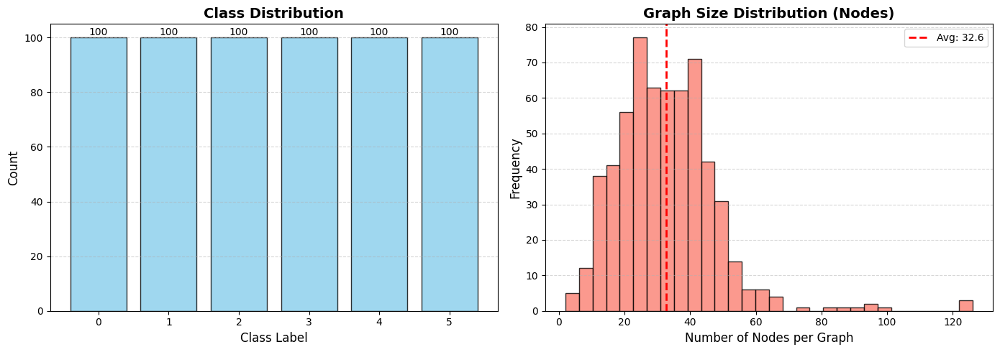

[Visuals] Saved extended dataset info to dataset_info.png
Dataset Features: 21 (Input Dimension)
Starting Main Experiment (10-Fold CV)...

STARTING FOLD 1/10
[Elapsed: 0:11:35] [RAM: 1504.2 MB] --- Fold 1: Initializing GIN ---
[Elapsed: 0:11:35] [RAM: 1504.3 MB] Starting Training Loop...
[Elapsed: 0:11:39] [RAM: 1504.5 MB] Epoch 010 | Train: 1.6678 | Val: 1.7974 (Acc: 0.2833)
[Elapsed: 0:11:42] [RAM: 1504.5 MB] Epoch 020 | Train: 1.6545 | Val: 1.7741 (Acc: 0.2333)
[Elapsed: 0:11:46] [RAM: 1504.5 MB] Epoch 030 | Train: 1.5160 | Val: 1.8172 (Acc: 0.2667)
[Elapsed: 0:11:50] [RAM: 1504.5 MB] Epoch 040 | Train: 1.4783 | Val: 3.3604 (Acc: 0.2333)
[Elapsed: 0:11:53] [RAM: 1504.5 MB] Epoch 050 | Train: 1.4265 | Val: 1.5457 (Acc: 0.4667)
[Elapsed: 0:11:58] [RAM: 1504.6 MB] Epoch 060 | Train: 1.3125 | Val: 1.3340 (Acc: 0.5333)
[Elapsed: 0:12:01] [RAM: 1504.6 MB] Epoch 070 | Train: 1.3317 | Val: 1.5739 (Acc: 0.5167)
[Elapsed: 0:12:04] [RAM: 1504.6 MB] Epoch 080 | Train: 1.2740 | Val: 1.3477 (Acc:

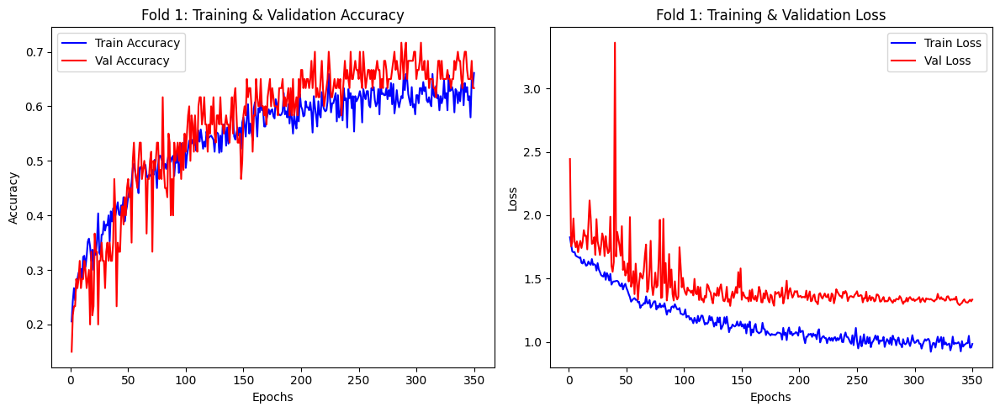

[Elapsed: 0:13:47] [RAM: 1505.4 MB] Loading 'embeddings_fold_1.npz' for Evaluation...

   [Fold 1 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 55.0%   | 56.1%   | 0.804    | 0.12s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_RBF    | 63.3%   | 62.5%   | 0.827    | 0.07s
   RF         | 71.7%   | 72.2%   | 0.877    | 0.71s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 65.0%   | 65.2%   | 0.847    | 2.70s
   >> KMeans ARI: 0.1216
   >> Spectral ARI: 0.1093

Computing t-SNE for cluster comparison...


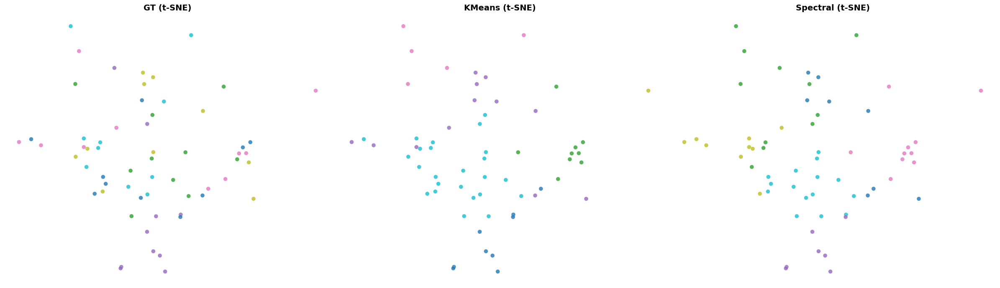

[Visuals] Saved 3-panel cluster comparison to pca_cluster_comparison_fold_1.png
>> Running Stability Analysis for Fold 1...

>> ] Running Analysis for Fold 1...
   > Clean Baseline Acc: 61.67%
[Elapsed: 0:13:52] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:13:52] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:13:52] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:13:52] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:13:52] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:13:52] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:13:52] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:13:52] [RAM: 1532.0 MB] Perturb Dataset...

   [Fold 1 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.6167   | 1.0000
   add        | 5%      | 0.6167   | 0.9966
   add        | 10%      | 0.6167   | 0.9893
   add        | 15%      | 0.5333   | 0.9814
   add        | 20%      | 0.5167   | 0.9662
   remove     | 5%    

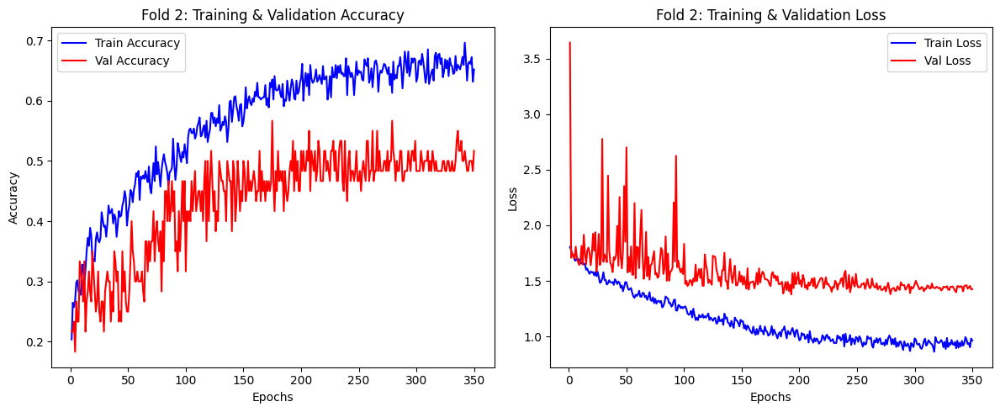

[Elapsed: 0:16:06] [RAM: 1532.0 MB] Loading 'embeddings_fold_2.npz' for Evaluation...

   [Fold 2 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 51.7%   | 51.2%   | 0.818    | 0.16s
   SVM_RBF    | 45.0%   | 43.3%   | 0.829    | 0.12s
   RF         | 53.3%   | 53.2%   | 0.865    | 1.19s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 56.7%   | 54.8%   | 0.852    | 2.94s
   >> KMeans ARI: 0.0569
   >> Spectral ARI: 0.0827

>> Running Stability Analysis for Fold 2...

>> ] Running Analysis for Fold 2...
   > Clean Baseline Acc: 53.33%
[Elapsed: 0:16:11] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:16:11] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:16:11] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:16:11] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:16:11] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:16:11] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:16:11] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:16:11] [RAM: 1532.0 MB] Perturb Dataset...

   [Fold 2 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5333   | 1.0000
   add        | 5%      | 0.5000   | 0.9949
   add        | 10%      | 0.4667   | 0.9821
   add        | 15%      | 0.4667   | 0.9627
   add        | 20%      | 0.4333   | 0.9

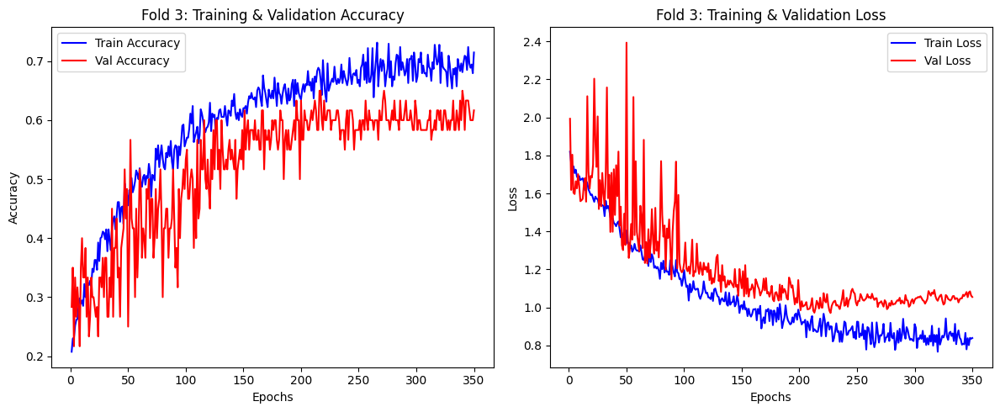

[Elapsed: 0:18:25] [RAM: 1532.0 MB] Loading 'embeddings_fold_3.npz' for Evaluation...

   [Fold 3 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 60.0%   | 60.6%   | 0.884    | 0.07s
   SVM_RBF    | 68.3%   | 69.1%   | 0.901    | 0.06s
   RF         | 65.0%   | 65.4%   | 0.896    | 0.73s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 60.0%   | 60.2%   | 0.882    | 2.80s
   >> KMeans ARI: 0.1616
   >> Spectral ARI: 0.1248

>> Running Stability Analysis for Fold 3...

>> ] Running Analysis for Fold 3...
   > Clean Baseline Acc: 60.00%
[Elapsed: 0:18:29] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:18:29] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:18:29] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:18:29] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:18:29] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:18:29] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:18:29] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:18:29] [RAM: 1532.0 MB] Perturb Dataset...

   [Fold 3 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.6000   | 1.0000
   add        | 5%      | 0.6167   | 0.9925
   add        | 10%      | 0.6167   | 0.9830
   add        | 15%      | 0.4833   | 0.9587
   add        | 20%      | 0.4833   | 0.9

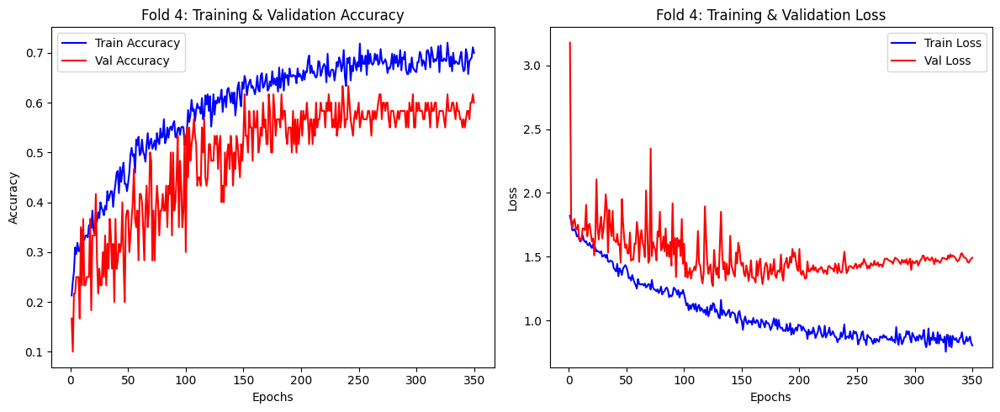

[Elapsed: 0:20:42] [RAM: 1532.0 MB] Loading 'embeddings_fold_4.npz' for Evaluation...

   [Fold 4 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 58.3%   | 57.4%   | 0.837    | 0.10s
   SVM_RBF    | 55.0%   | 54.6%   | 0.837    | 0.06s
   RF         | 61.7%   | 61.4%   | 0.878    | 0.70s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 63.3%   | 63.2%   | 0.848    | 3.50s
   >> KMeans ARI: 0.0684
   >> Spectral ARI: 0.1105

>> Running Stability Analysis for Fold 4...

>> ] Running Analysis for Fold 4...
   > Clean Baseline Acc: 53.33%
[Elapsed: 0:20:47] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:20:47] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:20:47] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:20:47] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:20:47] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:20:47] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:20:47] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:20:47] [RAM: 1532.0 MB] Perturb Dataset...

   [Fold 4 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5333   | 1.0000
   add        | 5%      | 0.5167   | 0.9964
   add        | 10%      | 0.4833   | 0.9896
   add        | 15%      | 0.4333   | 0.9823
   add        | 20%      | 0.4333   | 0.9

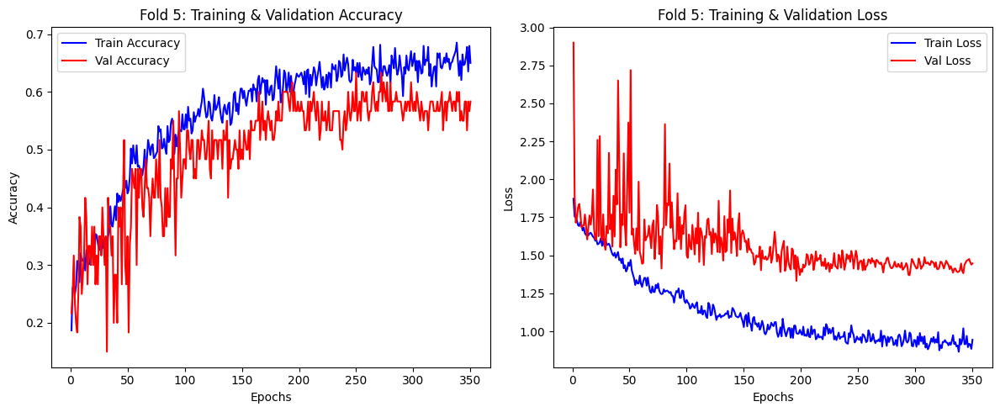

[Elapsed: 0:22:59] [RAM: 1532.0 MB] Loading 'embeddings_fold_5.npz' for Evaluation...

   [Fold 5 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 53.3%   | 52.6%   | 0.804    | 0.12s
   SVM_RBF    | 55.0%   | 54.4%   | 0.850    | 0.07s
   RF         | 63.3%   | 62.6%   | 0.863    | 0.71s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 58.3%   | 58.5%   | 0.846    | 2.67s
   >> KMeans ARI: 0.1069
   >> Spectral ARI: 0.1450

>> Running Stability Analysis for Fold 5...

>> ] Running Analysis for Fold 5...
   > Clean Baseline Acc: 60.00%
[Elapsed: 0:23:03] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:23:03] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:23:03] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:23:03] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:23:03] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:23:03] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:23:03] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:23:03] [RAM: 1532.0 MB] Perturb Dataset...

   [Fold 5 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.6000   | 1.0000
   add        | 5%      | 0.5833   | 0.9955
   add        | 10%      | 0.5333   | 0.9836
   add        | 15%      | 0.5500   | 0.9704
   add        | 20%      | 0.5333   | 0.9

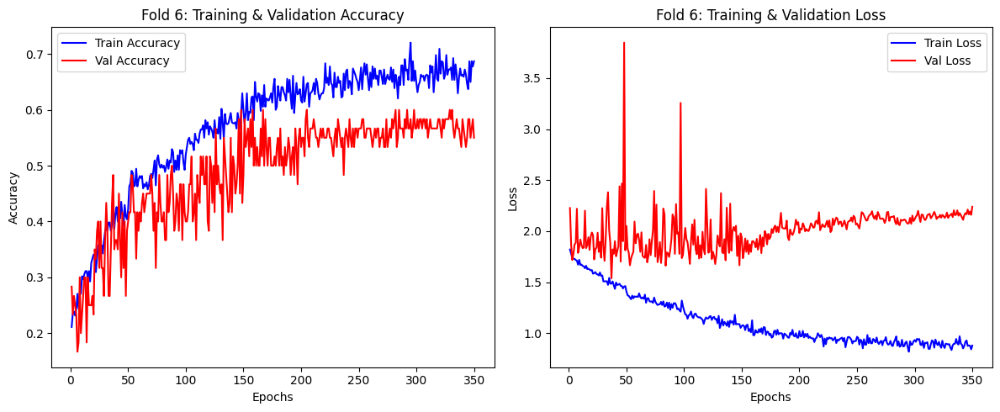

[Elapsed: 0:25:15] [RAM: 1532.0 MB] Loading 'embeddings_fold_6.npz' for Evaluation...

   [Fold 6 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 48.3%   | 47.1%   | 0.733    | 0.15s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_RBF    | 51.7%   | 50.4%   | 0.794    | 0.09s
   RF         | 55.0%   | 55.0%   | 0.833    | 0.71s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 50.0%   | 48.2%   | 0.803    | 2.62s
   >> KMeans ARI: 0.0273
   >> Spectral ARI: 0.1109

>> Running Stability Analysis for Fold 6...

>> ] Running Analysis for Fold 6...
   > Clean Baseline Acc: 48.33%
[Elapsed: 0:25:19] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:25:19] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:25:19] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:25:19] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:25:19] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:25:19] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:25:19] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:25:19] [RAM: 1532.0 MB] Perturb Dataset...

   [Fold 6 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.4833   | 1.0000
   add        | 5%      | 0.4667   | 0.9965
   add        | 10%      | 0.4500   | 0.9899
   add        | 15%      | 0.4500   | 0.9801
   add        | 20%      | 0.4333   | 0.9

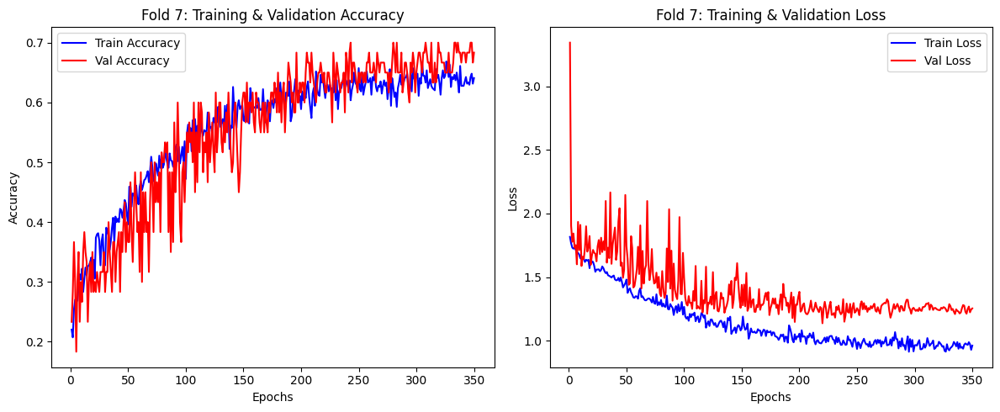

[Elapsed: 0:27:32] [RAM: 1532.0 MB] Loading 'embeddings_fold_7.npz' for Evaluation...

   [Fold 7 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 56.7%   | 56.1%   | 0.844    | 0.10s
   SVM_RBF    | 60.0%   | 58.1%   | 0.852    | 0.06s
   RF         | 66.7%   | 66.0%   | 0.903    | 0.70s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 63.3%   | 63.0%   | 0.872    | 3.57s
   >> KMeans ARI: 0.0986
   >> Spectral ARI: 0.1629

>> Running Stability Analysis for Fold 7...

>> ] Running Analysis for Fold 7...
   > Clean Baseline Acc: 65.00%
[Elapsed: 0:27:37] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:27:37] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:27:37] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:27:37] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:27:37] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:27:37] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:27:37] [RAM: 1532.0 MB] Perturb Dataset...
[Elapsed: 0:27:37] [RAM: 1532.0 MB] Perturb Dataset...

   [Fold 7 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.6500   | 1.0000
   add        | 5%      | 0.6833   | 0.9965
   add        | 10%      | 0.6500   | 0.9852
   add        | 15%      | 0.6833   | 0.9780
   add        | 20%      | 0.6000   | 0.9

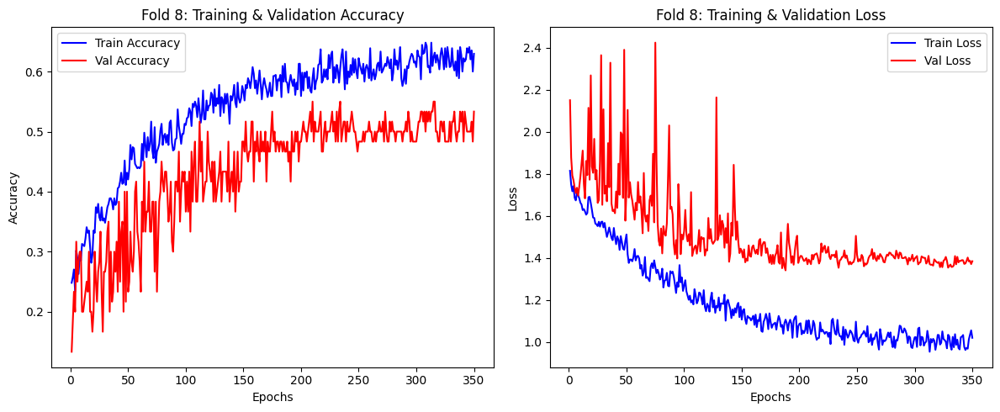

[Elapsed: 0:29:52] [RAM: 1532.2 MB] Loading 'embeddings_fold_8.npz' for Evaluation...

   [Fold 8 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 50.0%   | 49.0%   | 0.818    | 0.14s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_RBF    | 53.3%   | 52.8%   | 0.858    | 0.08s
   RF         | 58.3%   | 58.1%   | 0.873    | 0.72s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 63.3%   | 63.2%   | 0.865    | 2.80s
   >> KMeans ARI: 0.0902
   >> Spectral ARI: 0.0827

>> Running Stability Analysis for Fold 8...

>> ] Running Analysis for Fold 8...
   > Clean Baseline Acc: 48.33%
[Elapsed: 0:29:56] [RAM: 1532.2 MB] Perturb Dataset...
[Elapsed: 0:29:56] [RAM: 1532.2 MB] Perturb Dataset...
[Elapsed: 0:29:56] [RAM: 1532.2 MB] Perturb Dataset...
[Elapsed: 0:29:56] [RAM: 1532.2 MB] Perturb Dataset...
[Elapsed: 0:29:56] [RAM: 1532.2 MB] Perturb Dataset...
[Elapsed: 0:29:56] [RAM: 1532.2 MB] Perturb Dataset...
[Elapsed: 0:29:56] [RAM: 1532.2 MB] Perturb Dataset...
[Elapsed: 0:29:56] [RAM: 1532.2 MB] Perturb Dataset...

   [Fold 8 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.4833   | 1.0000
   add        | 5%      | 0.4500   | 0.9928
   add        | 10%      | 0.4500   | 0.9853
   add        | 15%      | 0.4167   | 0.9681
   add        | 20%      | 0.3667   | 0.9

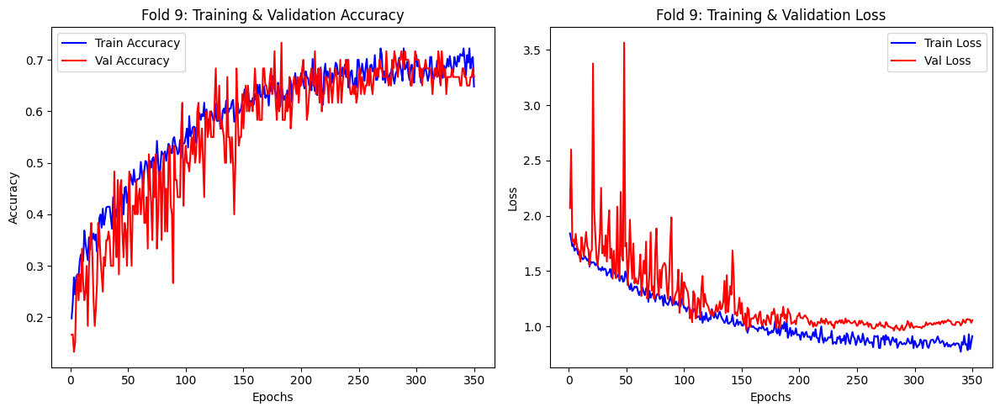

[Elapsed: 0:32:12] [RAM: 1533.1 MB] Loading 'embeddings_fold_9.npz' for Evaluation...

   [Fold 9 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 65.0%   | 64.7%   | 0.875    | 0.07s
   SVM_RBF    | 66.7%   | 66.1%   | 0.907    | 0.05s
   RF         | 66.7%   | 66.0%   | 0.892    | 0.81s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 65.0%   | 64.4%   | 0.920    | 3.43s
   >> KMeans ARI: 0.1182
   >> Spectral ARI: 0.2021

>> Running Stability Analysis for Fold 9...

>> ] Running Analysis for Fold 9...
   > Clean Baseline Acc: 70.00%
[Elapsed: 0:32:17] [RAM: 1533.1 MB] Perturb Dataset...
[Elapsed: 0:32:17] [RAM: 1533.1 MB] Perturb Dataset...
[Elapsed: 0:32:17] [RAM: 1533.1 MB] Perturb Dataset...
[Elapsed: 0:32:17] [RAM: 1533.1 MB] Perturb Dataset...
[Elapsed: 0:32:17] [RAM: 1533.1 MB] Perturb Dataset...
[Elapsed: 0:32:17] [RAM: 1533.1 MB] Perturb Dataset...
[Elapsed: 0:32:17] [RAM: 1533.1 MB] Perturb Dataset...
[Elapsed: 0:32:17] [RAM: 1533.1 MB] Perturb Dataset...

   [Fold 9 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.7000   | 1.0000
   add        | 5%      | 0.7333   | 0.9926
   add        | 10%      | 0.6333   | 0.9771
   add        | 15%      | 0.6500   | 0.9551
   add        | 20%      | 0.6333   | 0.9

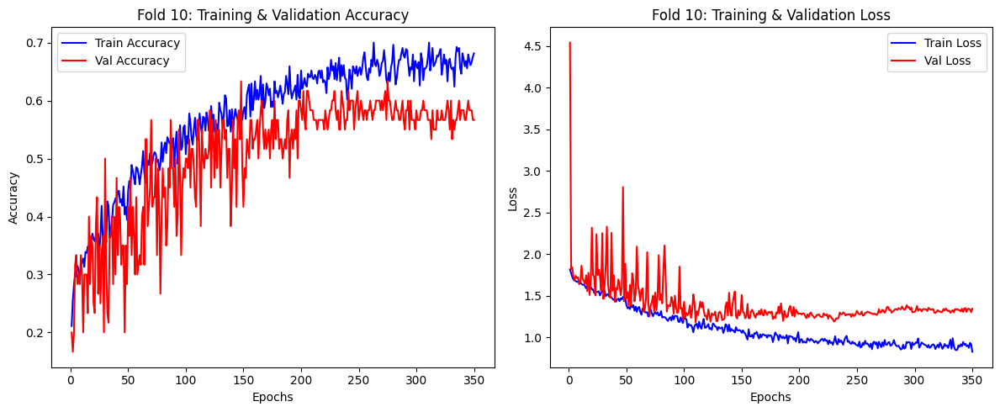

[Elapsed: 0:34:31] [RAM: 1534.1 MB] Loading 'embeddings_fold_10.npz' for Evaluation...

   [Fold 10 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 55.0%   | 55.5%   | 0.846    | 0.12s
   SVM_RBF    | 66.7%   | 67.6%   | 0.899    | 0.07s
   RF         | 65.0%   | 64.7%   | 0.874    | 0.71s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 71.7%   | 71.8%   | 0.887    | 2.74s
   >> KMeans ARI: 0.0987
   >> Spectral ARI: 0.1772

>> Running Stability Analysis for Fold 10...

>> ] Running Analysis for Fold 10...
   > Clean Baseline Acc: 56.67%
[Elapsed: 0:34:35] [RAM: 1534.1 MB] Perturb Dataset...
[Elapsed: 0:34:35] [RAM: 1534.1 MB] Perturb Dataset...
[Elapsed: 0:34:35] [RAM: 1534.1 MB] Perturb Dataset...
[Elapsed: 0:34:35] [RAM: 1534.1 MB] Perturb Dataset...
[Elapsed: 0:34:35] [RAM: 1534.1 MB] Perturb Dataset...
[Elapsed: 0:34:35] [RAM: 1534.1 MB] Perturb Dataset...
[Elapsed: 0:34:35] [RAM: 1534.1 MB] Perturb Dataset...
[Elapsed: 0:34:35] [RAM: 1534.1 MB] Perturb Dataset...

   [Fold 10 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5667   | 1.0000
   add        | 5%      | 0.5667   | 0.9934
   add        | 10%      | 0.5833   | 0.9852
   add        | 15%      | 0.5500   | 0.9657
   add        | 20%      | 0.5333   | 

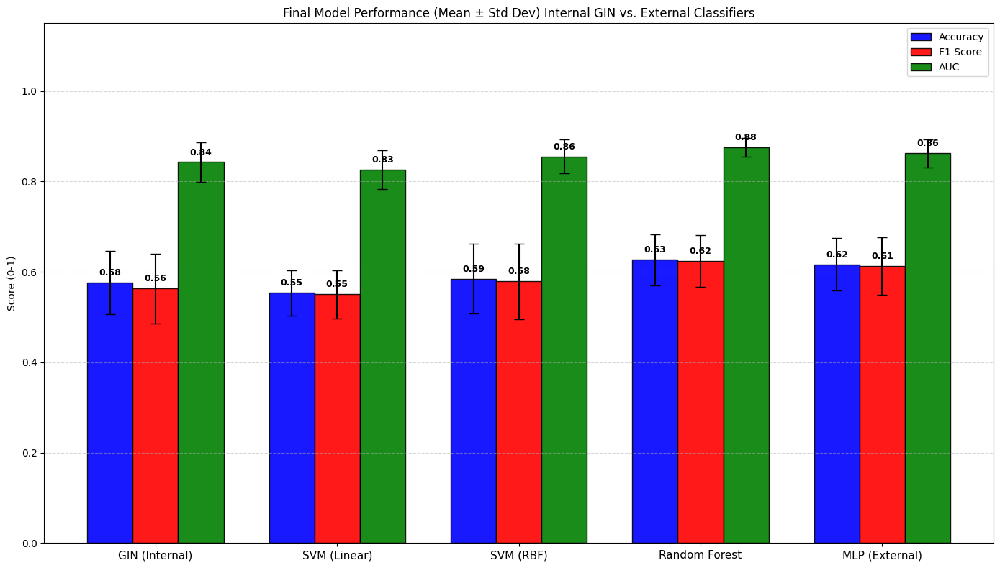

[Visuals] Saved final summary to final_performance.png


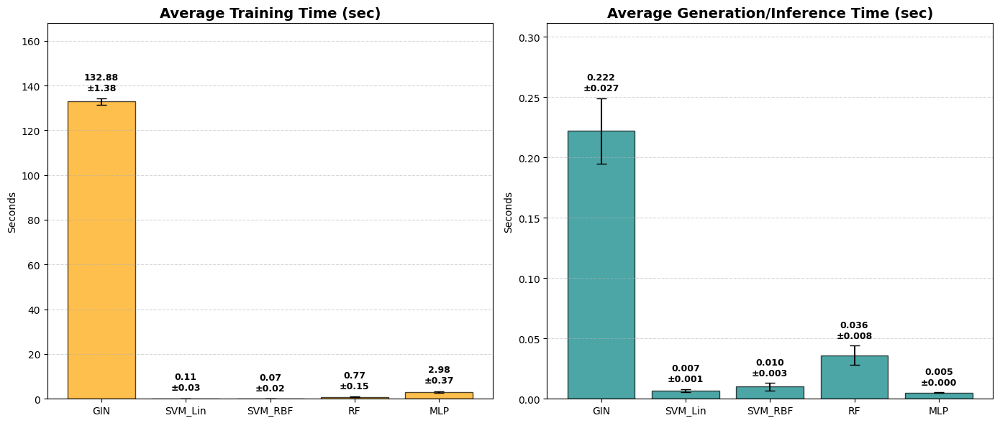

[Visuals] Saved resource usage report to resource_usage.png

      RESOURCE CONSUMPTION REPORT (Mean ± Std)
Method     | Train Time (s)       | Gen Time (s)         | Peak RAM (MB)  
---------------------------------------------------------------------------
GIN        | 132.88 ± 1.38        | 0.22 ± 0.03          | 0.45 ± 0.01    
SVM_Lin    | 0.11 ± 0.03          | 0.01 ± 0.00          | -
SVM_RBF    | 0.07 ± 0.02          | 0.01 ± 0.00          | -
RF         | 0.77 ± 0.15          | 0.04 ± 0.01          | -
MLP        | 2.98 ± 0.37          | 0.01 ± 0.00          | -


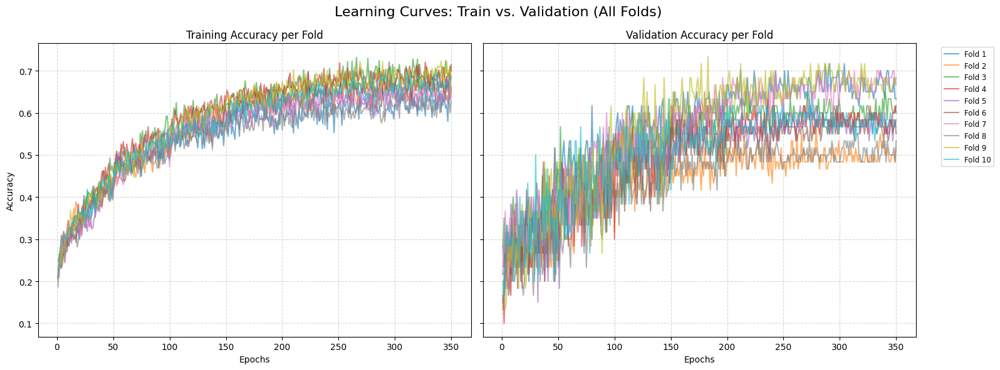

[Visuals] Saved training curves: fold_training_curves.png


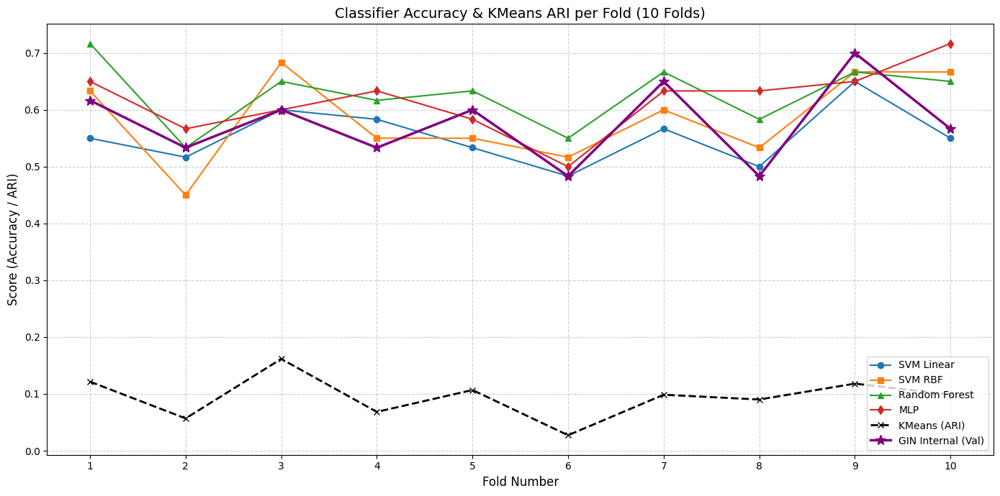

[Visuals] Saved fold performance plot: fold_performance.png
>> Generating Dual Stability Summary Plot to final_stability_bar_chart.png...
!! WARNING: stability_detailed_ALL_FOLDS.csv not found. Cannot plot Cosine Similarity.

>> Merging detailed stability reports...
[Data] Saved master stability file: stability_detailed_ALL_FOLDS.csv
>> Generating Robustness Curve for Model_Accuracy...


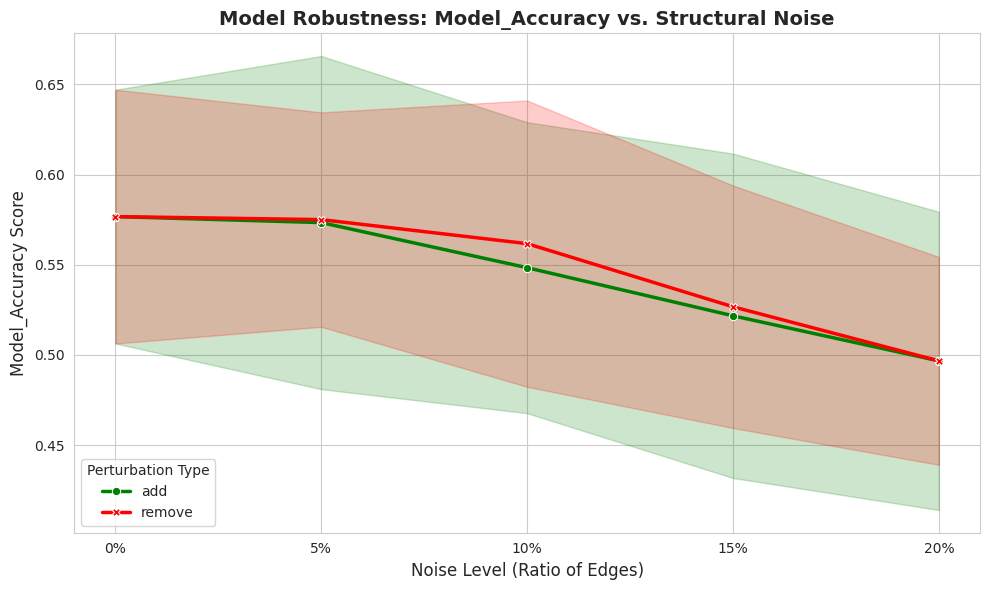

[Plots] Saved robustness curve to robustness_model_acc.png
>> Generating Robustness Curve for Cosine_Similarity...


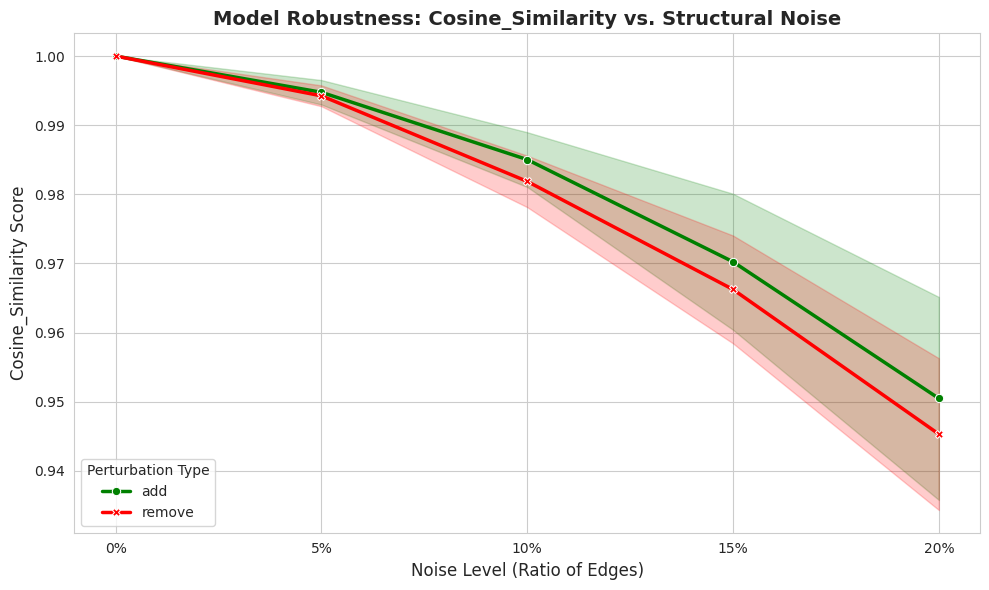

[Plots] Saved robustness curve to robustness_cosine_sim.png

Pipeline Finished in 23.11 minutes.


In [ ]:
# ==============================================================================
# CONFIGURATION
# ==============================================================================
DATASET_NAME = 'ENZYMES'
run_pipeline(run_dataset_analysis=True, run_main_experiment=True, enable_stability=True)

In [ ]:
!zip -r /content/enzymes_steplrnoearlystopping.zip /content/*.npz /content/*.csv /content/*.png /content/*.json /content/*.pth

  adding: content/embeddings_fold_10.npz (deflated 12%)
  adding: content/embeddings_fold_1.npz (deflated 12%)
  adding: content/embeddings_fold_2.npz (deflated 12%)
  adding: content/embeddings_fold_3.npz (deflated 12%)
  adding: content/embeddings_fold_4.npz (deflated 12%)
  adding: content/embeddings_fold_5.npz (deflated 12%)
  adding: content/embeddings_fold_6.npz (deflated 12%)
  adding: content/embeddings_fold_7.npz (deflated 12%)
  adding: content/embeddings_fold_8.npz (deflated 12%)
  adding: content/embeddings_fold_9.npz (deflated 12%)
  adding: content/experiment_results.csv (deflated 63%)
  adding: content/stability_detailed_ALL_FOLDS.csv (deflated 70%)
  adding: content/stability_fold_10_detailed.csv (deflated 51%)
  adding: content/stability_fold_1_detailed.csv (deflated 55%)
  adding: content/stability_fold_2_detailed.csv (deflated 52%)
  adding: content/stability_fold_3_detailed.csv (deflated 50%)
  adding: content/stability_fold_4_detailed.csv (deflated 53%)
  adding: c

STARTING PIPELINE
Loading ENZYMES

Running Dataset Analysis & Plotting...

      DATASET SUMMARY
Total Graphs:    600
Num Classes:     6
Avg Nodes/Graph: 32.63 (Min: 2, Max: 126)
Avg Edges/Graph: 124.27 (Min: 2, Max: 298)
----------------------------------------


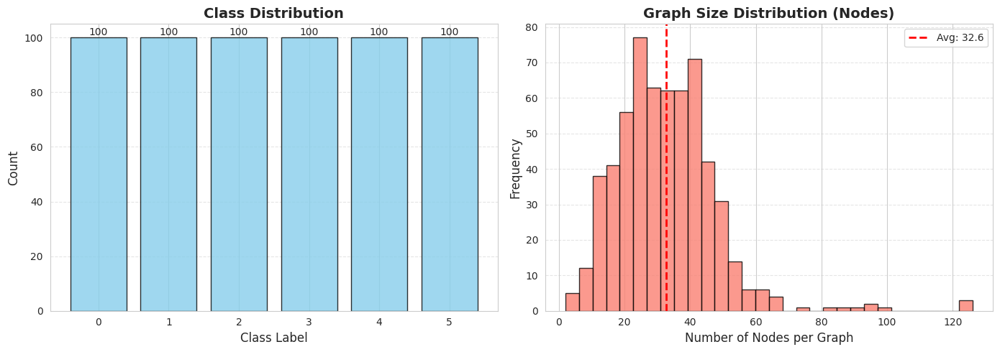

[Visuals] Saved extended dataset info to dataset_info.png
Dataset Features: 21 (Input Dimension)
Starting Main Experiment (10-Fold CV)...

STARTING FOLD 1/10
[Elapsed: 0:39:16] [RAM: 1564.6 MB] --- Fold 1: Initializing GIN ---
[Elapsed: 0:39:16] [RAM: 1564.8 MB] Starting Training Loop...
[Elapsed: 0:39:20] [RAM: 1564.9 MB] Epoch 010 | Train: 1.6802 | Val: 1.7541 (Acc: 0.2333) | Patience: 5/50
[Elapsed: 0:39:24] [RAM: 1564.9 MB] Epoch 020 | Train: 1.5599 | Val: 1.8566 (Acc: 0.3167) | Patience: 2/50
[Elapsed: 0:39:27] [RAM: 1564.9 MB] Epoch 030 | Train: 1.5225 | Val: 1.5893 (Acc: 0.3333) | Patience: 0/50
[Elapsed: 0:39:31] [RAM: 1564.9 MB] Epoch 040 | Train: 1.4639 | Val: 1.6513 (Acc: 0.3500) | Patience: 6/50
[Elapsed: 0:39:35] [RAM: 1564.9 MB] Epoch 050 | Train: 1.4159 | Val: 3.0497 (Acc: 0.2833) | Patience: 4/50
[Elapsed: 0:39:38] [RAM: 1564.9 MB] Epoch 060 | Train: 1.3298 | Val: 1.5671 (Acc: 0.3667) | Patience: 8/50
[Elapsed: 0:39:42] [RAM: 1564.9 MB] Epoch 070 | Train: 1.2598 | Val: 

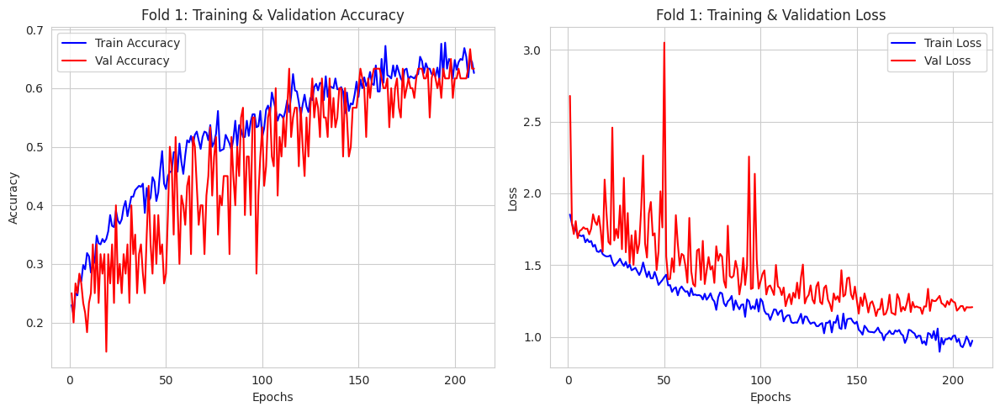

[Elapsed: 0:40:36] [RAM: 1565.1 MB] Loading 'embeddings_fold_1.npz' for Evaluation...

   [Fold 1 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 55.0%   | 55.0%   | 0.840    | 0.09s
   SVM_RBF    | 58.3%   | 58.7%   | 0.869    | 0.06s
   RF         | 65.0%   | 64.7%   | 0.873    | 0.70s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 60.0%   | 60.2%   | 0.880    | 2.63s
   >> KMeans ARI: 0.1661
   >> Spectral ARI: 0.1288

Computing t-SNE for cluster comparison...


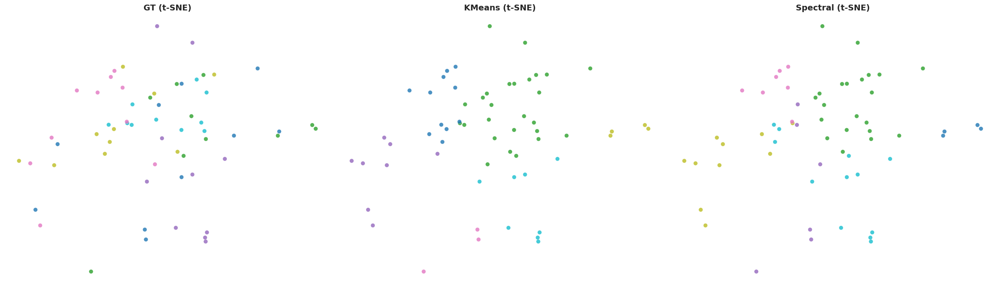

[Visuals] Saved 3-panel cluster comparison to pca_cluster_comparison_fold_1.png
>> Running Stability Analysis for Fold 1...

>> ] Running Analysis for Fold 1...
   > Clean Baseline Acc: 63.33%
[Elapsed: 0:40:41] [RAM: 1565.4 MB] Perturb Dataset...
[Elapsed: 0:40:41] [RAM: 1565.4 MB] Perturb Dataset...
[Elapsed: 0:40:41] [RAM: 1565.5 MB] Perturb Dataset...
[Elapsed: 0:40:41] [RAM: 1565.5 MB] Perturb Dataset...
[Elapsed: 0:40:41] [RAM: 1565.5 MB] Perturb Dataset...
[Elapsed: 0:40:41] [RAM: 1565.5 MB] Perturb Dataset...
[Elapsed: 0:40:41] [RAM: 1565.5 MB] Perturb Dataset...
[Elapsed: 0:40:41] [RAM: 1565.5 MB] Perturb Dataset...

   [Fold 1 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.6333   | 1.0000
   add        | 5%      | 0.6000   | 0.9954
   add        | 10%      | 0.6000   | 0.9861
   add        | 15%      | 0.6167   | 0.9746
   add        | 20%      | 0.6333   | 0.9607
   remove     | 5%    

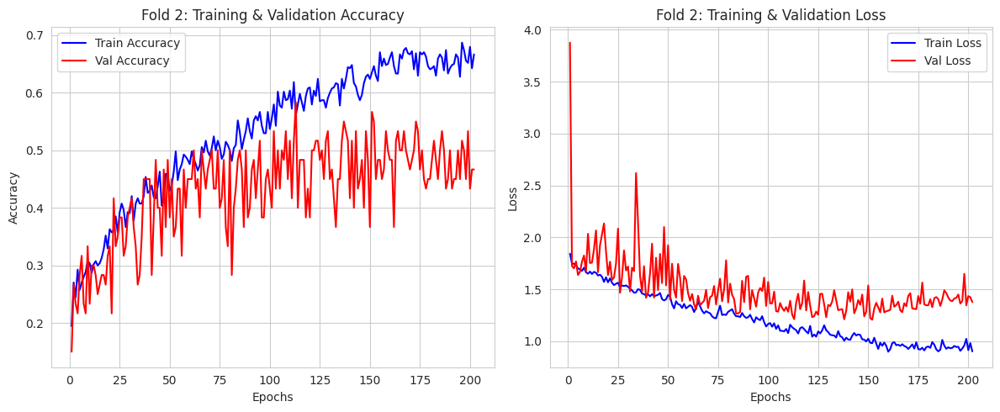

[Elapsed: 0:42:00] [RAM: 1565.9 MB] Loading 'embeddings_fold_2.npz' for Evaluation...

   [Fold 2 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 46.7%   | 46.6%   | 0.808    | 0.09s
   SVM_RBF    | 55.0%   | 55.7%   | 0.811    | 0.06s
   RF         | 58.3%   | 59.4%   | 0.850    | 0.71s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 51.7%   | 51.1%   | 0.807    | 2.69s
   >> KMeans ARI: 0.0789
   >> Spectral ARI: 0.0700

>> Running Stability Analysis for Fold 2...

>> ] Running Analysis for Fold 2...
   > Clean Baseline Acc: 55.00%
[Elapsed: 0:42:03] [RAM: 1565.9 MB] Perturb Dataset...
[Elapsed: 0:42:03] [RAM: 1565.9 MB] Perturb Dataset...
[Elapsed: 0:42:03] [RAM: 1565.9 MB] Perturb Dataset...
[Elapsed: 0:42:03] [RAM: 1565.9 MB] Perturb Dataset...
[Elapsed: 0:42:03] [RAM: 1565.9 MB] Perturb Dataset...
[Elapsed: 0:42:03] [RAM: 1565.9 MB] Perturb Dataset...
[Elapsed: 0:42:03] [RAM: 1565.9 MB] Perturb Dataset...
[Elapsed: 0:42:03] [RAM: 1565.9 MB] Perturb Dataset...

   [Fold 2 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5500   | 1.0000
   add        | 5%      | 0.5333   | 0.9939
   add        | 10%      | 0.5167   | 0.9865
   add        | 15%      | 0.5167   | 0.9711
   add        | 20%      | 0.4333   | 0.9

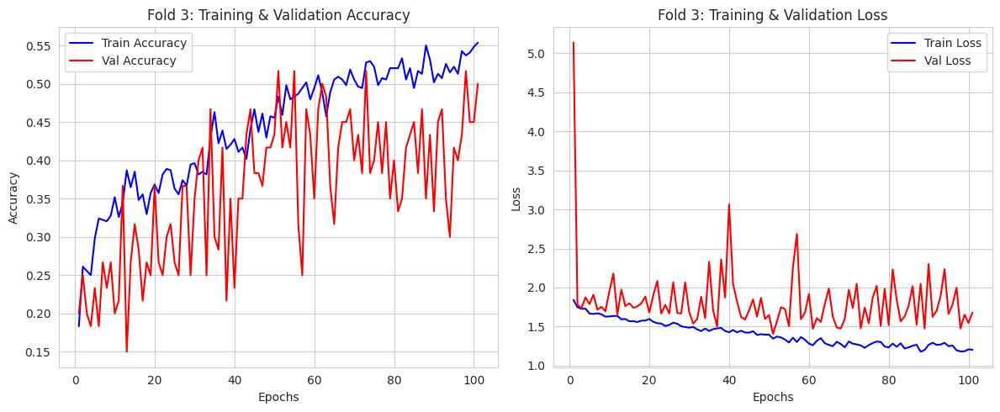

[Elapsed: 0:42:43] [RAM: 1566.3 MB] Loading 'embeddings_fold_3.npz' for Evaluation...

   [Fold 3 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 50.0%   | 50.1%   | 0.808    | 0.18s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_RBF    | 56.7%   | 55.7%   | 0.831    | 0.08s
   RF         | 60.0%   | 60.7%   | 0.872    | 0.71s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 58.3%   | 58.0%   | 0.841    | 3.63s
   >> KMeans ARI: 0.0313
   >> Spectral ARI: 0.0671

>> Running Stability Analysis for Fold 3...

>> ] Running Analysis for Fold 3...
   > Clean Baseline Acc: 51.67%
[Elapsed: 0:42:48] [RAM: 1566.3 MB] Perturb Dataset...
[Elapsed: 0:42:48] [RAM: 1566.3 MB] Perturb Dataset...
[Elapsed: 0:42:48] [RAM: 1566.3 MB] Perturb Dataset...
[Elapsed: 0:42:48] [RAM: 1566.3 MB] Perturb Dataset...
[Elapsed: 0:42:48] [RAM: 1566.3 MB] Perturb Dataset...
[Elapsed: 0:42:48] [RAM: 1566.3 MB] Perturb Dataset...
[Elapsed: 0:42:48] [RAM: 1566.3 MB] Perturb Dataset...
[Elapsed: 0:42:48] [RAM: 1566.3 MB] Perturb Dataset...

   [Fold 3 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5167   | 1.0000
   add        | 5%      | 0.4833   | 0.9963
   add        | 10%      | 0.4667   | 0.9859
   add        | 15%      | 0.4833   | 0.9701
   add        | 20%      | 0.4667   | 0.9

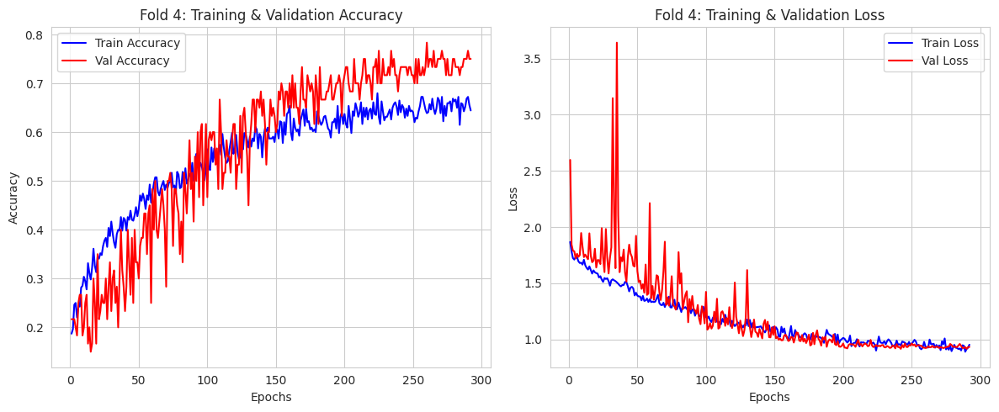

[Elapsed: 0:44:42] [RAM: 1566.9 MB] Loading 'embeddings_fold_4.npz' for Evaluation...

   [Fold 4 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 56.7%   | 55.7%   | 0.888    | 0.10s
   SVM_RBF    | 70.0%   | 69.0%   | 0.917    | 0.07s
   RF         | 75.0%   | 75.0%   | 0.933    | 0.74s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 71.7%   | 71.2%   | 0.924    | 2.79s
   >> KMeans ARI: 0.1298
   >> Spectral ARI: 0.2692

>> Running Stability Analysis for Fold 4...

>> ] Running Analysis for Fold 4...
   > Clean Baseline Acc: 73.33%
[Elapsed: 0:44:46] [RAM: 1566.9 MB] Perturb Dataset...
[Elapsed: 0:44:46] [RAM: 1566.9 MB] Perturb Dataset...
[Elapsed: 0:44:46] [RAM: 1566.9 MB] Perturb Dataset...
[Elapsed: 0:44:46] [RAM: 1566.9 MB] Perturb Dataset...
[Elapsed: 0:44:46] [RAM: 1566.9 MB] Perturb Dataset...
[Elapsed: 0:44:46] [RAM: 1566.9 MB] Perturb Dataset...
[Elapsed: 0:44:46] [RAM: 1566.9 MB] Perturb Dataset...
[Elapsed: 0:44:46] [RAM: 1566.9 MB] Perturb Dataset...

   [Fold 4 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.7333   | 1.0000
   add        | 5%      | 0.7500   | 0.9941
   add        | 10%      | 0.6833   | 0.9808
   add        | 15%      | 0.6667   | 0.9747
   add        | 20%      | 0.5667   | 0.9

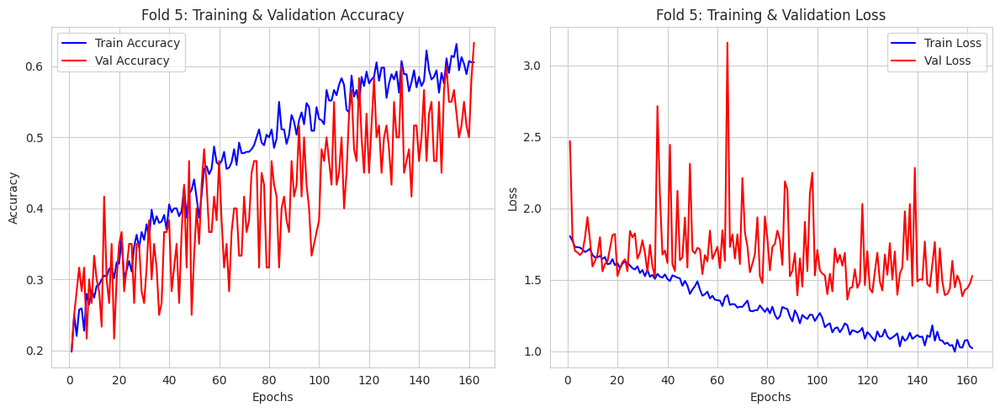

[Elapsed: 0:45:50] [RAM: 1567.6 MB] Loading 'embeddings_fold_5.npz' for Evaluation...

   [Fold 5 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 51.7%   | 50.1%   | 0.793    | 0.11s
   SVM_RBF    | 53.3%   | 51.4%   | 0.851    | 0.07s
   RF         | 56.7%   | 54.3%   | 0.842    | 0.72s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 63.3%   | 62.3%   | 0.836    | 2.74s
   >> KMeans ARI: 0.0647
   >> Spectral ARI: 0.0934

>> Running Stability Analysis for Fold 5...

>> ] Running Analysis for Fold 5...
   > Clean Baseline Acc: 53.33%
[Elapsed: 0:45:54] [RAM: 1567.6 MB] Perturb Dataset...
[Elapsed: 0:45:54] [RAM: 1567.6 MB] Perturb Dataset...
[Elapsed: 0:45:54] [RAM: 1567.6 MB] Perturb Dataset...
[Elapsed: 0:45:54] [RAM: 1567.6 MB] Perturb Dataset...
[Elapsed: 0:45:54] [RAM: 1567.6 MB] Perturb Dataset...
[Elapsed: 0:45:54] [RAM: 1567.6 MB] Perturb Dataset...
[Elapsed: 0:45:54] [RAM: 1567.6 MB] Perturb Dataset...
[Elapsed: 0:45:54] [RAM: 1567.6 MB] Perturb Dataset...

   [Fold 5 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5333   | 1.0000
   add        | 5%      | 0.5000   | 0.9955
   add        | 10%      | 0.4500   | 0.9859
   add        | 15%      | 0.4667   | 0.9690
   add        | 20%      | 0.4333   | 0.9

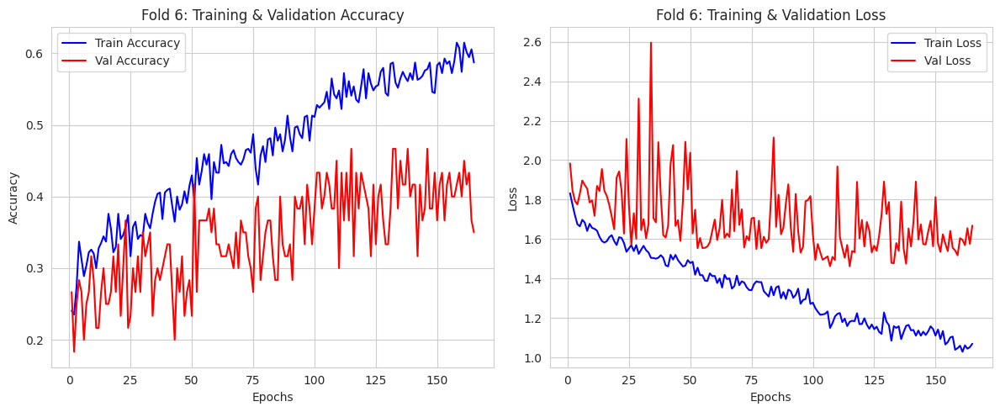

[Elapsed: 0:46:58] [RAM: 1568.3 MB] Loading 'embeddings_fold_6.npz' for Evaluation...

   [Fold 6 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 40.0%   | 39.0%   | 0.766    | 0.12s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_RBF    | 46.7%   | 45.1%   | 0.767    | 0.07s
   RF         | 53.3%   | 52.7%   | 0.775    | 0.86s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 55.0%   | 54.4%   | 0.769    | 3.47s
   >> KMeans ARI: 0.0937
   >> Spectral ARI: 0.1145

>> Running Stability Analysis for Fold 6...

>> ] Running Analysis for Fold 6...
   > Clean Baseline Acc: 46.67%
[Elapsed: 0:47:03] [RAM: 1568.3 MB] Perturb Dataset...
[Elapsed: 0:47:03] [RAM: 1568.3 MB] Perturb Dataset...
[Elapsed: 0:47:03] [RAM: 1568.3 MB] Perturb Dataset...
[Elapsed: 0:47:03] [RAM: 1568.3 MB] Perturb Dataset...
[Elapsed: 0:47:03] [RAM: 1568.3 MB] Perturb Dataset...
[Elapsed: 0:47:03] [RAM: 1568.3 MB] Perturb Dataset...
[Elapsed: 0:47:03] [RAM: 1568.3 MB] Perturb Dataset...
[Elapsed: 0:47:03] [RAM: 1568.3 MB] Perturb Dataset...

   [Fold 6 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.4667   | 1.0000
   add        | 5%      | 0.4167   | 0.9946
   add        | 10%      | 0.4500   | 0.9887
   add        | 15%      | 0.4333   | 0.9726
   add        | 20%      | 0.4167   | 0.9

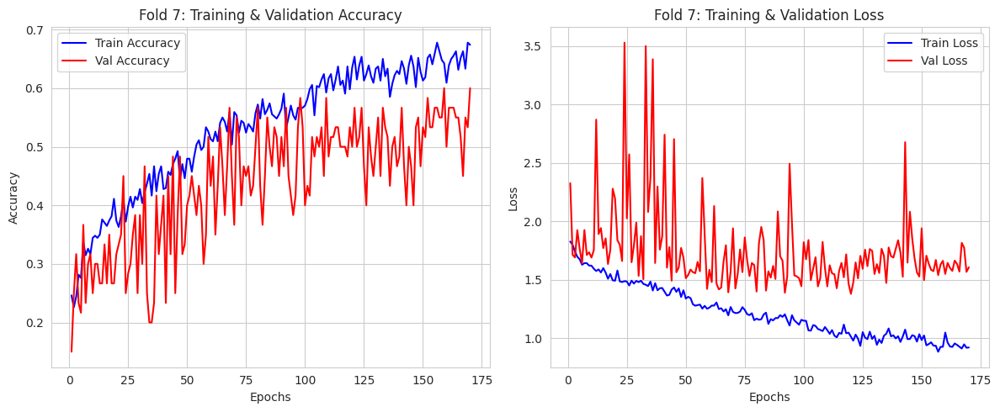

[Elapsed: 0:48:18] [RAM: 1569.0 MB] Loading 'embeddings_fold_7.npz' for Evaluation...

   [Fold 7 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 46.7%   | 46.8%   | 0.770    | 0.09s
   SVM_RBF    | 61.7%   | 61.6%   | 0.802    | 0.06s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   RF         | 58.3%   | 58.7%   | 0.805    | 0.74s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 46.7%   | 46.8%   | 0.784    | 2.75s
   >> KMeans ARI: 0.0372
   >> Spectral ARI: 0.1407

>> Running Stability Analysis for Fold 7...

>> ] Running Analysis for Fold 7...
   > Clean Baseline Acc: 50.00%
[Elapsed: 0:48:21] [RAM: 1569.0 MB] Perturb Dataset...
[Elapsed: 0:48:21] [RAM: 1569.0 MB] Perturb Dataset...
[Elapsed: 0:48:21] [RAM: 1569.0 MB] Perturb Dataset...
[Elapsed: 0:48:21] [RAM: 1569.0 MB] Perturb Dataset...
[Elapsed: 0:48:21] [RAM: 1569.0 MB] Perturb Dataset...
[Elapsed: 0:48:21] [RAM: 1569.0 MB] Perturb Dataset...
[Elapsed: 0:48:21] [RAM: 1569.0 MB] Perturb Dataset...
[Elapsed: 0:48:21] [RAM: 1569.0 MB] Perturb Dataset...

   [Fold 7 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5000   | 1.0000
   add        | 5%      | 0.5000   | 0.9960
   add        | 10%      | 0.5167   | 0.9868
   add        | 15%      | 0.4833   | 0.9763
   add        | 20%      | 0.4667   | 0.9

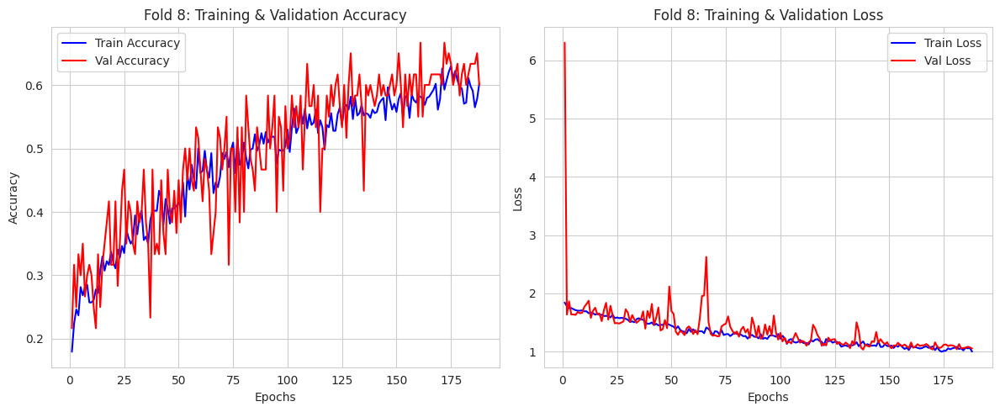

[Elapsed: 0:49:35] [RAM: 1569.8 MB] Loading 'embeddings_fold_8.npz' for Evaluation...

   [Fold 8 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 60.0%   | 59.5%   | 0.834    | 0.12s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_RBF    | 61.7%   | 61.9%   | 0.886    | 0.07s
   RF         | 66.7%   | 66.9%   | 0.902    | 0.76s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 66.7%   | 66.4%   | 0.909    | 3.51s
   >> KMeans ARI: 0.1559
   >> Spectral ARI: 0.2530

>> Running Stability Analysis for Fold 8...

>> ] Running Analysis for Fold 8...
   > Clean Baseline Acc: 60.00%
[Elapsed: 0:49:40] [RAM: 1569.8 MB] Perturb Dataset...
[Elapsed: 0:49:40] [RAM: 1569.8 MB] Perturb Dataset...
[Elapsed: 0:49:40] [RAM: 1569.8 MB] Perturb Dataset...
[Elapsed: 0:49:40] [RAM: 1569.8 MB] Perturb Dataset...
[Elapsed: 0:49:40] [RAM: 1569.8 MB] Perturb Dataset...
[Elapsed: 0:49:40] [RAM: 1569.8 MB] Perturb Dataset...
[Elapsed: 0:49:40] [RAM: 1569.8 MB] Perturb Dataset...
[Elapsed: 0:49:40] [RAM: 1569.8 MB] Perturb Dataset...

   [Fold 8 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.6000   | 1.0000
   add        | 5%      | 0.6167   | 0.9940
   add        | 10%      | 0.6000   | 0.9820
   add        | 15%      | 0.6000   | 0.9700
   add        | 20%      | 0.5167   | 0.9

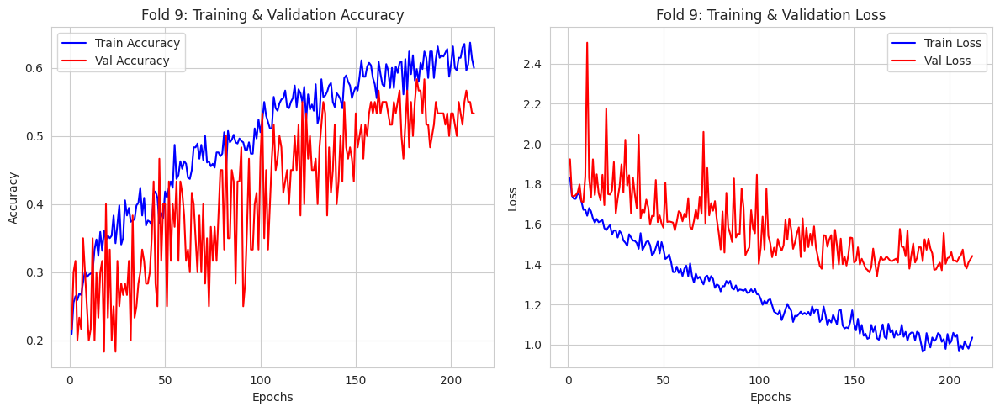

[Elapsed: 0:51:03] [RAM: 1570.6 MB] Loading 'embeddings_fold_9.npz' for Evaluation...

   [Fold 9 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 56.7%   | 55.5%   | 0.797    | 0.15s
   SVM_RBF    | 56.7%   | 56.2%   | 0.851    | 0.13s
   RF         | 60.0%   | 60.6%   | 0.842    | 1.17s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 63.3%   | 63.5%   | 0.868    | 3.03s
   >> KMeans ARI: 0.0916
   >> Spectral ARI: 0.0674

>> Running Stability Analysis for Fold 9...

>> ] Running Analysis for Fold 9...
   > Clean Baseline Acc: 56.67%
[Elapsed: 0:51:07] [RAM: 1570.6 MB] Perturb Dataset...
[Elapsed: 0:51:07] [RAM: 1570.6 MB] Perturb Dataset...
[Elapsed: 0:51:07] [RAM: 1570.6 MB] Perturb Dataset...
[Elapsed: 0:51:07] [RAM: 1570.6 MB] Perturb Dataset...
[Elapsed: 0:51:07] [RAM: 1570.6 MB] Perturb Dataset...
[Elapsed: 0:51:08] [RAM: 1570.6 MB] Perturb Dataset...
[Elapsed: 0:51:08] [RAM: 1570.6 MB] Perturb Dataset...
[Elapsed: 0:51:08] [RAM: 1570.6 MB] Perturb Dataset...

   [Fold 9 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5667   | 1.0000
   add        | 5%      | 0.5333   | 0.9948
   add        | 10%      | 0.5500   | 0.9807
   add        | 15%      | 0.5167   | 0.9575
   add        | 20%      | 0.4833   | 0.9

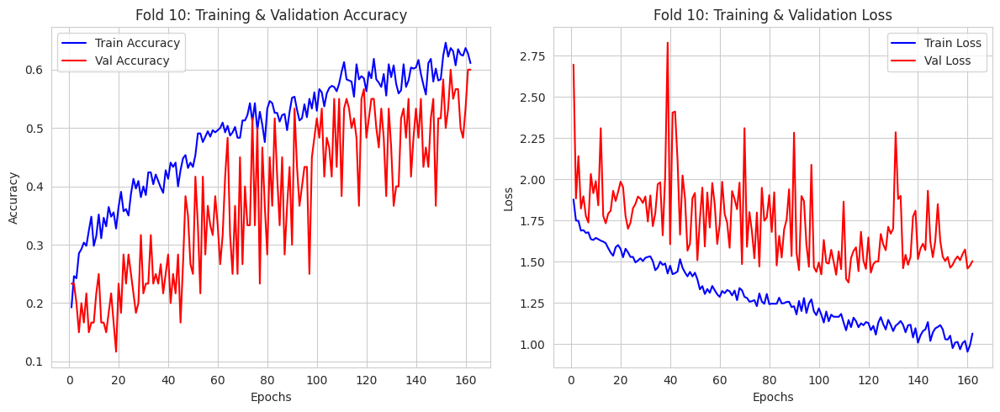

[Elapsed: 0:52:12] [RAM: 1571.6 MB] Loading 'embeddings_fold_10.npz' for Evaluation...

   [Fold 10 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 46.7%   | 44.0%   | 0.779    | 0.12s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_RBF    | 53.3%   | 52.4%   | 0.823    | 0.07s
   RF         | 51.7%   | 50.5%   | 0.848    | 0.75s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 56.7%   | 56.1%   | 0.825    | 3.13s
   >> KMeans ARI: 0.0014
   >> Spectral ARI: 0.0646

>> Running Stability Analysis for Fold 10...

>> ] Running Analysis for Fold 10...
   > Clean Baseline Acc: 55.00%
[Elapsed: 0:52:16] [RAM: 1571.6 MB] Perturb Dataset...
[Elapsed: 0:52:16] [RAM: 1571.6 MB] Perturb Dataset...
[Elapsed: 0:52:16] [RAM: 1571.6 MB] Perturb Dataset...
[Elapsed: 0:52:16] [RAM: 1571.6 MB] Perturb Dataset...
[Elapsed: 0:52:16] [RAM: 1571.6 MB] Perturb Dataset...
[Elapsed: 0:52:16] [RAM: 1571.6 MB] Perturb Dataset...
[Elapsed: 0:52:16] [RAM: 1571.6 MB] Perturb Dataset...
[Elapsed: 0:52:16] [RAM: 1571.6 MB] Perturb Dataset...

   [Fold 10 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5500   | 1.0000
   add        | 5%      | 0.5333   | 0.9942
   add        | 10%      | 0.5333   | 0.9915
   add        | 15%      | 0.5000   | 0.9733
   add        | 20%      | 0.5000   | 

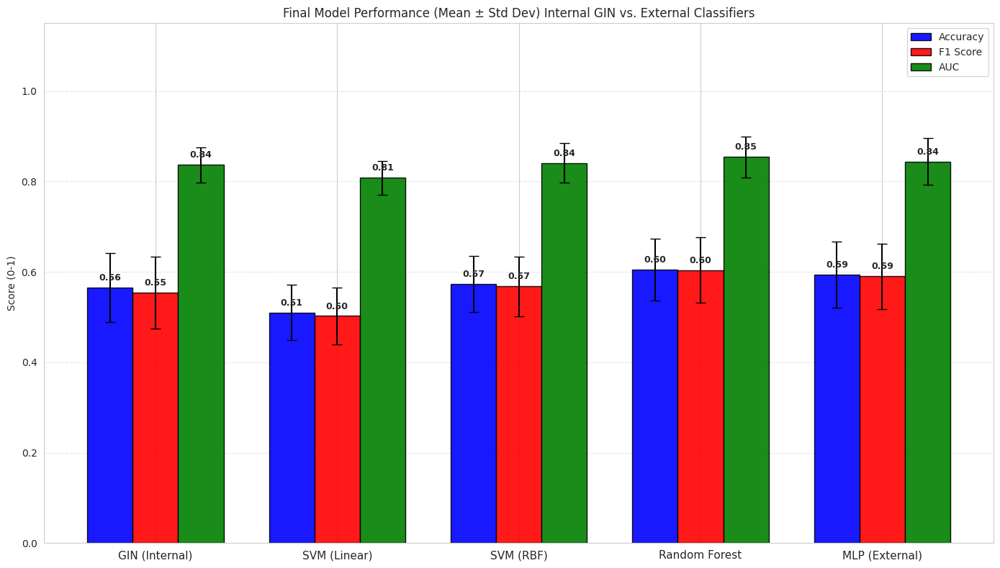

[Visuals] Saved final summary to final_performance.png


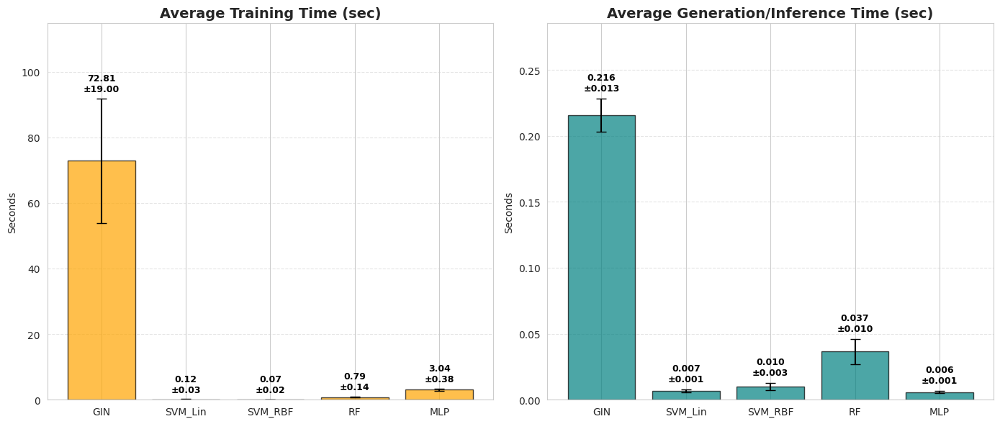

[Visuals] Saved resource usage report to resource_usage.png

      RESOURCE CONSUMPTION REPORT (Mean ± Std)
Method     | Train Time (s)       | Gen Time (s)         | Peak RAM (MB)  
---------------------------------------------------------------------------
GIN        | 72.81 ± 19.00        | 0.22 ± 0.01          | 0.43 ± 0.01    
SVM_Lin    | 0.12 ± 0.03          | 0.01 ± 0.00          | -
SVM_RBF    | 0.07 ± 0.02          | 0.01 ± 0.00          | -
RF         | 0.79 ± 0.14          | 0.04 ± 0.01          | -
MLP        | 3.04 ± 0.38          | 0.01 ± 0.00          | -


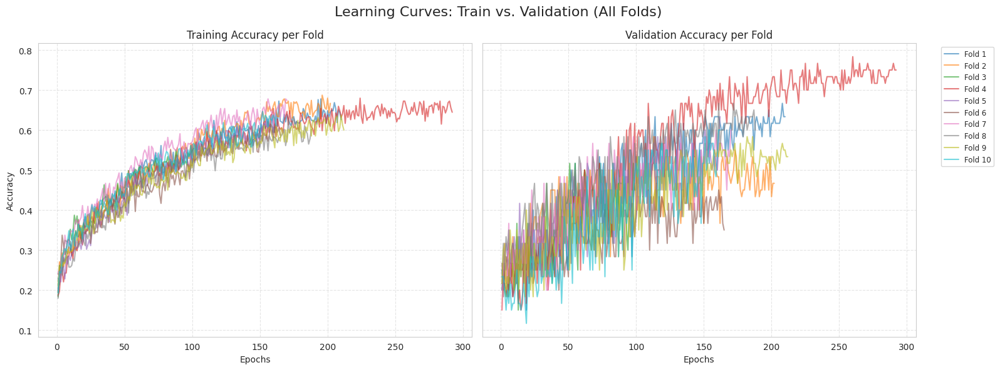

[Visuals] Saved training curves: fold_training_curves.png


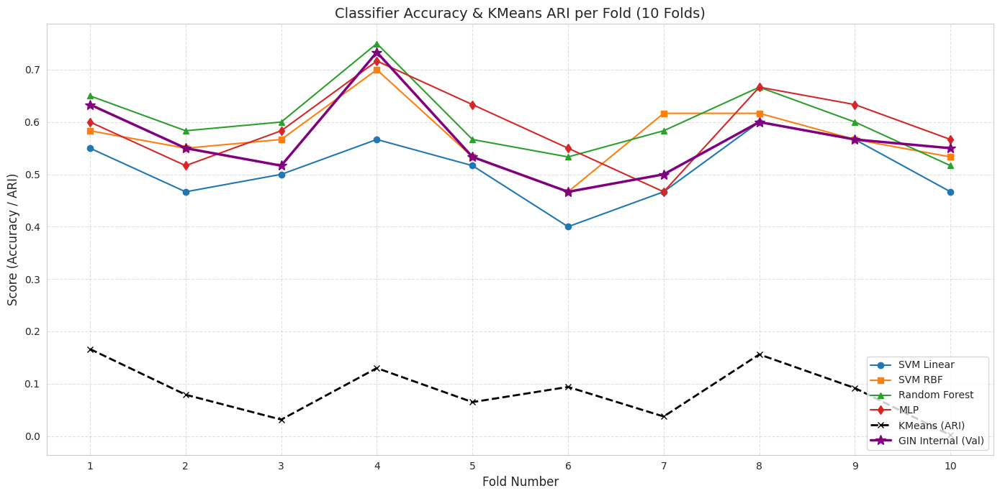

[Visuals] Saved fold performance plot: fold_performance.png
>> Generating Dual Stability Summary Plot to final_stability_bar_chart.png...


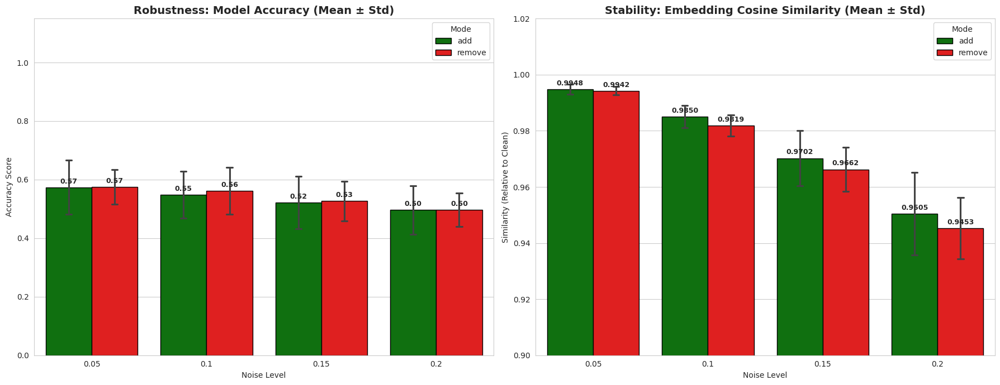

[Plots] Saved dual stability plot to final_stability_bar_chart.png

>> Merging detailed stability reports...
[Data] Saved master stability file: stability_detailed_ALL_FOLDS.csv
>> Generating Robustness Curve for Model_Accuracy...


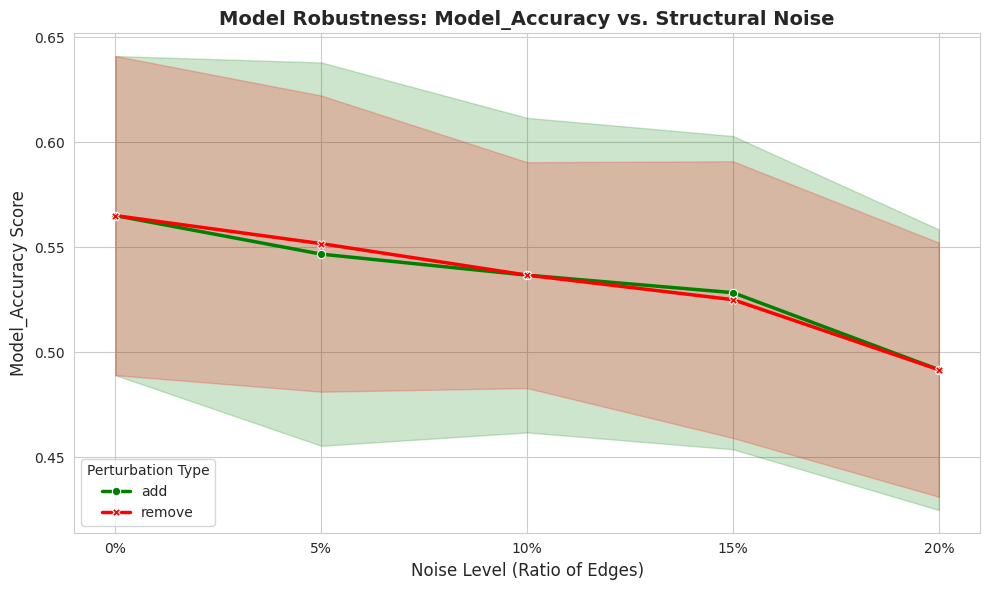

[Plots] Saved robustness curve to robustness_model_acc.png
>> Generating Robustness Curve for Cosine_Similarity...


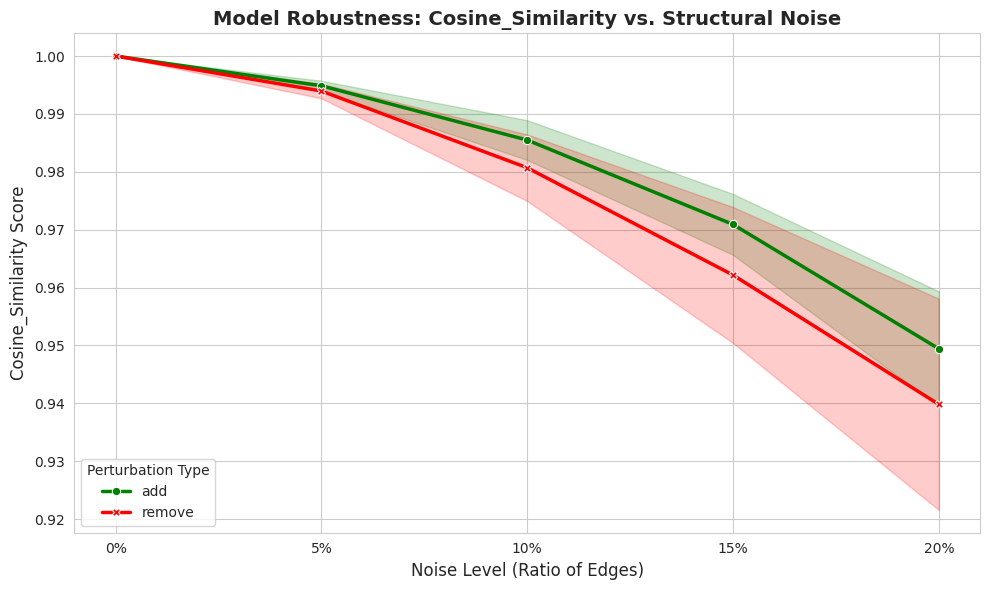

[Plots] Saved robustness curve to robustness_cosine_sim.png

Pipeline Finished in 13.14 minutes.


In [ ]:
# ==============================================================================
# CONFIGURATION
# ==============================================================================
DATASET_NAME = 'ENZYMES'
run_pipeline(run_dataset_analysis=True, run_main_experiment=True, enable_stability=True)

In [ ]:
!zip -r /content/enzymes_steplrWITHearlystopping.zip /content/*.npz /content/*.csv /content/*.png /content/*.json /content/*.pth

  adding: content/embeddings_fold_10.npz (deflated 12%)
  adding: content/embeddings_fold_1.npz (deflated 12%)
  adding: content/embeddings_fold_2.npz (deflated 12%)
  adding: content/embeddings_fold_3.npz (deflated 12%)
  adding: content/embeddings_fold_4.npz (deflated 12%)
  adding: content/embeddings_fold_5.npz (deflated 12%)
  adding: content/embeddings_fold_6.npz (deflated 12%)
  adding: content/embeddings_fold_7.npz (deflated 12%)
  adding: content/embeddings_fold_8.npz (deflated 12%)
  adding: content/embeddings_fold_9.npz (deflated 12%)
  adding: content/experiment_results.csv (deflated 64%)
  adding: content/stability_detailed_ALL_FOLDS.csv (deflated 71%)
  adding: content/stability_fold_10_detailed.csv (deflated 53%)
  adding: content/stability_fold_1_detailed.csv (deflated 52%)
  adding: content/stability_fold_2_detailed.csv (deflated 54%)
  adding: content/stability_fold_3_detailed.csv (deflated 53%)
  adding: content/stability_fold_4_detailed.csv (deflated 52%)
  adding: c

STARTING PIPELINE
Loading ENZYMES

Running Dataset Analysis & Plotting...

      DATASET SUMMARY
Total Graphs:    600
Num Classes:     6
Avg Nodes/Graph: 32.63 (Min: 2, Max: 126)
Avg Edges/Graph: 124.27 (Min: 2, Max: 298)
----------------------------------------


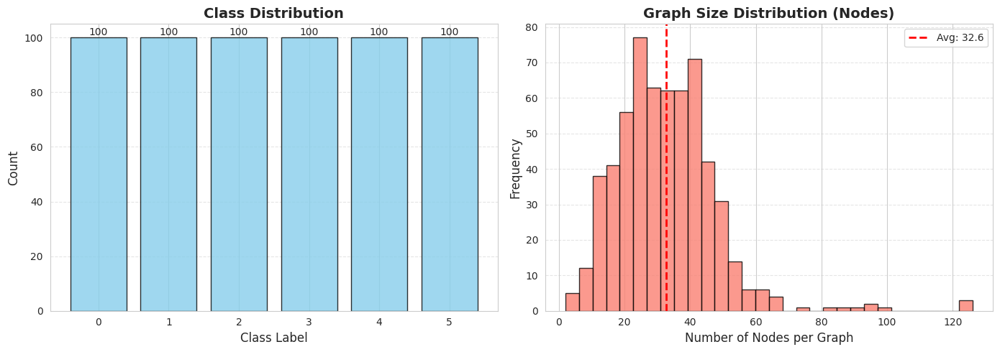

[Visuals] Saved extended dataset info to dataset_info.png
Dataset Features: 21 (Input Dimension)
Starting Main Experiment (10-Fold CV)...

STARTING FOLD 1/10
[Elapsed: 0:56:54] [RAM: 1571.7 MB] --- Fold 1: Initializing GIN ---
[Elapsed: 0:56:54] [RAM: 1571.7 MB] Starting Training Loop...
[Elapsed: 0:56:59] [RAM: 1571.7 MB] Epoch 010 | Train: 1.6768 | Val: 1.6160 (Acc: 0.3667) | Patience: 2/50
[Elapsed: 0:57:04] [RAM: 1571.7 MB] Epoch 020 | Train: 1.5826 | Val: 1.6991 (Acc: 0.3000) | Patience: 2/50
[Elapsed: 0:57:07] [RAM: 1571.7 MB] Epoch 030 | Train: 1.5353 | Val: 1.8421 (Acc: 0.2833) | Patience: 1/50
[Elapsed: 0:57:11] [RAM: 1571.7 MB] Epoch 040 | Train: 1.5063 | Val: 1.5689 (Acc: 0.3500) | Patience: 11/50
[Elapsed: 0:57:15] [RAM: 1571.7 MB] Epoch 050 | Train: 1.4188 | Val: 1.5220 (Acc: 0.3667) | Patience: 0/50
[Elapsed: 0:57:19] [RAM: 1571.7 MB] Epoch 060 | Train: 1.3969 | Val: 2.0808 (Acc: 0.2667) | Patience: 9/50
[Elapsed: 0:57:23] [RAM: 1571.7 MB] Epoch 070 | Train: 1.3476 | Val:

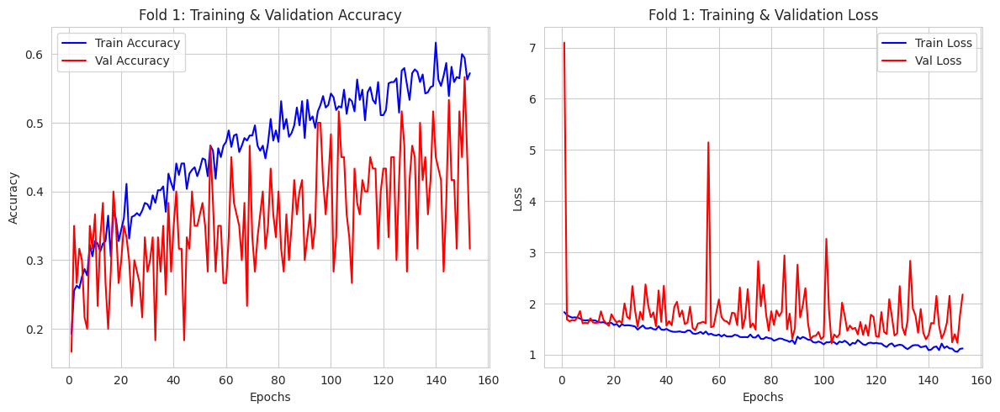

[Elapsed: 0:57:56] [RAM: 1571.7 MB] Loading 'embeddings_fold_1.npz' for Evaluation...

   [Fold 1 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 50.0%   | 49.9%   | 0.806    | 0.12s
   SVM_RBF    | 56.7%   | 56.4%   | 0.839    | 0.08s
   RF         | 56.7%   | 55.9%   | 0.881    | 0.71s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 63.3%   | 63.3%   | 0.866    | 2.82s
   >> KMeans ARI: 0.1842
   >> Spectral ARI: 0.1113

Computing t-SNE for cluster comparison...


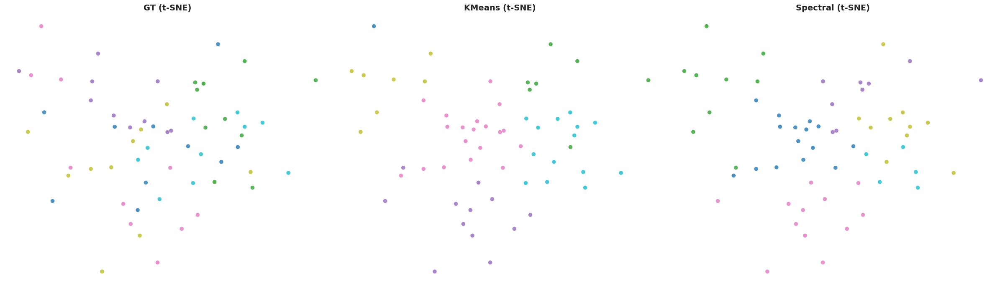

[Visuals] Saved 3-panel cluster comparison to pca_cluster_comparison_fold_1.png
>> Running Stability Analysis for Fold 1...

>> ] Running Analysis for Fold 1...
   > Clean Baseline Acc: 51.67%
[Elapsed: 0:58:01] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 0:58:01] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 0:58:01] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 0:58:01] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 0:58:01] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 0:58:01] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 0:58:01] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 0:58:01] [RAM: 1587.2 MB] Perturb Dataset...

   [Fold 1 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5167   | 1.0000
   add        | 5%      | 0.5000   | 0.9944
   add        | 10%      | 0.4833   | 0.9867
   add        | 15%      | 0.4667   | 0.9731
   add        | 20%      | 0.4500   | 0.9514
   remove     | 5%    

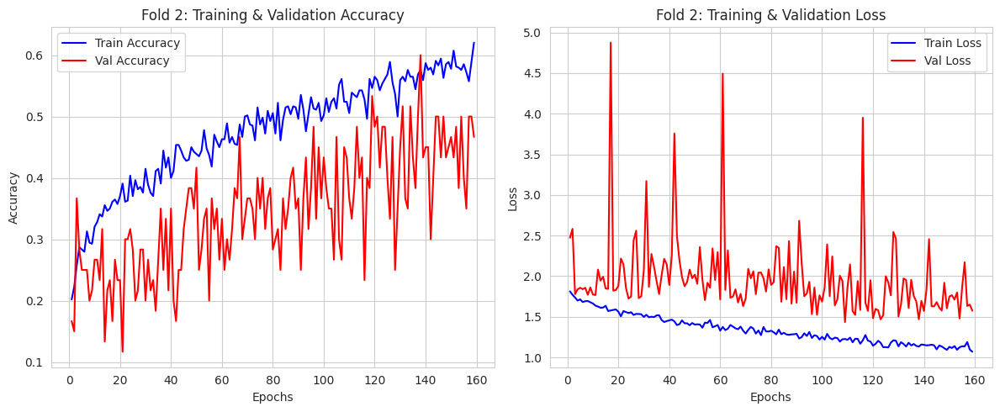

[Elapsed: 0:59:05] [RAM: 1587.2 MB] Loading 'embeddings_fold_2.npz' for Evaluation...

   [Fold 2 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 46.7%   | 45.9%   | 0.770    | 0.11s
   SVM_RBF    | 48.3%   | 47.5%   | 0.769    | 0.07s
   RF         | 55.0%   | 54.9%   | 0.798    | 0.71s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 48.3%   | 48.3%   | 0.768    | 2.83s
   >> KMeans ARI: 0.0251
   >> Spectral ARI: 0.1322

>> Running Stability Analysis for Fold 2...

>> ] Running Analysis for Fold 2...
   > Clean Baseline Acc: 43.33%
[Elapsed: 0:59:09] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 0:59:09] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 0:59:09] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 0:59:09] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 0:59:09] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 0:59:09] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 0:59:09] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 0:59:09] [RAM: 1587.2 MB] Perturb Dataset...

   [Fold 2 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.4333   | 1.0000
   add        | 5%      | 0.4167   | 0.9972
   add        | 10%      | 0.4333   | 0.9913
   add        | 15%      | 0.4333   | 0.9787
   add        | 20%      | 0.4000   | 0.9

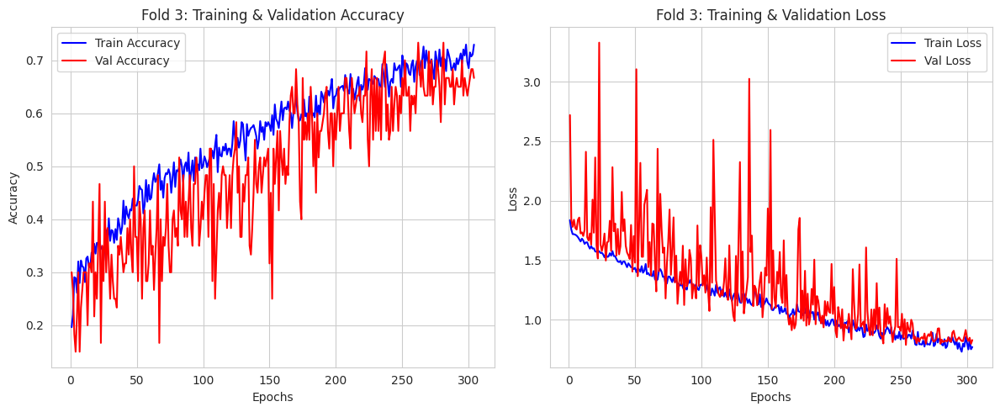

[Elapsed: 1:01:51] [RAM: 1587.2 MB] Loading 'embeddings_fold_3.npz' for Evaluation...

   [Fold 3 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 68.3%   | 68.3%   | 0.915    | 0.06s
   SVM_RBF    | 68.3%   | 68.6%   | 0.923    | 0.06s
   RF         | 65.0%   | 64.6%   | 0.930    | 0.70s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 66.7%   | 65.8%   | 0.924    | 2.64s
   >> KMeans ARI: 0.2254
   >> Spectral ARI: 0.1805

>> Running Stability Analysis for Fold 3...

>> ] Running Analysis for Fold 3...
   > Clean Baseline Acc: 63.33%
[Elapsed: 1:01:54] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 1:01:54] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 1:01:54] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 1:01:54] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 1:01:55] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 1:01:55] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 1:01:55] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 1:01:55] [RAM: 1587.2 MB] Perturb Dataset...

   [Fold 3 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.6333   | 1.0000
   add        | 5%      | 0.6667   | 0.9924
   add        | 10%      | 0.6833   | 0.9797
   add        | 15%      | 0.6167   | 0.9561
   add        | 20%      | 0.6500   | 0.9

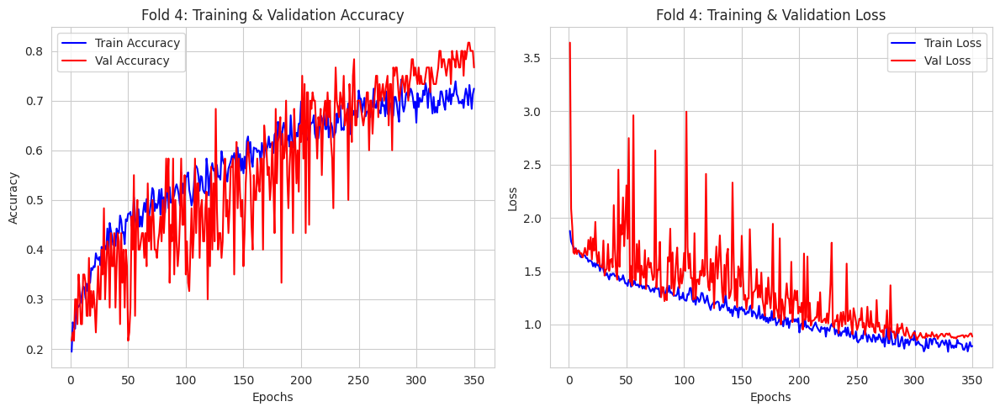

[Elapsed: 1:04:08] [RAM: 1587.2 MB] Loading 'embeddings_fold_4.npz' for Evaluation...

   [Fold 4 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 56.7%   | 56.3%   | 0.890    | 0.08s
   SVM_RBF    | 70.0%   | 69.1%   | 0.916    | 0.06s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   RF         | 68.3%   | 67.6%   | 0.906    | 0.70s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 68.3%   | 67.5%   | 0.912    | 3.64s
   >> KMeans ARI: 0.0937
   >> Spectral ARI: 0.2101

>> Running Stability Analysis for Fold 4...

>> ] Running Analysis for Fold 4...
   > Clean Baseline Acc: 76.67%
[Elapsed: 1:04:12] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 1:04:12] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 1:04:12] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 1:04:12] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 1:04:12] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 1:04:12] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 1:04:13] [RAM: 1587.2 MB] Perturb Dataset...
[Elapsed: 1:04:13] [RAM: 1587.2 MB] Perturb Dataset...

   [Fold 4 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.7667   | 1.0000
   add        | 5%      | 0.7667   | 0.9941
   add        | 10%      | 0.6667   | 0.9839
   add        | 15%      | 0.6667   | 0.9716
   add        | 20%      | 0.6667   | 0.9

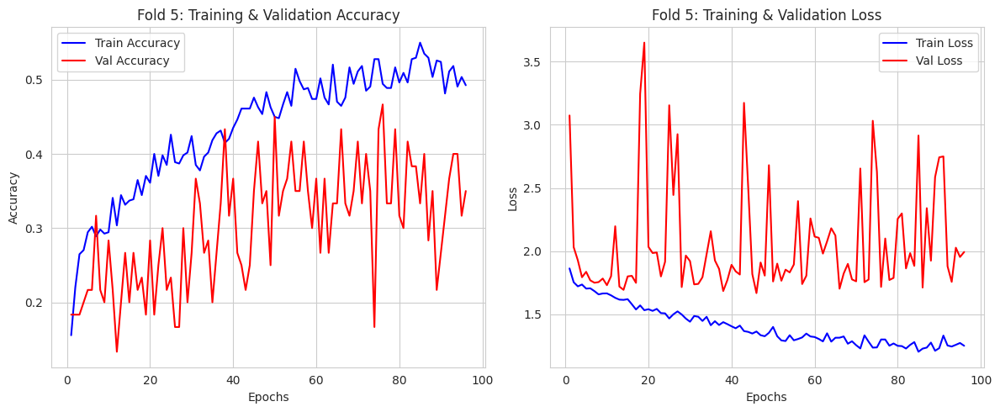

[Elapsed: 1:04:50] [RAM: 1587.5 MB] Loading 'embeddings_fold_5.npz' for Evaluation...

   [Fold 5 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 40.0%   | 38.3%   | 0.735    | 0.15s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_RBF    | 53.3%   | 51.9%   | 0.774    | 0.08s
   RF         | 58.3%   | 57.9%   | 0.834    | 0.68s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 53.3%   | 52.4%   | 0.794    | 2.65s
   >> KMeans ARI: 0.0217
   >> Spectral ARI: 0.0610

>> Running Stability Analysis for Fold 5...

>> ] Running Analysis for Fold 5...
   > Clean Baseline Acc: 41.67%
[Elapsed: 1:04:53] [RAM: 1587.6 MB] Perturb Dataset...
[Elapsed: 1:04:53] [RAM: 1587.6 MB] Perturb Dataset...
[Elapsed: 1:04:53] [RAM: 1587.6 MB] Perturb Dataset...
[Elapsed: 1:04:53] [RAM: 1587.6 MB] Perturb Dataset...
[Elapsed: 1:04:53] [RAM: 1587.6 MB] Perturb Dataset...
[Elapsed: 1:04:53] [RAM: 1587.6 MB] Perturb Dataset...
[Elapsed: 1:04:53] [RAM: 1587.6 MB] Perturb Dataset...
[Elapsed: 1:04:53] [RAM: 1587.6 MB] Perturb Dataset...

   [Fold 5 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.4167   | 1.0000
   add        | 5%      | 0.4167   | 0.9980
   add        | 10%      | 0.3833   | 0.9889
   add        | 15%      | 0.3333   | 0.9853
   add        | 20%      | 0.3167   | 0.9

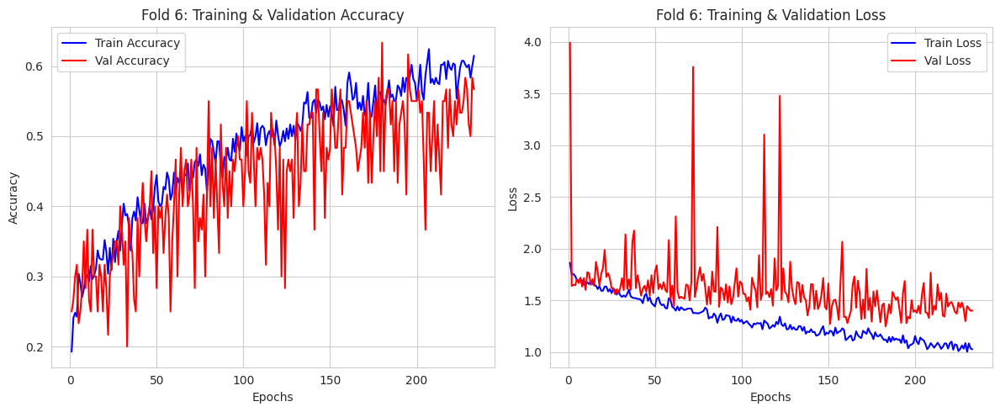

[Elapsed: 1:06:22] [RAM: 1587.6 MB] Loading 'embeddings_fold_6.npz' for Evaluation...

   [Fold 6 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 60.0%   | 60.4%   | 0.833    | 0.13s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_RBF    | 63.3%   | 63.4%   | 0.856    | 0.07s
   RF         | 68.3%   | 67.9%   | 0.887    | 1.01s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 70.0%   | 69.6%   | 0.854    | 3.26s
   >> KMeans ARI: 0.0734
   >> Spectral ARI: 0.1283

>> Running Stability Analysis for Fold 6...

>> ] Running Analysis for Fold 6...
   > Clean Baseline Acc: 56.67%
[Elapsed: 1:06:26] [RAM: 1587.6 MB] Perturb Dataset...
[Elapsed: 1:06:26] [RAM: 1587.6 MB] Perturb Dataset...
[Elapsed: 1:06:27] [RAM: 1587.6 MB] Perturb Dataset...
[Elapsed: 1:06:27] [RAM: 1587.6 MB] Perturb Dataset...
[Elapsed: 1:06:27] [RAM: 1587.6 MB] Perturb Dataset...
[Elapsed: 1:06:27] [RAM: 1587.6 MB] Perturb Dataset...
[Elapsed: 1:06:27] [RAM: 1587.6 MB] Perturb Dataset...
[Elapsed: 1:06:27] [RAM: 1587.6 MB] Perturb Dataset...

   [Fold 6 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5667   | 1.0000
   add        | 5%      | 0.5500   | 0.9947
   add        | 10%      | 0.5667   | 0.9866
   add        | 15%      | 0.5667   | 0.9713
   add        | 20%      | 0.4500   | 0.9

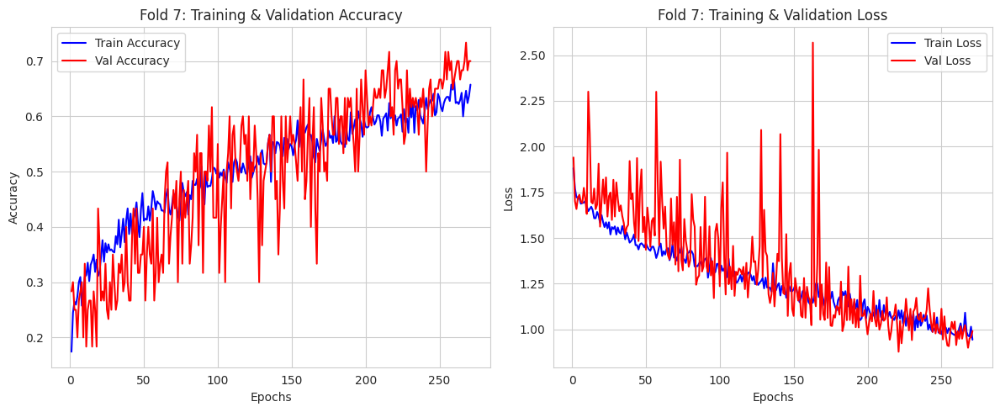

[Elapsed: 1:08:11] [RAM: 1587.8 MB] Loading 'embeddings_fold_7.npz' for Evaluation...

   [Fold 7 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 63.3%   | 63.0%   | 0.895    | 0.13s
   SVM_RBF    | 70.0%   | 70.5%   | 0.905    | 0.13s
   RF         | 70.0%   | 70.2%   | 0.926    | 1.22s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 70.0%   | 70.4%   | 0.916    | 3.26s
   >> KMeans ARI: 0.0559
   >> Spectral ARI: 0.1297

>> Running Stability Analysis for Fold 7...

>> ] Running Analysis for Fold 7...
   > Clean Baseline Acc: 70.00%
[Elapsed: 1:08:16] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:08:16] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:08:16] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:08:16] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:08:16] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:08:16] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:08:16] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:08:16] [RAM: 1587.8 MB] Perturb Dataset...

   [Fold 7 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.7000   | 1.0000
   add        | 5%      | 0.6500   | 0.9942
   add        | 10%      | 0.6167   | 0.9802
   add        | 15%      | 0.5500   | 0.9608
   add        | 20%      | 0.4667   | 0.9

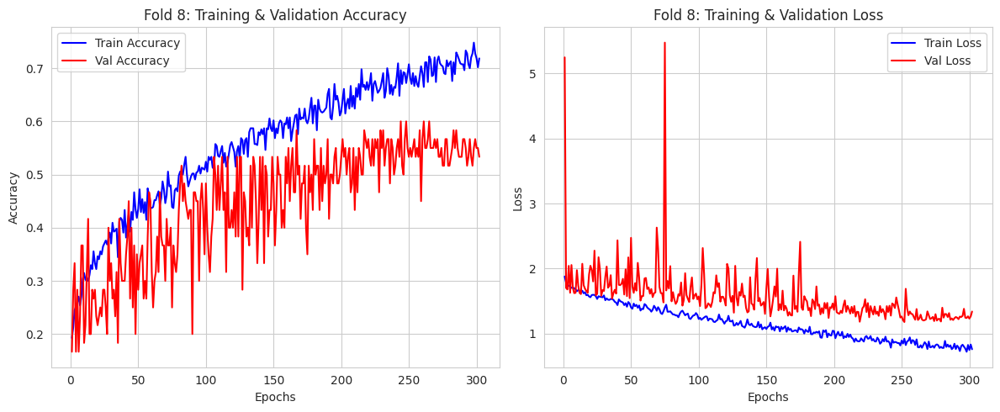

[Elapsed: 1:10:15] [RAM: 1587.8 MB] Loading 'embeddings_fold_8.npz' for Evaluation...

   [Fold 8 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 56.7%   | 55.6%   | 0.849    | 0.09s
   SVM_RBF    | 63.3%   | 62.6%   | 0.857    | 0.07s
   RF         | 60.0%   | 59.3%   | 0.881    | 0.70s
   MLP        | 68.3%   | 67.8%   | 0.883    | 2.75s
   >> KMeans ARI: 0.0272
   >> Spectral ARI: 0.1229

>> Running Stability Analysis for Fold 8...

>> ] Running Analysis for Fold 8...
   > Clean Baseline Acc: 53.33%
[Elapsed: 1:10:19] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:10:19] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:10:19] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:10:19] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:10:19] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:10:19] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:10:19] [RAM: 1587.8 MB] Perturb Dataset...
[Elap

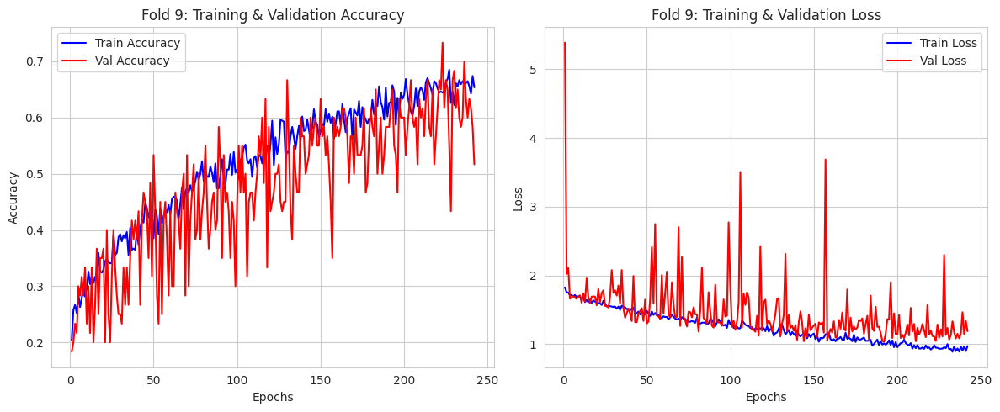

[Elapsed: 1:11:53] [RAM: 1587.8 MB] Loading 'embeddings_fold_9.npz' for Evaluation...

   [Fold 9 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 60.0%   | 59.0%   | 0.847    | 0.10s
   SVM_RBF    | 60.0%   | 59.4%   | 0.890    | 0.07s
   RF         | 60.0%   | 59.1%   | 0.898    | 0.72s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 65.0%   | 63.8%   | 0.883    | 2.79s
   >> KMeans ARI: 0.1405
   >> Spectral ARI: 0.1424

>> Running Stability Analysis for Fold 9...

>> ] Running Analysis for Fold 9...
   > Clean Baseline Acc: 61.67%
[Elapsed: 1:11:57] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:11:57] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:11:57] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:11:57] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:11:57] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:11:57] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:11:57] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:11:57] [RAM: 1587.8 MB] Perturb Dataset...

   [Fold 9 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.6167   | 1.0000
   add        | 5%      | 0.6333   | 0.9952
   add        | 10%      | 0.6500   | 0.9854
   add        | 15%      | 0.6167   | 0.9755
   add        | 20%      | 0.6333   | 0.9

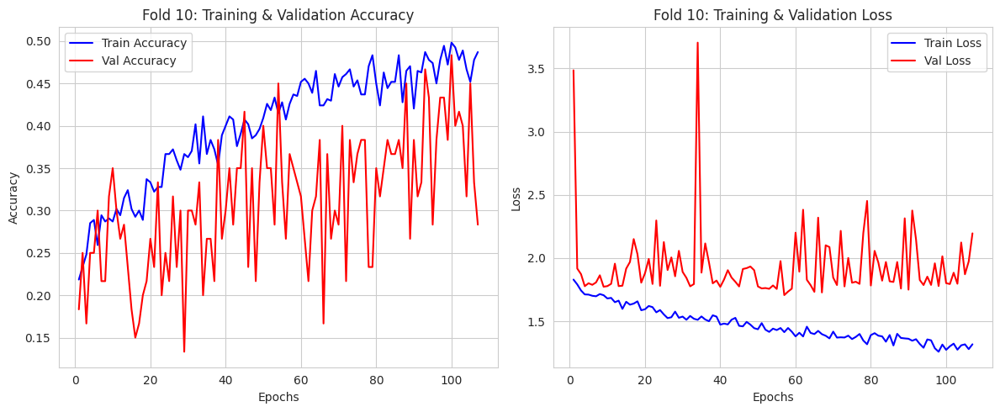

[Elapsed: 1:12:39] [RAM: 1587.8 MB] Loading 'embeddings_fold_10.npz' for Evaluation...

   [Fold 10 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_Lin    | 41.7%   | 40.2%   | 0.717    | 0.28s
   SVM_RBF    | 50.0%   | 49.0%   | 0.764    | 0.13s
   RF         | 61.7%   | 60.9%   | 0.834    | 0.73s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 60.0%   | 59.6%   | 0.795    | 2.70s
   >> KMeans ARI: 0.0724
   >> Spectral ARI: 0.0920

>> Running Stability Analysis for Fold 10...

>> ] Running Analysis for Fold 10...
   > Clean Baseline Acc: 36.67%
[Elapsed: 1:12:43] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:12:43] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:12:43] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:12:43] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:12:43] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:12:44] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:12:44] [RAM: 1587.8 MB] Perturb Dataset...
[Elapsed: 1:12:44] [RAM: 1587.8 MB] Perturb Dataset...

   [Fold 10 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.3667   | 1.0000
   add        | 5%      | 0.3500   | 0.9950
   add        | 10%      | 0.3000   | 0.9816
   add        | 15%      | 0.3000   | 0.9656
   add        | 20%      | 0.3000   | 

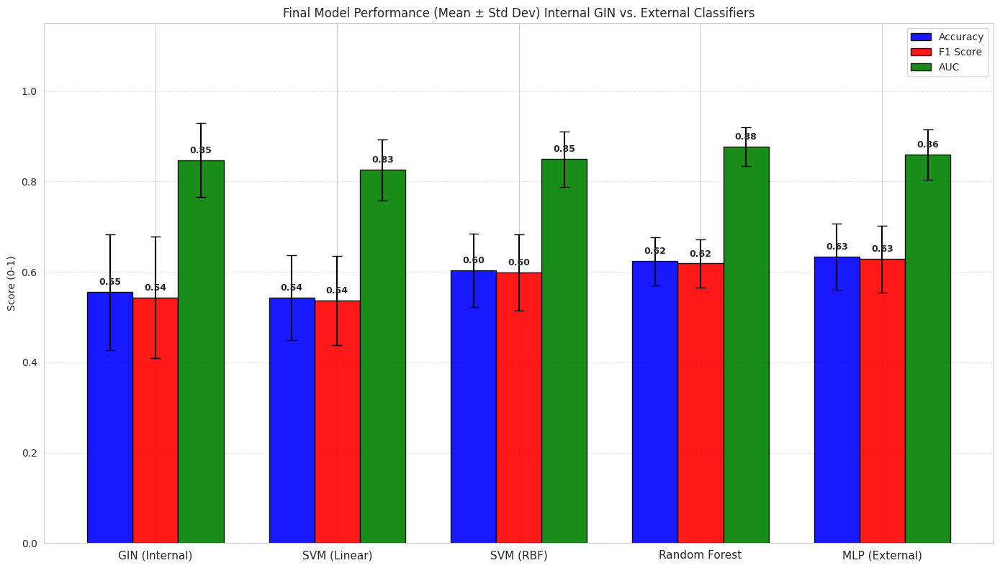

[Visuals] Saved final summary to final_performance.png


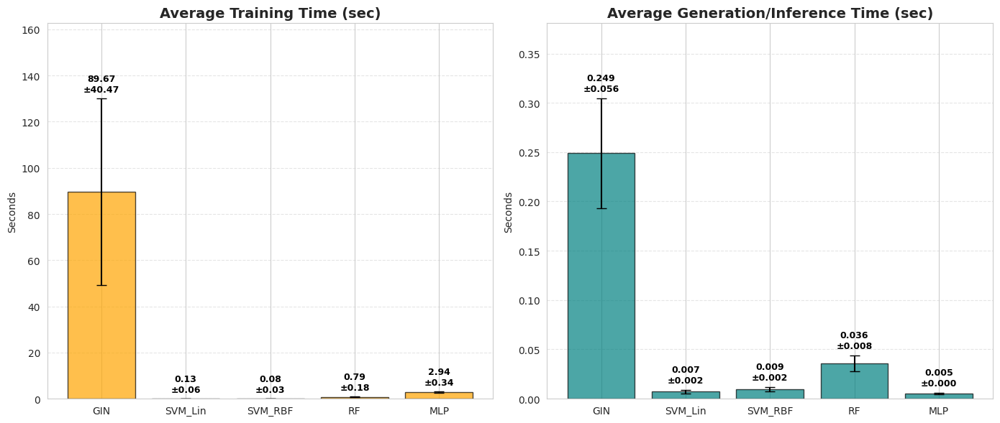

[Visuals] Saved resource usage report to resource_usage.png

      RESOURCE CONSUMPTION REPORT (Mean ± Std)
Method     | Train Time (s)       | Gen Time (s)         | Peak RAM (MB)  
---------------------------------------------------------------------------
GIN        | 89.67 ± 40.47        | 0.25 ± 0.06          | 0.43 ± 0.02    
SVM_Lin    | 0.13 ± 0.06          | 0.01 ± 0.00          | -
SVM_RBF    | 0.08 ± 0.03          | 0.01 ± 0.00          | -
RF         | 0.79 ± 0.18          | 0.04 ± 0.01          | -
MLP        | 2.94 ± 0.34          | 0.01 ± 0.00          | -


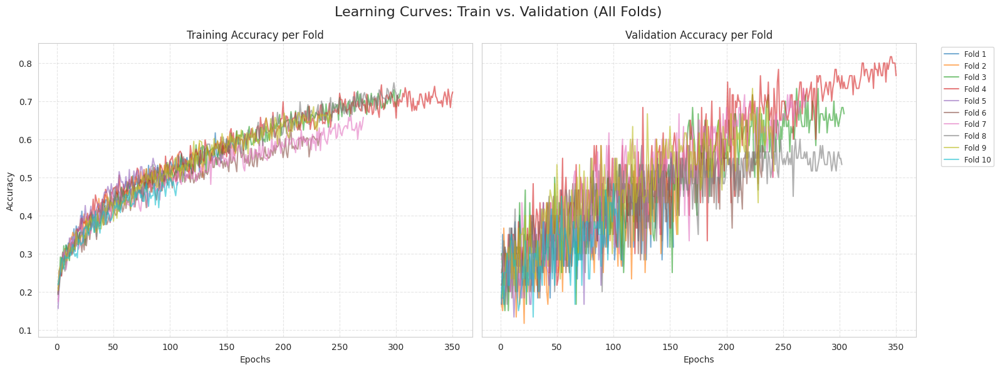

[Visuals] Saved training curves: fold_training_curves.png


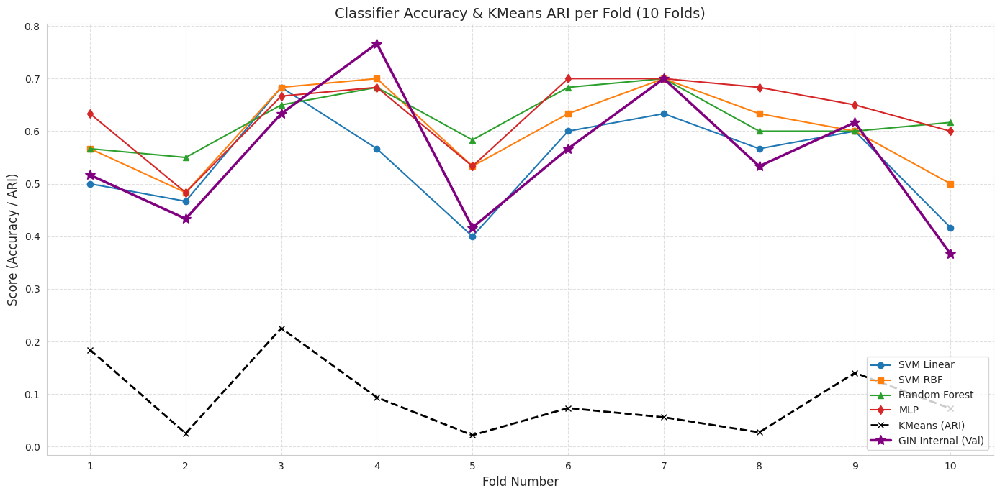

[Visuals] Saved fold performance plot: fold_performance.png
>> Generating Dual Stability Summary Plot to final_stability_bar_chart.png...


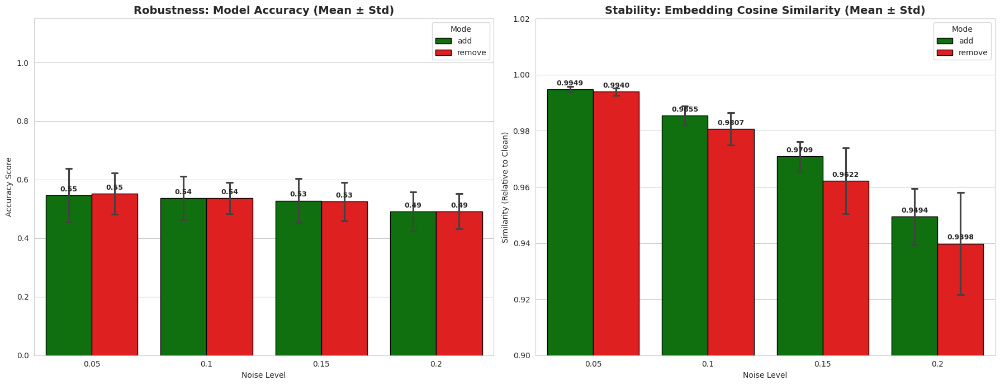

[Plots] Saved dual stability plot to final_stability_bar_chart.png

>> Merging detailed stability reports...
[Data] Saved master stability file: stability_detailed_ALL_FOLDS.csv
>> Generating Robustness Curve for Model_Accuracy...


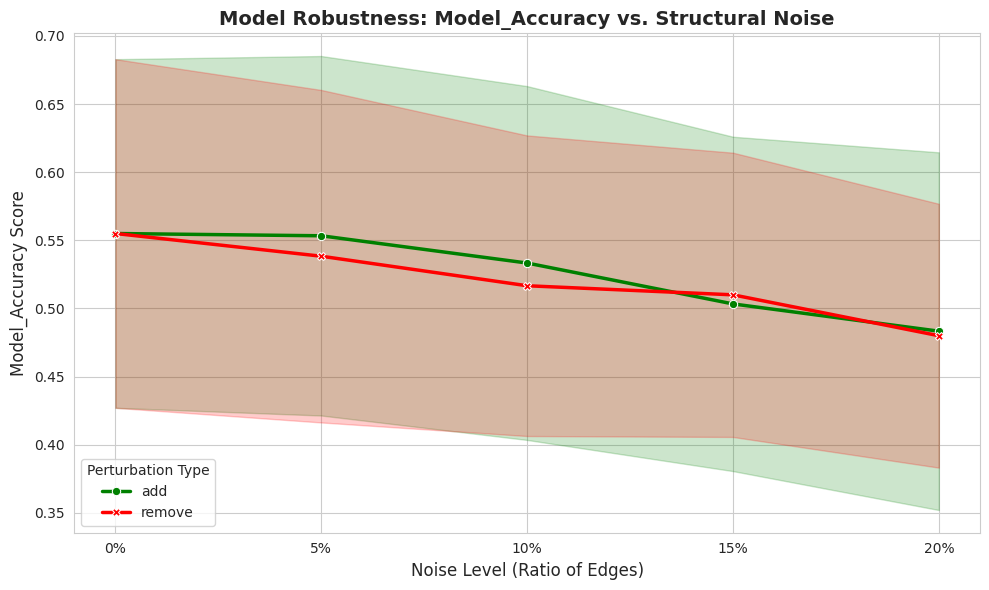

[Plots] Saved robustness curve to robustness_model_acc.png
>> Generating Robustness Curve for Cosine_Similarity...


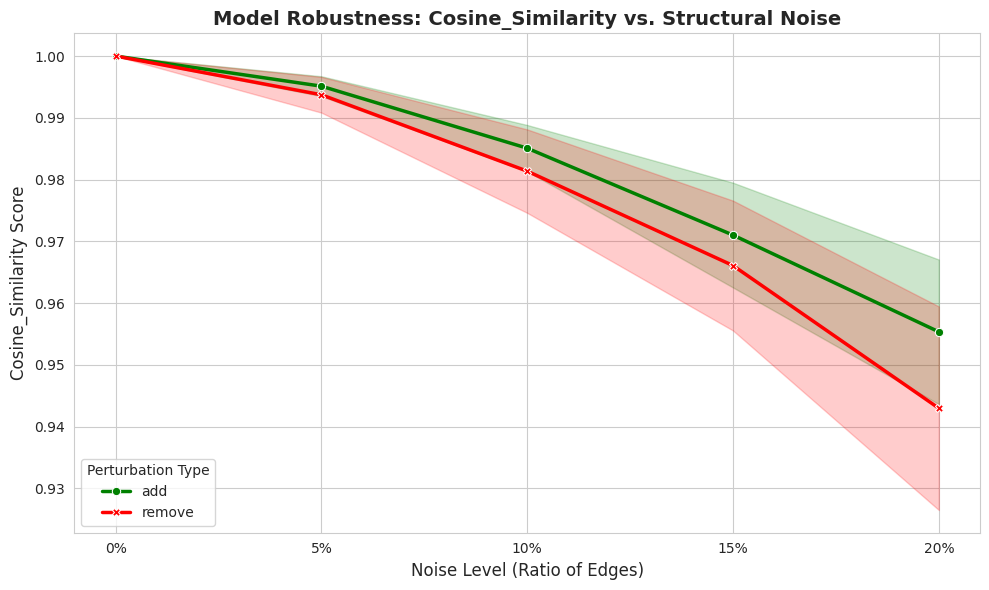

[Plots] Saved robustness curve to robustness_cosine_sim.png

Pipeline Finished in 15.94 minutes.


In [ ]:
# ==============================================================================
# CONFIGURATION
# ==============================================================================
DATASET_NAME = 'ENZYMES'
run_pipeline(run_dataset_analysis=True, run_main_experiment=True, enable_stability=True)

In [ ]:
!zip -r /content/enzymes_cosWITHearlystopping.zip /content/*.npz /content/*.csv /content/*.png /content/*.json /content/*.pth

  adding: content/embeddings_fold_10.npz (deflated 12%)
  adding: content/embeddings_fold_1.npz (deflated 12%)
  adding: content/embeddings_fold_2.npz (deflated 12%)
  adding: content/embeddings_fold_3.npz (deflated 12%)
  adding: content/embeddings_fold_4.npz (deflated 12%)
  adding: content/embeddings_fold_5.npz (deflated 12%)
  adding: content/embeddings_fold_6.npz (deflated 12%)
  adding: content/embeddings_fold_7.npz (deflated 12%)
  adding: content/embeddings_fold_8.npz (deflated 12%)
  adding: content/embeddings_fold_9.npz (deflated 12%)
  adding: content/experiment_results.csv (deflated 63%)
  adding: content/stability_detailed_ALL_FOLDS.csv (deflated 69%)
  adding: content/stability_fold_10_detailed.csv (deflated 52%)
  adding: content/stability_fold_1_detailed.csv (deflated 51%)
  adding: content/stability_fold_2_detailed.csv (deflated 55%)
  adding: content/stability_fold_3_detailed.csv (deflated 52%)
  adding: content/stability_fold_4_detailed.csv (deflated 55%)
  adding: c

STARTING PIPELINE
Loading ENZYMES

Running Dataset Analysis & Plotting...

      DATASET SUMMARY
Total Graphs:    600
Num Classes:     6
Avg Nodes/Graph: 32.63 (Min: 2, Max: 126)
Avg Edges/Graph: 124.27 (Min: 2, Max: 298)
----------------------------------------


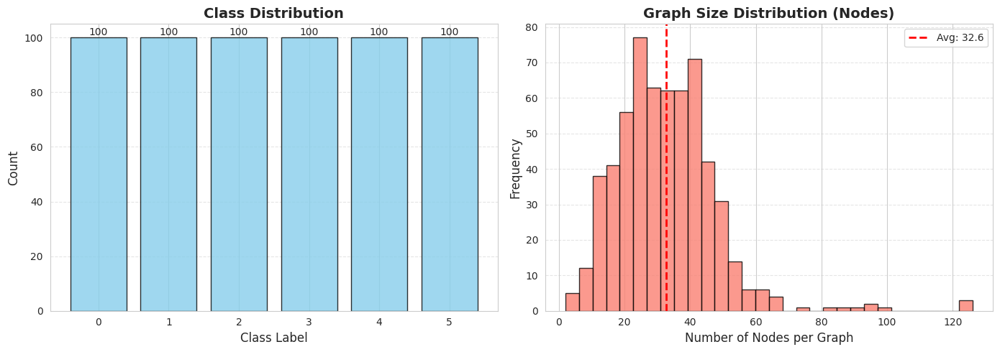

[Visuals] Saved extended dataset info to dataset_info.png
Dataset Features: 21 (Input Dimension)
Starting Main Experiment (10-Fold CV)...

STARTING FOLD 1/10
[Elapsed: 1:12:51] [RAM: 1587.8 MB] --- Fold 1: Initializing GIN ---
[Elapsed: 1:12:51] [RAM: 1587.8 MB] Starting Training Loop...
[Elapsed: 1:12:55] [RAM: 1587.8 MB] Epoch 010 | Train: 1.7092 | Val: 1.6817 (Acc: 0.3167)
[Elapsed: 1:12:58] [RAM: 1587.8 MB] Epoch 020 | Train: 1.6246 | Val: 1.5689 (Acc: 0.3167)
[Elapsed: 1:13:02] [RAM: 1587.8 MB] Epoch 030 | Train: 1.5618 | Val: 1.6479 (Acc: 0.3167)
[Elapsed: 1:13:06] [RAM: 1587.8 MB] Epoch 040 | Train: 1.4983 | Val: 1.5324 (Acc: 0.3667)
[Elapsed: 1:13:10] [RAM: 1587.8 MB] Epoch 050 | Train: 1.4017 | Val: 1.4836 (Acc: 0.3833)
[Elapsed: 1:13:13] [RAM: 1587.8 MB] Epoch 060 | Train: 1.3710 | Val: 1.5752 (Acc: 0.3333)
[Elapsed: 1:13:17] [RAM: 1587.8 MB] Epoch 070 | Train: 1.3511 | Val: 1.4737 (Acc: 0.3833)
[Elapsed: 1:13:21] [RAM: 1587.8 MB] Epoch 080 | Train: 1.2994 | Val: 1.7472 (Acc:

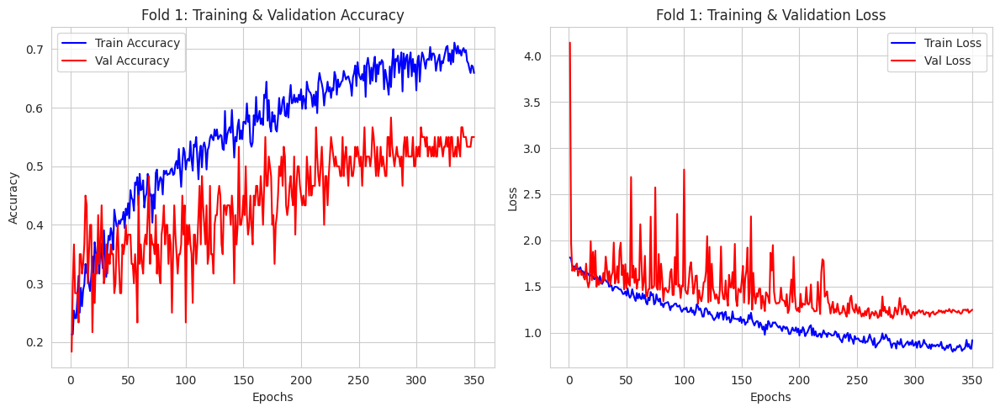

[Elapsed: 1:15:03] [RAM: 1587.8 MB] Loading 'embeddings_fold_1.npz' for Evaluation...

   [Fold 1 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 48.3%   | 49.9%   | 0.826    | 0.15s
   SVM_RBF    | 53.3%   | 54.5%   | 0.868    | 0.12s
   RF         | 58.3%   | 60.0%   | 0.896    | 1.13s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 58.3%   | 59.1%   | 0.848    | 2.60s
   >> KMeans ARI: 0.0496
   >> Spectral ARI: 0.1220

Computing t-SNE for cluster comparison...


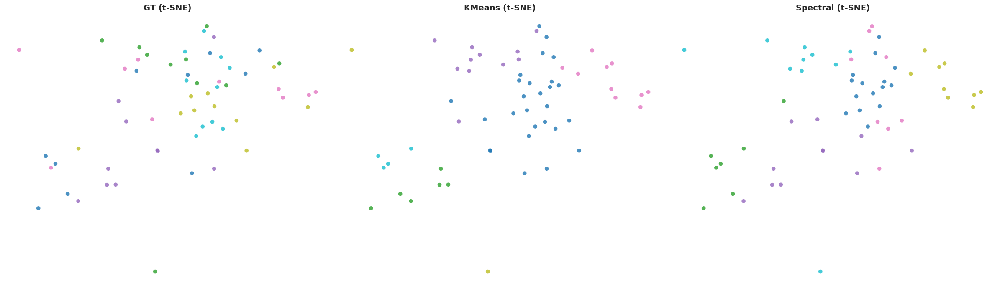

[Visuals] Saved 3-panel cluster comparison to pca_cluster_comparison_fold_1.png
>> Running Stability Analysis for Fold 1...

>> ] Running Analysis for Fold 1...
   > Clean Baseline Acc: 51.67%
[Elapsed: 1:15:08] [RAM: 1598.4 MB] Perturb Dataset...
[Elapsed: 1:15:08] [RAM: 1598.4 MB] Perturb Dataset...
[Elapsed: 1:15:08] [RAM: 1598.4 MB] Perturb Dataset...
[Elapsed: 1:15:08] [RAM: 1598.4 MB] Perturb Dataset...
[Elapsed: 1:15:08] [RAM: 1598.4 MB] Perturb Dataset...
[Elapsed: 1:15:08] [RAM: 1598.4 MB] Perturb Dataset...
[Elapsed: 1:15:08] [RAM: 1598.4 MB] Perturb Dataset...
[Elapsed: 1:15:08] [RAM: 1598.4 MB] Perturb Dataset...

   [Fold 1 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5167   | 1.0000
   add        | 5%      | 0.5500   | 0.9961
   add        | 10%      | 0.5333   | 0.9876
   add        | 15%      | 0.5500   | 0.9754
   add        | 20%      | 0.5167   | 0.9554
   remove     | 5%    

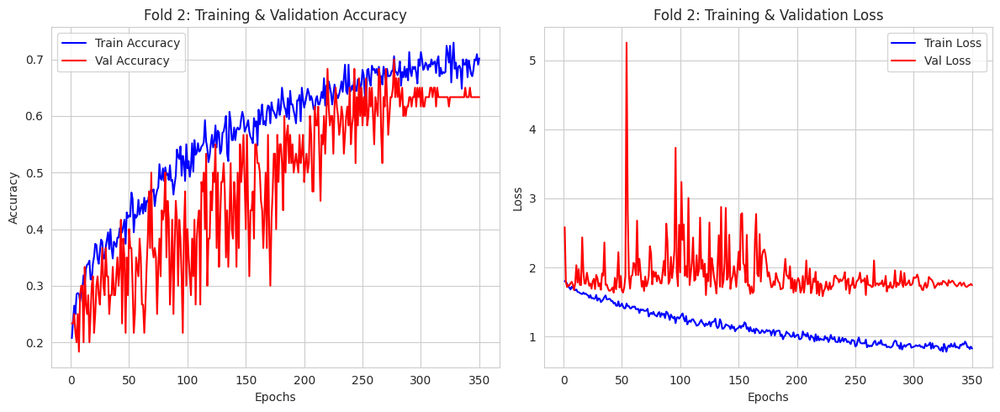

[Elapsed: 1:17:23] [RAM: 1598.4 MB] Loading 'embeddings_fold_2.npz' for Evaluation...

   [Fold 2 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 63.3%   | 63.3%   | 0.843    | 0.08s
   SVM_RBF    | 65.0%   | 65.4%   | 0.868    | 0.06s
   RF         | 65.0%   | 65.2%   | 0.886    | 0.73s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 66.7%   | 67.3%   | 0.850    | 2.76s
   >> KMeans ARI: 0.0524
   >> Spectral ARI: 0.1183

>> Running Stability Analysis for Fold 2...

>> ] Running Analysis for Fold 2...
   > Clean Baseline Acc: 58.33%
[Elapsed: 1:17:27] [RAM: 1598.4 MB] Perturb Dataset...
[Elapsed: 1:17:27] [RAM: 1598.4 MB] Perturb Dataset...
[Elapsed: 1:17:27] [RAM: 1598.4 MB] Perturb Dataset...
[Elapsed: 1:17:27] [RAM: 1598.4 MB] Perturb Dataset...
[Elapsed: 1:17:27] [RAM: 1598.4 MB] Perturb Dataset...
[Elapsed: 1:17:27] [RAM: 1598.4 MB] Perturb Dataset...
[Elapsed: 1:17:27] [RAM: 1598.4 MB] Perturb Dataset...
[Elapsed: 1:17:27] [RAM: 1598.4 MB] Perturb Dataset...

   [Fold 2 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5833   | 1.0000
   add        | 5%      | 0.5000   | 0.9942
   add        | 10%      | 0.4500   | 0.9786
   add        | 15%      | 0.5333   | 0.9585
   add        | 20%      | 0.4333   | 0.9

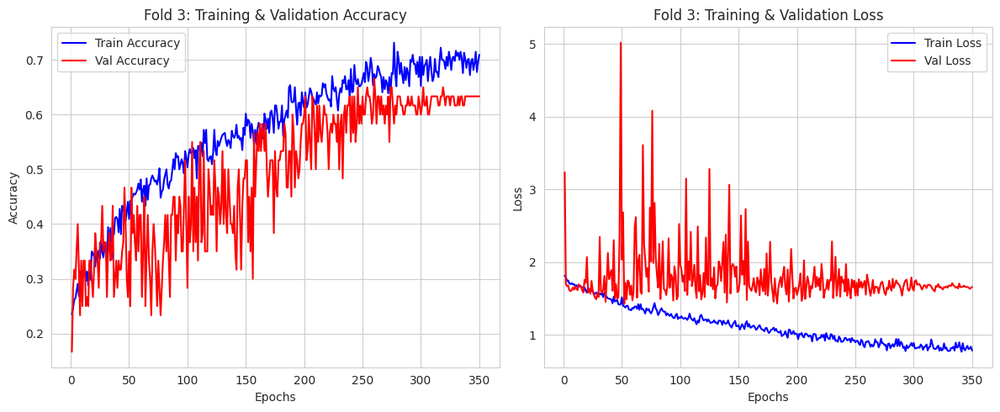

[Elapsed: 1:19:46] [RAM: 1599.0 MB] Loading 'embeddings_fold_3.npz' for Evaluation...

   [Fold 3 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 51.7%   | 51.9%   | 0.764    | 0.15s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_RBF    | 55.0%   | 54.6%   | 0.819    | 0.08s
   RF         | 65.0%   | 65.1%   | 0.855    | 0.74s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 65.0%   | 64.8%   | 0.821    | 2.79s
   >> KMeans ARI: 0.0891
   >> Spectral ARI: 0.1150

>> Running Stability Analysis for Fold 3...

>> ] Running Analysis for Fold 3...
   > Clean Baseline Acc: 46.67%
[Elapsed: 1:19:50] [RAM: 1599.0 MB] Perturb Dataset...
[Elapsed: 1:19:50] [RAM: 1599.0 MB] Perturb Dataset...
[Elapsed: 1:19:50] [RAM: 1599.0 MB] Perturb Dataset...
[Elapsed: 1:19:50] [RAM: 1599.0 MB] Perturb Dataset...
[Elapsed: 1:19:50] [RAM: 1599.0 MB] Perturb Dataset...
[Elapsed: 1:19:50] [RAM: 1599.0 MB] Perturb Dataset...
[Elapsed: 1:19:50] [RAM: 1599.0 MB] Perturb Dataset...
[Elapsed: 1:19:50] [RAM: 1599.0 MB] Perturb Dataset...

   [Fold 3 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.4667   | 1.0000
   add        | 5%      | 0.4500   | 0.9960
   add        | 10%      | 0.4500   | 0.9878
   add        | 15%      | 0.4333   | 0.9756
   add        | 20%      | 0.3667   | 0.9

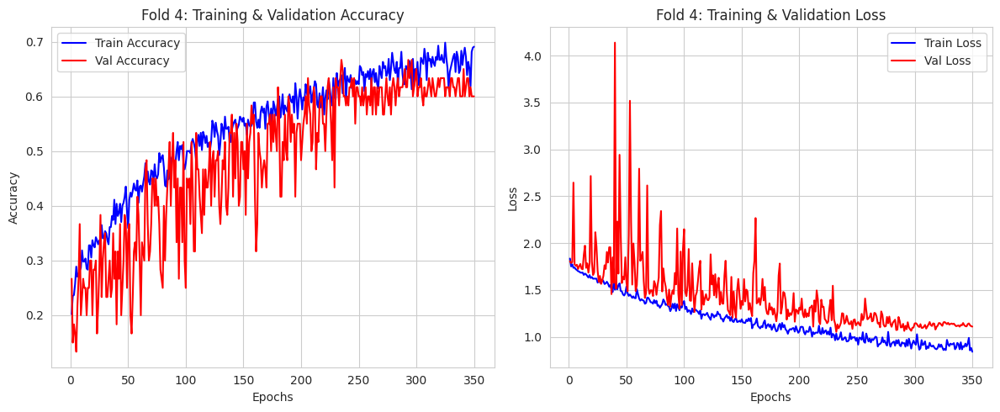

[Elapsed: 1:22:06] [RAM: 1599.9 MB] Loading 'embeddings_fold_4.npz' for Evaluation...

   [Fold 4 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 55.0%   | 55.3%   | 0.856    | 0.16s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_RBF    | 60.0%   | 59.0%   | 0.912    | 0.12s
   RF         | 61.7%   | 58.0%   | 0.922    | 1.19s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 70.0%   | 69.0%   | 0.880    | 2.97s
   >> KMeans ARI: 0.1342
   >> Spectral ARI: 0.1792

>> Running Stability Analysis for Fold 4...

>> ] Running Analysis for Fold 4...
   > Clean Baseline Acc: 61.67%
[Elapsed: 1:22:10] [RAM: 1599.9 MB] Perturb Dataset...
[Elapsed: 1:22:10] [RAM: 1599.9 MB] Perturb Dataset...
[Elapsed: 1:22:11] [RAM: 1599.9 MB] Perturb Dataset...
[Elapsed: 1:22:11] [RAM: 1599.9 MB] Perturb Dataset...
[Elapsed: 1:22:11] [RAM: 1599.9 MB] Perturb Dataset...
[Elapsed: 1:22:11] [RAM: 1599.9 MB] Perturb Dataset...
[Elapsed: 1:22:11] [RAM: 1599.9 MB] Perturb Dataset...
[Elapsed: 1:22:11] [RAM: 1599.9 MB] Perturb Dataset...

   [Fold 4 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.6167   | 1.0000
   add        | 5%      | 0.6667   | 0.9927
   add        | 10%      | 0.6000   | 0.9789
   add        | 15%      | 0.5500   | 0.9586
   add        | 20%      | 0.5333   | 0.9

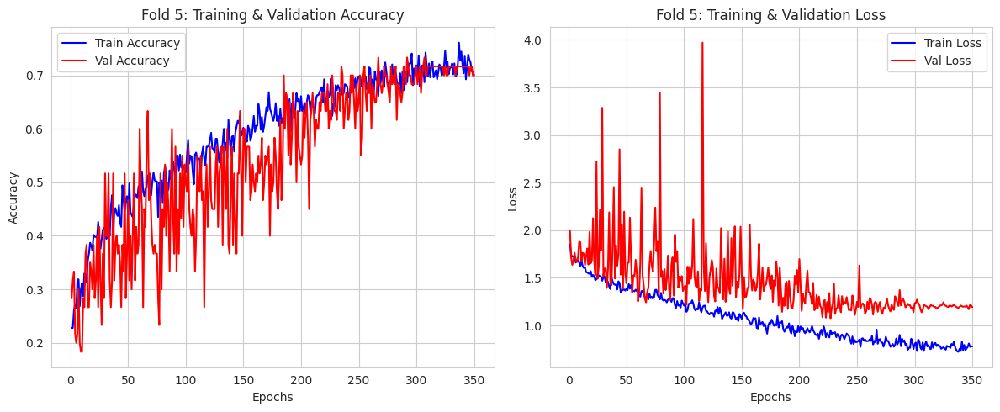

[Elapsed: 1:24:25] [RAM: 1600.8 MB] Loading 'embeddings_fold_5.npz' for Evaluation...

   [Fold 5 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 56.7%   | 55.3%   | 0.857    | 0.07s
   SVM_RBF    | 65.0%   | 64.9%   | 0.909    | 0.06s
   RF         | 70.0%   | 70.1%   | 0.894    | 0.70s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 66.7%   | 65.7%   | 0.872    | 2.69s
   >> KMeans ARI: 0.1031
   >> Spectral ARI: 0.1546

>> Running Stability Analysis for Fold 5...

>> ] Running Analysis for Fold 5...
   > Clean Baseline Acc: 70.00%
[Elapsed: 1:24:29] [RAM: 1600.8 MB] Perturb Dataset...
[Elapsed: 1:24:29] [RAM: 1600.8 MB] Perturb Dataset...
[Elapsed: 1:24:29] [RAM: 1600.8 MB] Perturb Dataset...
[Elapsed: 1:24:29] [RAM: 1600.8 MB] Perturb Dataset...
[Elapsed: 1:24:29] [RAM: 1600.8 MB] Perturb Dataset...
[Elapsed: 1:24:29] [RAM: 1600.8 MB] Perturb Dataset...
[Elapsed: 1:24:29] [RAM: 1600.8 MB] Perturb Dataset...
[Elapsed: 1:24:29] [RAM: 1600.8 MB] Perturb Dataset...

   [Fold 5 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.7000   | 1.0000
   add        | 5%      | 0.6333   | 0.9954
   add        | 10%      | 0.6667   | 0.9873
   add        | 15%      | 0.6167   | 0.9698
   add        | 20%      | 0.6333   | 0.9

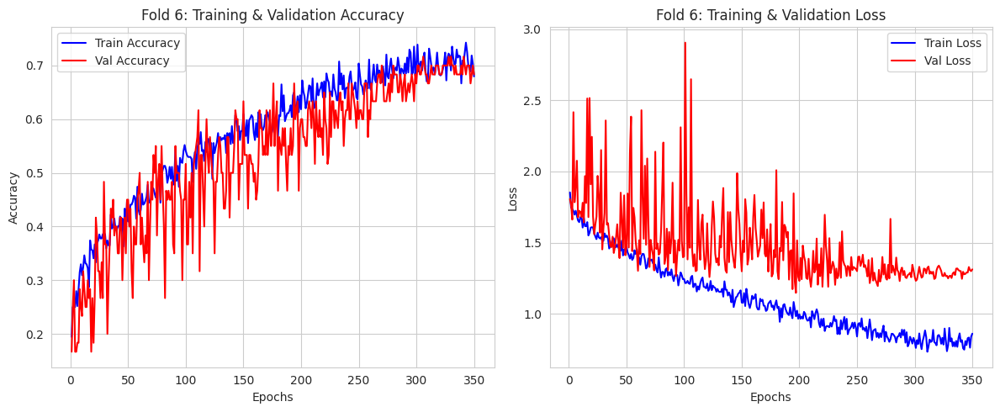

[Elapsed: 1:26:53] [RAM: 1600.9 MB] Loading 'embeddings_fold_6.npz' for Evaluation...

   [Fold 6 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 63.3%   | 63.1%   | 0.838    | 0.09s
   SVM_RBF    | 66.7%   | 66.7%   | 0.876    | 0.08s
   RF         | 68.3%   | 68.6%   | 0.906    | 0.71s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 65.0%   | 65.8%   | 0.854    | 2.78s
   >> KMeans ARI: 0.1969
   >> Spectral ARI: 0.2357

>> Running Stability Analysis for Fold 6...

>> ] Running Analysis for Fold 6...
   > Clean Baseline Acc: 63.33%
[Elapsed: 1:26:57] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:26:57] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:26:57] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:26:57] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:26:57] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:26:57] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:26:57] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:26:57] [RAM: 1600.9 MB] Perturb Dataset...

   [Fold 6 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.6333   | 1.0000
   add        | 5%      | 0.6500   | 0.9936
   add        | 10%      | 0.6000   | 0.9829
   add        | 15%      | 0.6167   | 0.9697
   add        | 20%      | 0.6000   | 0.9

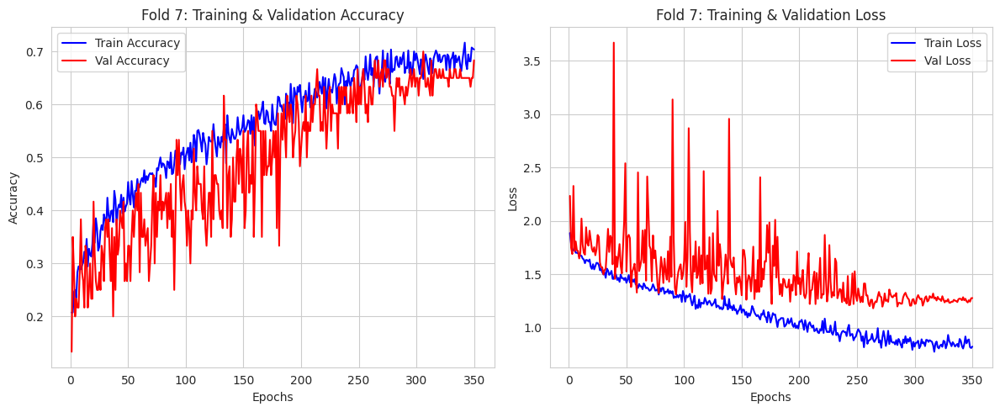

[Elapsed: 1:29:15] [RAM: 1600.9 MB] Loading 'embeddings_fold_7.npz' for Evaluation...

   [Fold 7 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 55.0%   | 55.5%   | 0.847    | 0.09s
   SVM_RBF    | 68.3%   | 68.6%   | 0.888    | 0.06s
   RF         | 65.0%   | 65.1%   | 0.886    | 0.72s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 63.3%   | 62.6%   | 0.888    | 2.81s
   >> KMeans ARI: 0.0720
   >> Spectral ARI: 0.1440

>> Running Stability Analysis for Fold 7...

>> ] Running Analysis for Fold 7...
   > Clean Baseline Acc: 68.33%
[Elapsed: 1:29:18] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:29:18] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:29:18] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:29:18] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:29:18] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:29:18] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:29:19] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:29:19] [RAM: 1600.9 MB] Perturb Dataset...

   [Fold 7 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.6833   | 1.0000
   add        | 5%      | 0.6833   | 0.9936
   add        | 10%      | 0.6667   | 0.9787
   add        | 15%      | 0.6167   | 0.9601
   add        | 20%      | 0.6333   | 0.9

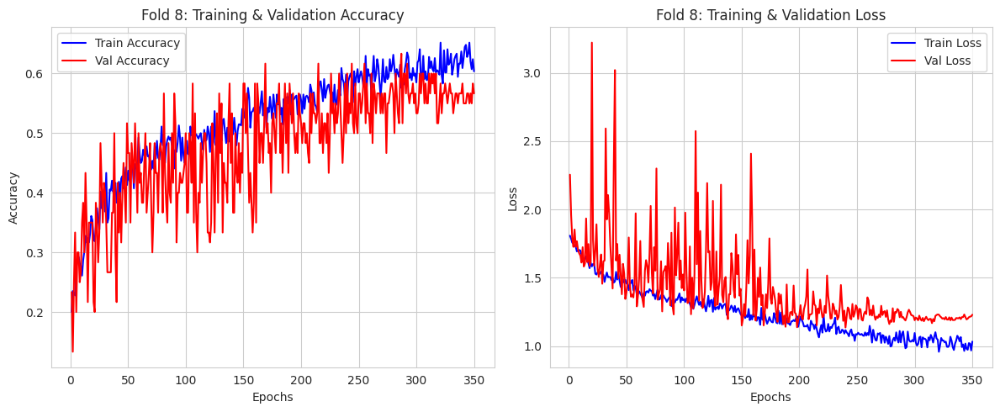

[Elapsed: 1:31:39] [RAM: 1600.9 MB] Loading 'embeddings_fold_8.npz' for Evaluation...

   [Fold 8 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 51.7%   | 49.6%   | 0.825    | 0.13s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_RBF    | 56.7%   | 56.1%   | 0.847    | 0.09s
   RF         | 53.3%   | 52.9%   | 0.856    | 0.79s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 63.3%   | 63.5%   | 0.862    | 3.06s
   >> KMeans ARI: 0.1306
   >> Spectral ARI: 0.1832

>> Running Stability Analysis for Fold 8...

>> ] Running Analysis for Fold 8...
   > Clean Baseline Acc: 60.00%
[Elapsed: 1:31:43] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:31:43] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:31:43] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:31:43] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:31:43] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:31:43] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:31:43] [RAM: 1600.9 MB] Perturb Dataset...
[Elapsed: 1:31:43] [RAM: 1600.9 MB] Perturb Dataset...

   [Fold 8 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.6000   | 1.0000
   add        | 5%      | 0.6167   | 0.9952
   add        | 10%      | 0.5333   | 0.9863
   add        | 15%      | 0.5500   | 0.9575
   add        | 20%      | 0.5000   | 0.9

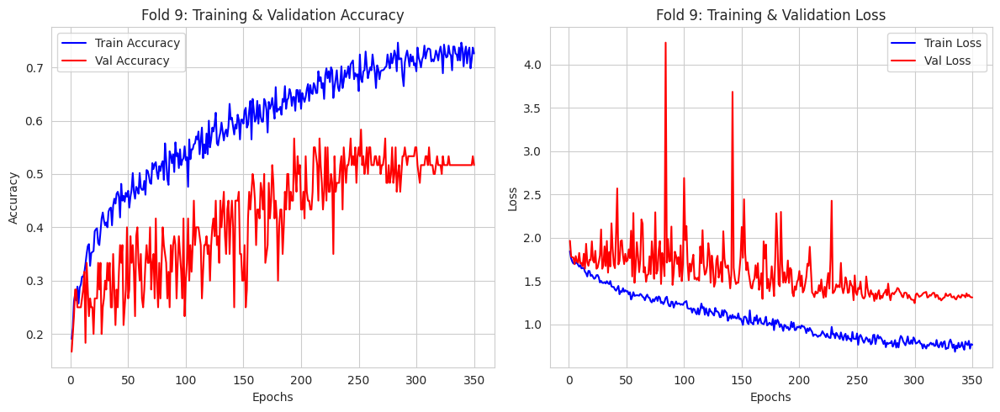

[Elapsed: 1:34:09] [RAM: 1601.0 MB] Loading 'embeddings_fold_9.npz' for Evaluation...

   [Fold 9 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 46.7%   | 47.8%   | 0.821    | 0.07s
   SVM_RBF    | 63.3%   | 63.8%   | 0.858    | 0.06s
   RF         | 60.0%   | 59.8%   | 0.868    | 0.74s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 61.7%   | 62.1%   | 0.860    | 3.11s
   >> KMeans ARI: 0.0829
   >> Spectral ARI: 0.0777

>> Running Stability Analysis for Fold 9...

>> ] Running Analysis for Fold 9...
   > Clean Baseline Acc: 55.00%
[Elapsed: 1:34:14] [RAM: 1601.0 MB] Perturb Dataset...
[Elapsed: 1:34:14] [RAM: 1601.0 MB] Perturb Dataset...
[Elapsed: 1:34:14] [RAM: 1601.0 MB] Perturb Dataset...
[Elapsed: 1:34:14] [RAM: 1601.0 MB] Perturb Dataset...
[Elapsed: 1:34:14] [RAM: 1601.0 MB] Perturb Dataset...
[Elapsed: 1:34:14] [RAM: 1601.0 MB] Perturb Dataset...
[Elapsed: 1:34:14] [RAM: 1601.0 MB] Perturb Dataset...
[Elapsed: 1:34:14] [RAM: 1601.0 MB] Perturb Dataset...

   [Fold 9 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5500   | 1.0000
   add        | 5%      | 0.5667   | 0.9946
   add        | 10%      | 0.5667   | 0.9820
   add        | 15%      | 0.5333   | 0.9672
   add        | 20%      | 0.5000   | 0.9

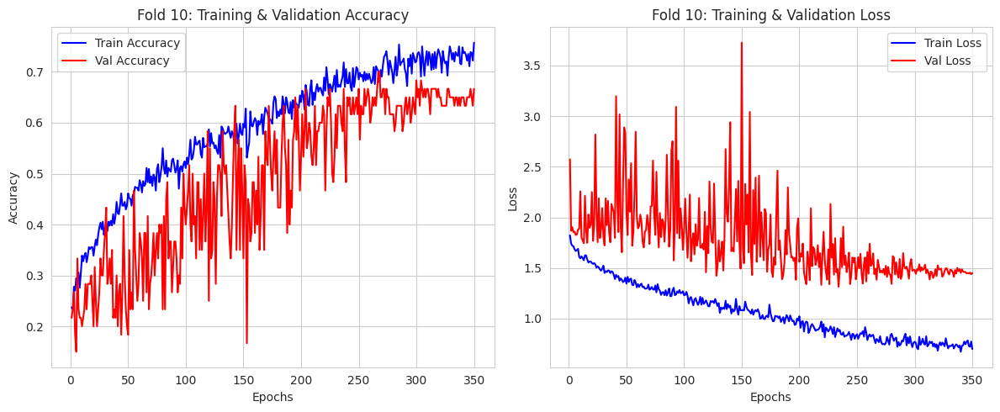

[Elapsed: 1:36:35] [RAM: 1601.0 MB] Loading 'embeddings_fold_10.npz' for Evaluation...

   [Fold 10 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 61.7%   | 61.0%   | 0.843    | 0.08s
   SVM_RBF    | 63.3%   | 62.9%   | 0.868    | 0.06s
   RF         | 61.7%   | 60.5%   | 0.867    | 0.73s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 61.7%   | 61.1%   | 0.859    | 2.96s
   >> KMeans ARI: 0.1429
   >> Spectral ARI: 0.1607

>> Running Stability Analysis for Fold 10...

>> ] Running Analysis for Fold 10...
   > Clean Baseline Acc: 63.33%
[Elapsed: 1:36:39] [RAM: 1601.0 MB] Perturb Dataset...
[Elapsed: 1:36:39] [RAM: 1601.0 MB] Perturb Dataset...
[Elapsed: 1:36:39] [RAM: 1601.0 MB] Perturb Dataset...
[Elapsed: 1:36:39] [RAM: 1601.0 MB] Perturb Dataset...
[Elapsed: 1:36:39] [RAM: 1601.0 MB] Perturb Dataset...
[Elapsed: 1:36:39] [RAM: 1601.0 MB] Perturb Dataset...
[Elapsed: 1:36:40] [RAM: 1601.0 MB] Perturb Dataset...
[Elapsed: 1:36:40] [RAM: 1601.0 MB] Perturb Dataset...

   [Fold 10 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.6333   | 1.0000
   add        | 5%      | 0.6167   | 0.9930
   add        | 10%      | 0.6167   | 0.9850
   add        | 15%      | 0.6167   | 0.9747
   add        | 20%      | 0.5000   | 

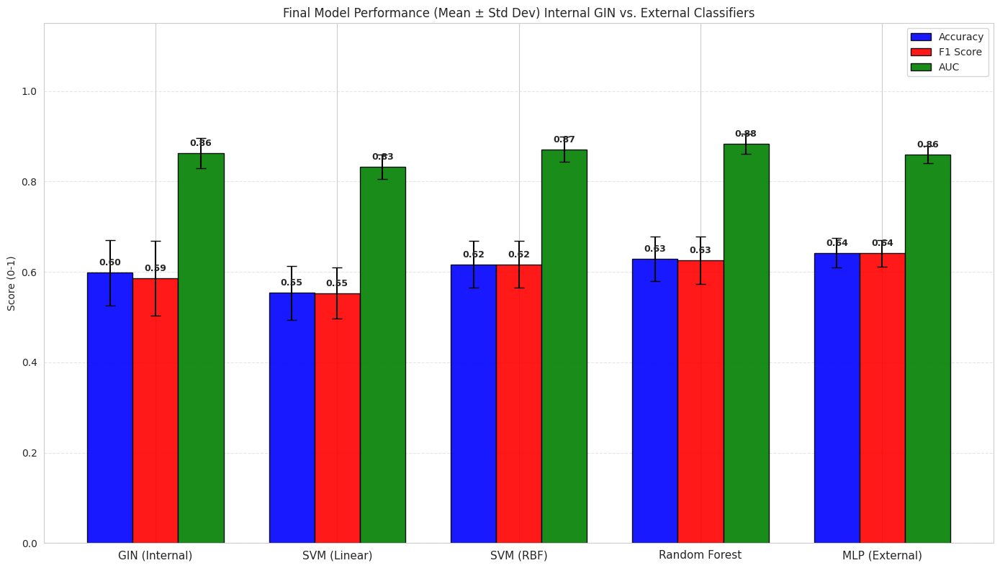

[Visuals] Saved final summary to final_performance.png


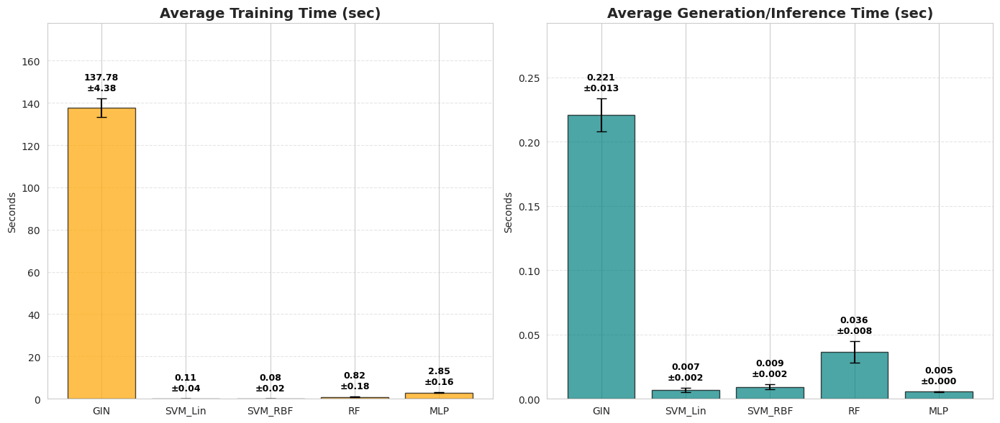

[Visuals] Saved resource usage report to resource_usage.png

      RESOURCE CONSUMPTION REPORT (Mean ± Std)
Method     | Train Time (s)       | Gen Time (s)         | Peak RAM (MB)  
---------------------------------------------------------------------------
GIN        | 137.78 ± 4.38        | 0.22 ± 0.01          | 0.45 ± 0.01    
SVM_Lin    | 0.11 ± 0.04          | 0.01 ± 0.00          | -
SVM_RBF    | 0.08 ± 0.02          | 0.01 ± 0.00          | -
RF         | 0.82 ± 0.18          | 0.04 ± 0.01          | -
MLP        | 2.85 ± 0.16          | 0.01 ± 0.00          | -


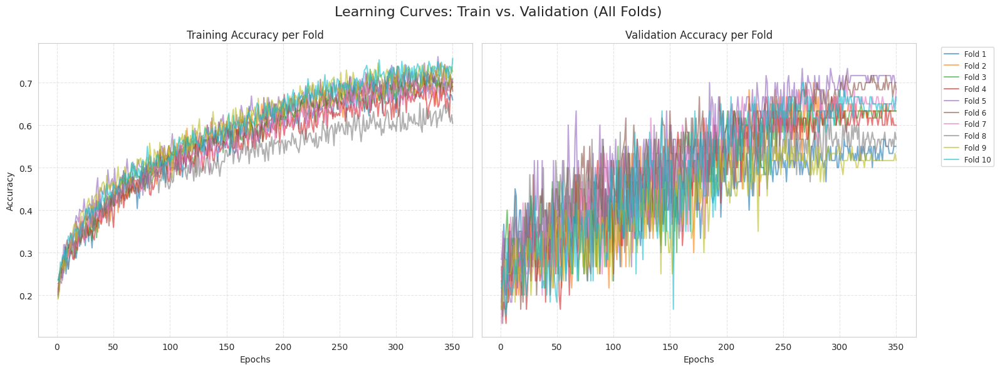

[Visuals] Saved training curves: fold_training_curves.png


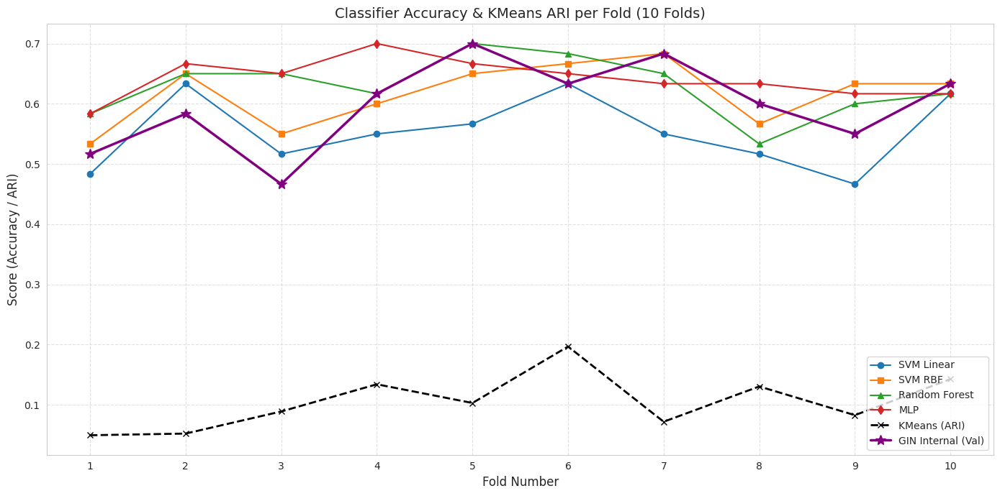

[Visuals] Saved fold performance plot: fold_performance.png
>> Generating Dual Stability Summary Plot to final_stability_bar_chart.png...


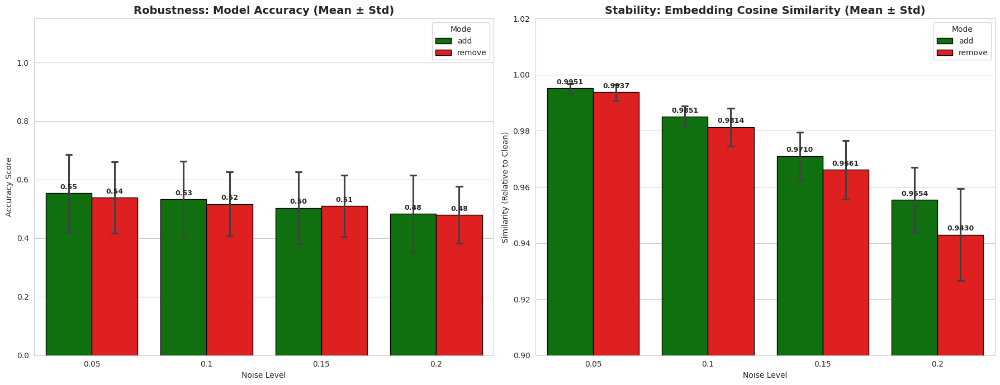

[Plots] Saved dual stability plot to final_stability_bar_chart.png

>> Merging detailed stability reports...
[Data] Saved master stability file: stability_detailed_ALL_FOLDS.csv
>> Generating Robustness Curve for Model_Accuracy...


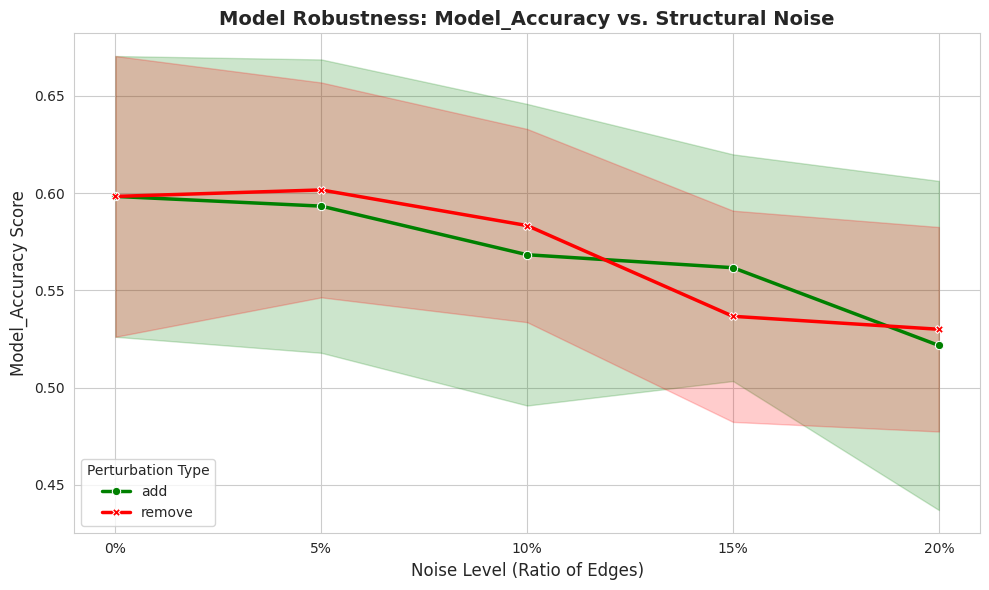

[Plots] Saved robustness curve to robustness_model_acc.png
>> Generating Robustness Curve for Cosine_Similarity...


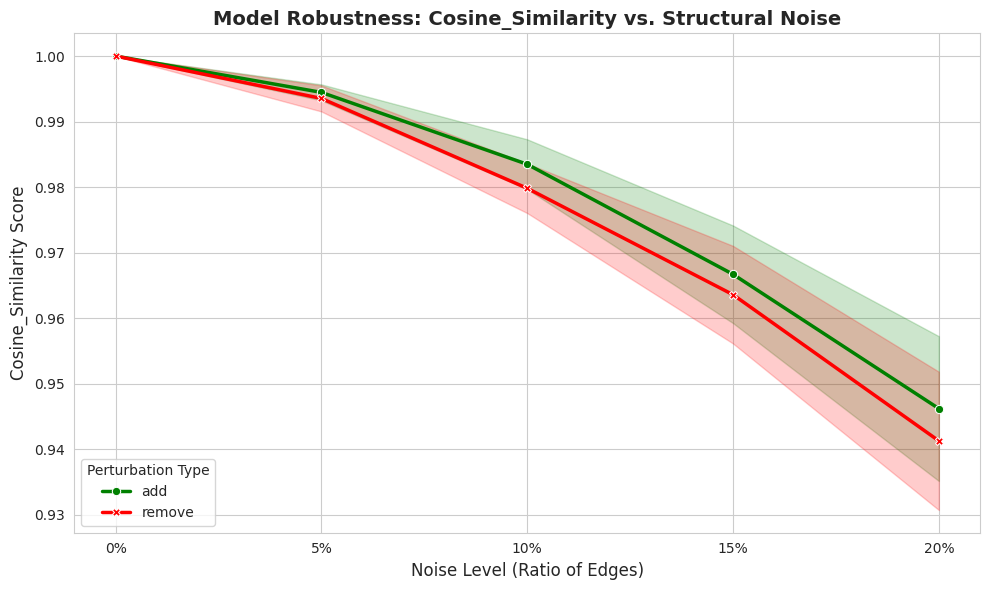

[Plots] Saved robustness curve to robustness_cosine_sim.png

Pipeline Finished in 23.95 minutes.


In [ ]:
# ==============================================================================
# CONFIGURATION
# ==============================================================================
DATASET_NAME = 'ENZYMES'
run_pipeline(run_dataset_analysis=True, run_main_experiment=True, enable_stability=True)

In [ ]:
!zip -r /content/enzymes_cosNOearlystopping.zip /content/*.npz /content/*.csv /content/*.png /content/*.json /content/*.pth

  adding: content/embeddings_fold_10.npz (deflated 12%)
  adding: content/embeddings_fold_1.npz (deflated 12%)
  adding: content/embeddings_fold_2.npz (deflated 12%)
  adding: content/embeddings_fold_3.npz (deflated 12%)
  adding: content/embeddings_fold_4.npz (deflated 12%)
  adding: content/embeddings_fold_5.npz (deflated 12%)
  adding: content/embeddings_fold_6.npz (deflated 12%)
  adding: content/embeddings_fold_7.npz (deflated 12%)
  adding: content/embeddings_fold_8.npz (deflated 12%)
  adding: content/embeddings_fold_9.npz (deflated 12%)
  adding: content/experiment_results.csv (deflated 63%)
  adding: content/stability_detailed_ALL_FOLDS.csv (deflated 70%)
  adding: content/stability_fold_10_detailed.csv (deflated 52%)
  adding: content/stability_fold_1_detailed.csv (deflated 52%)
  adding: content/stability_fold_2_detailed.csv (deflated 50%)
  adding: content/stability_fold_3_detailed.csv (deflated 52%)
  adding: content/stability_fold_4_detailed.csv (deflated 50%)
  adding: c

STARTING PIPELINE
Loading ENZYMES

Running Dataset Analysis & Plotting...

      DATASET SUMMARY
Total Graphs:    600
Num Classes:     6
Avg Nodes/Graph: 32.63 (Min: 2, Max: 126)
Avg Edges/Graph: 124.27 (Min: 2, Max: 298)
----------------------------------------


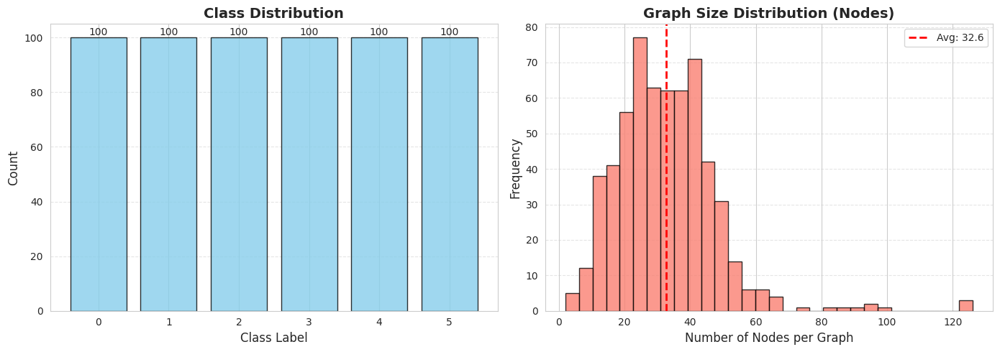

[Visuals] Saved extended dataset info to dataset_info.png
Dataset Features: 21 (Input Dimension)
Starting Main Experiment (10-Fold CV)...

STARTING FOLD 1/10
[Elapsed: 1:42:47] [RAM: 1601.0 MB] --- Fold 1: Initializing GIN ---
[Elapsed: 1:42:47] [RAM: 1601.0 MB] Starting Training Loop...
[Elapsed: 1:42:52] [RAM: 1601.2 MB] Epoch 010 | Train: 1.6371 | Val: 1.7175 (Acc: 0.2667)
[Elapsed: 1:42:56] [RAM: 1601.3 MB] Epoch 020 | Train: 1.5270 | Val: 1.7609 (Acc: 0.2667)
[Elapsed: 1:43:00] [RAM: 1601.3 MB] Epoch 030 | Train: 1.3984 | Val: 1.8661 (Acc: 0.3833)
[Elapsed: 1:43:04] [RAM: 1601.3 MB] Epoch 040 | Train: 1.3673 | Val: 1.5083 (Acc: 0.4667)
[Elapsed: 1:43:08] [RAM: 1601.3 MB] Epoch 050 | Train: 1.2601 | Val: 1.7659 (Acc: 0.3167)
[Elapsed: 1:43:12] [RAM: 1601.3 MB] Epoch 060 | Train: 1.0821 | Val: 1.9644 (Acc: 0.4333)
[Elapsed: 1:43:16] [RAM: 1601.3 MB] Epoch 070 | Train: 1.0734 | Val: 1.7029 (Acc: 0.4667)
[Elapsed: 1:43:20] [RAM: 1601.3 MB] Epoch 080 | Train: 0.9848 | Val: 1.3936 (Acc:

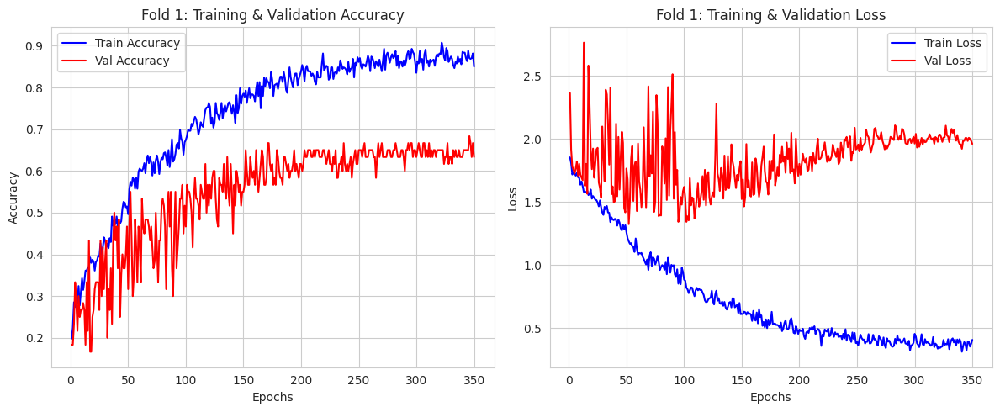

[Elapsed: 1:45:24] [RAM: 1601.3 MB] Loading 'embeddings_fold_1.npz' for Evaluation...

   [Fold 1 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_Lin    | 55.0%   | 53.7%   | 0.843    | 0.22s
   SVM_RBF    | 55.0%   | 52.4%   | 0.812    | 0.09s
   RF         | 56.7%   | 53.7%   | 0.821    | 0.78s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 60.0%   | 59.0%   | 0.814    | 6.19s
   >> KMeans ARI: 0.0866
   >> Spectral ARI: 0.1474

Computing t-SNE for cluster comparison...


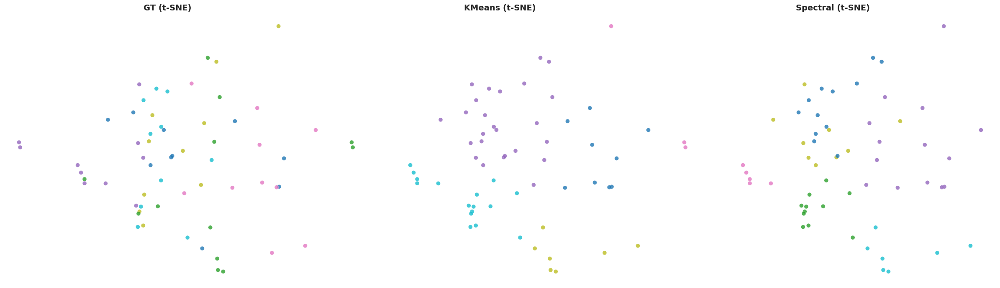

[Visuals] Saved 3-panel cluster comparison to pca_cluster_comparison_fold_1.png
>> Running Stability Analysis for Fold 1...

>> ] Running Analysis for Fold 1...
   > Clean Baseline Acc: 55.00%
[Elapsed: 1:45:32] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:45:32] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:45:32] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:45:32] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:45:32] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:45:32] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:45:32] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:45:32] [RAM: 1606.8 MB] Perturb Dataset...

   [Fold 1 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5500   | 1.0000
   add        | 5%      | 0.5167   | 0.9950
   add        | 10%      | 0.5000   | 0.9871
   add        | 15%      | 0.4333   | 0.9774
   add        | 20%      | 0.4167   | 0.9625
   remove     | 5%    

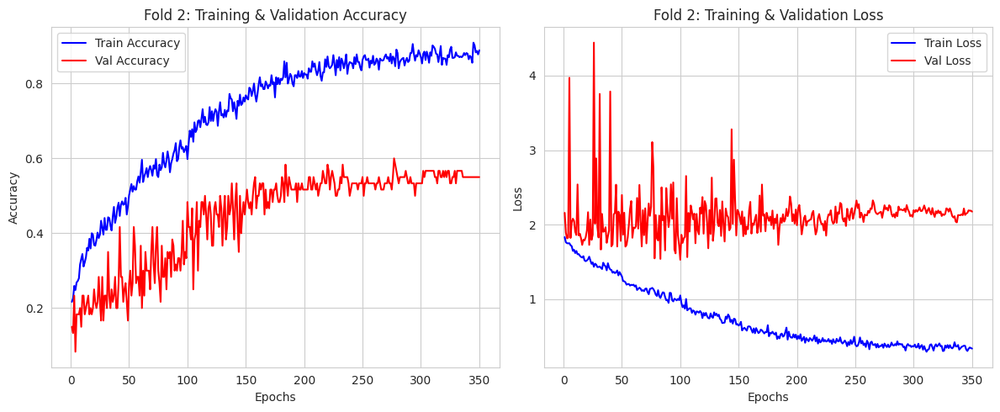

[Elapsed: 1:47:53] [RAM: 1606.8 MB] Loading 'embeddings_fold_2.npz' for Evaluation...

   [Fold 2 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 45.0%   | 43.8%   | 0.759    | 0.13s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_RBF    | 43.3%   | 43.7%   | 0.782    | 0.10s
   RF         | 45.0%   | 43.7%   | 0.818    | 0.74s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 51.7%   | 51.7%   | 0.771    | 6.23s
   >> KMeans ARI: 0.0491
   >> Spectral ARI: 0.0296

>> Running Stability Analysis for Fold 2...

>> ] Running Analysis for Fold 2...
   > Clean Baseline Acc: 48.33%
[Elapsed: 1:48:00] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:48:00] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:48:00] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:48:00] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:48:00] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:48:00] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:48:00] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:48:00] [RAM: 1606.8 MB] Perturb Dataset...

   [Fold 2 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.4833   | 1.0000
   add        | 5%      | 0.5000   | 0.9961
   add        | 10%      | 0.4500   | 0.9892
   add        | 15%      | 0.3500   | 0.9784
   add        | 20%      | 0.4000   | 0.9

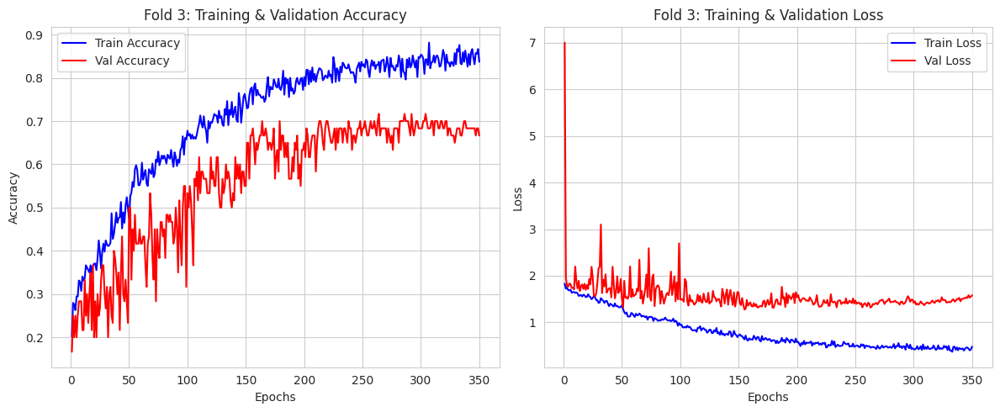

[Elapsed: 1:50:22] [RAM: 1606.8 MB] Loading 'embeddings_fold_3.npz' for Evaluation...

   [Fold 3 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 61.7%   | 61.9%   | 0.850    | 0.16s
   SVM_RBF    | 70.0%   | 70.2%   | 0.848    | 0.12s
   RF         | 61.7%   | 61.9%   | 0.834    | 0.93s
   MLP        | 63.3%   | 62.2%   | 0.867    | 3.24s
   >> KMeans ARI: 0.1049
   >> Spectral ARI: 0.1457

>> Running Stability Analysis for Fold 3...

>> ] Running Analysis for Fold 3...
   > Clean Baseline Acc: 66.67%
[Elapsed: 1:50:27] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:50:27] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:50:27] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:50:27] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:50:27] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:50:27] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:50:27] [RAM: 1606.8 MB] Perturb Dataset...
[Elap

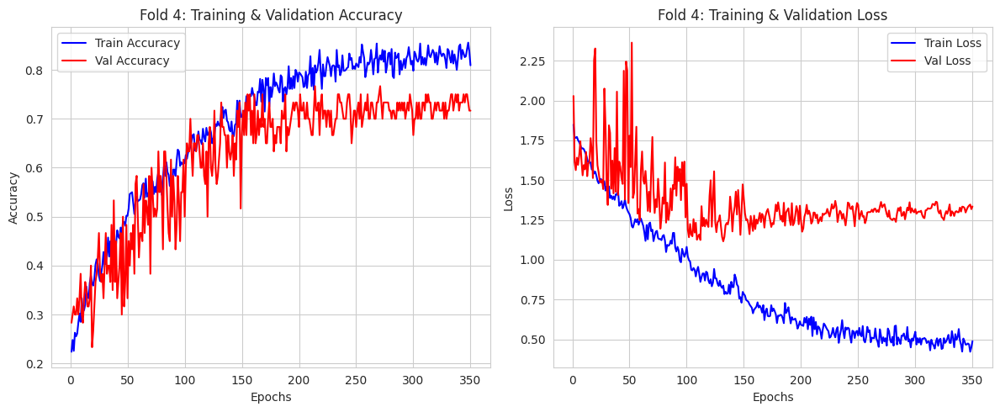

[Elapsed: 1:52:43] [RAM: 1606.8 MB] Loading 'embeddings_fold_4.npz' for Evaluation...

   [Fold 4 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 61.7%   | 62.4%   | 0.881    | 0.13s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_RBF    | 70.0%   | 70.3%   | 0.912    | 0.08s
   RF         | 70.0%   | 70.1%   | 0.913    | 0.78s
   MLP        | 71.7%   | 71.8%   | 0.895    | 5.67s
   >> KMeans ARI: 0.1494
   >> Spectral ARI: 0.0998

>> Running Stability Analysis for Fold 4...

>> ] Running Analysis for Fold 4...
   > Clean Baseline Acc: 73.33%
[Elapsed: 1:52:50] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:52:50] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:52:50] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:52:50] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:52:50] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:52:50] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:52:50] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:52:50] [RAM: 1606.8 MB] Perturb Dataset...

   [Fold 4 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.7333   | 1.0000
   add        | 5%      | 0.7167   | 0.9961
   add        | 10%      

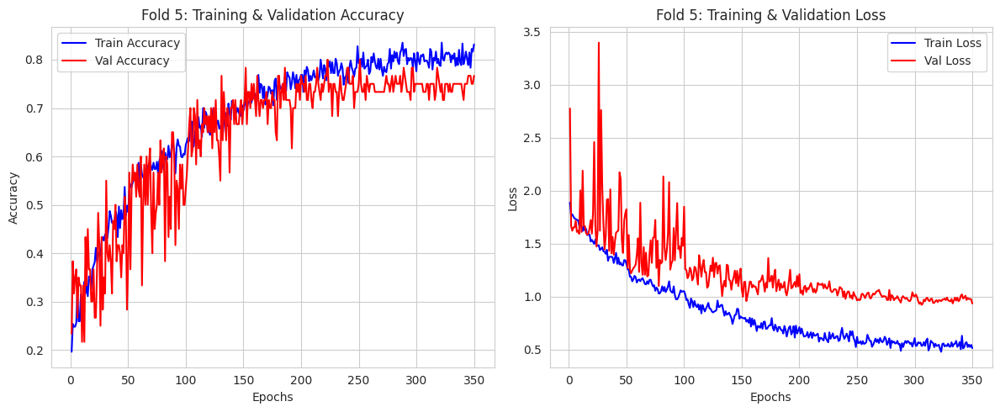

[Elapsed: 1:55:06] [RAM: 1606.8 MB] Loading 'embeddings_fold_5.npz' for Evaluation...

   [Fold 5 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 66.7%   | 67.8%   | 0.899    | 0.09s
   SVM_RBF    | 71.7%   | 71.9%   | 0.922    | 0.07s
   RF         | 71.7%   | 72.0%   | 0.940    | 0.74s
   MLP        | 75.0%   | 75.3%   | 0.919    | 2.90s
   >> KMeans ARI: 0.0853
   >> Spectral ARI: 0.2176

>> Running Stability Analysis for Fold 5...

>> ] Running Analysis for Fold 5...
   > Clean Baseline Acc: 73.33%
[Elapsed: 1:55:10] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:55:10] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:55:10] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:55:10] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:55:10] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:55:10] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:55:10] [RAM: 1606.8 MB] Perturb Dataset...
[Elap

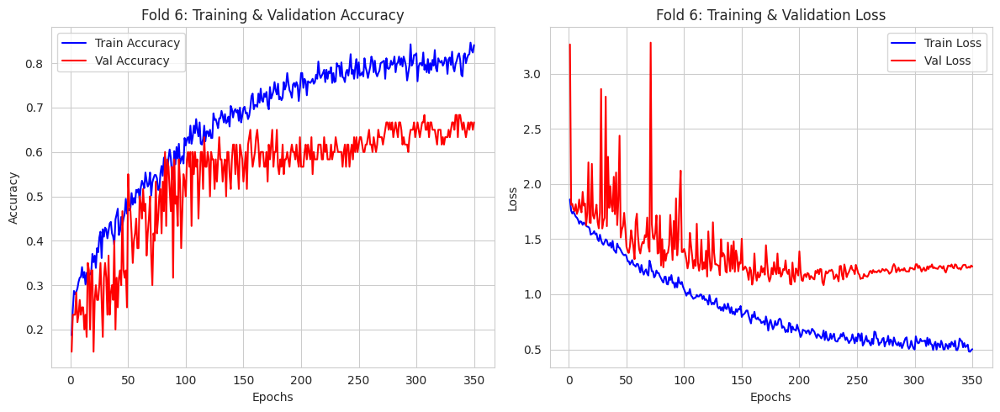

[Elapsed: 1:57:28] [RAM: 1606.8 MB] Loading 'embeddings_fold_6.npz' for Evaluation...

   [Fold 6 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 48.3%   | 49.1%   | 0.820    | 0.11s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_RBF    | 61.7%   | 61.2%   | 0.879    | 0.07s
   RF         | 61.7%   | 61.5%   | 0.894    | 0.77s
   MLP        | 60.0%   | 60.0%   | 0.863    | 3.21s
   >> KMeans ARI: 0.0533
   >> Spectral ARI: 0.1271

>> Running Stability Analysis for Fold 6...

>> ] Running Analysis for Fold 6...
   > Clean Baseline Acc: 60.00%
[Elapsed: 1:57:32] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:57:32] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:57:32] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:57:32] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:57:32] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:57:32] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:57:32] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:57:32] [RAM: 1606.8 MB] Perturb Dataset...

   [Fold 6 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.6000   | 1.0000
   add        | 5%      | 0.6000   | 0.9944
   add        | 10%      

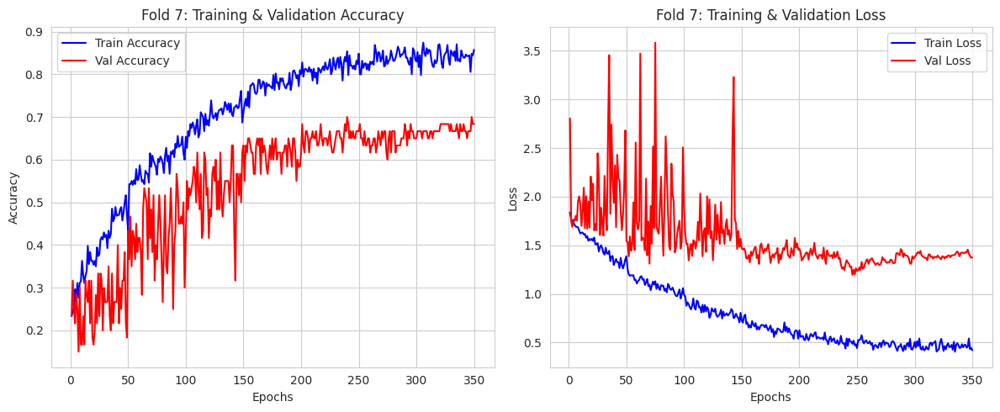

[Elapsed: 1:59:50] [RAM: 1606.8 MB] Loading 'embeddings_fold_7.npz' for Evaluation...

   [Fold 7 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 60.0%   | 59.5%   | 0.868    | 0.06s
   SVM_RBF    | 66.7%   | 66.5%   | 0.900    | 0.06s
   RF         | 65.0%   | 64.3%   | 0.882    | 0.73s
   MLP        | 60.0%   | 59.8%   | 0.845    | 4.62s
   >> KMeans ARI: 0.1707
   >> Spectral ARI: 0.1348

>> Running Stability Analysis for Fold 7...

>> ] Running Analysis for Fold 7...
   > Clean Baseline Acc: 65.00%
[Elapsed: 1:59:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:59:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:59:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:59:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:59:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:59:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 1:59:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elap

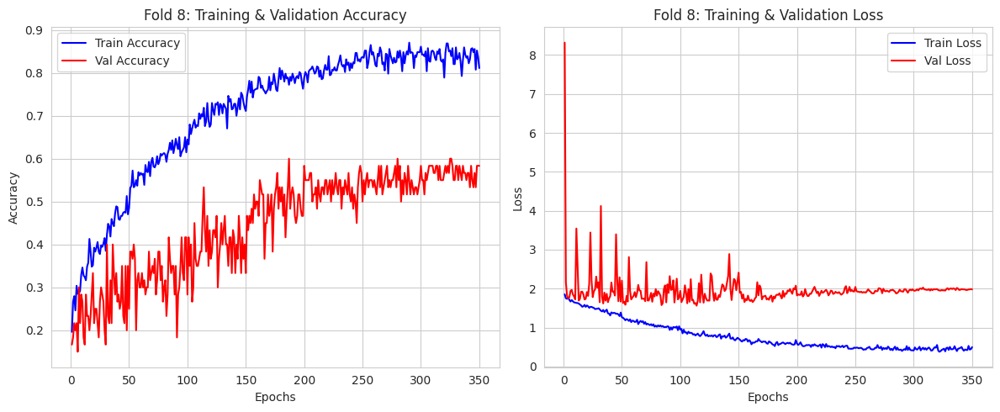

[Elapsed: 2:02:11] [RAM: 1606.8 MB] Loading 'embeddings_fold_8.npz' for Evaluation...

   [Fold 8 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 50.0%   | 50.2%   | 0.797    | 0.12s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_RBF    | 45.0%   | 45.6%   | 0.788    | 0.08s
   RF         | 53.3%   | 53.9%   | 0.816    | 0.76s
   MLP        | 50.0%   | 48.9%   | 0.797    | 3.95s
   >> KMeans ARI: 0.0480
   >> Spectral ARI: 0.0654

>> Running Stability Analysis for Fold 8...

>> ] Running Analysis for Fold 8...
   > Clean Baseline Acc: 53.33%
[Elapsed: 2:02:16] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:02:16] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:02:16] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:02:16] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:02:16] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:02:16] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:02:16] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:02:16] [RAM: 1606.8 MB] Perturb Dataset...

   [Fold 8 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5333   | 1.0000
   add        | 5%      | 0.4833   | 0.9934
   add        | 10%      

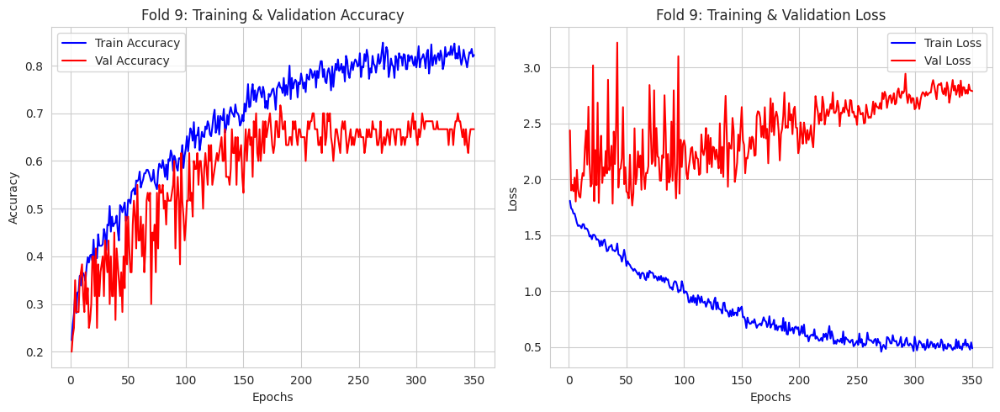

[Elapsed: 2:04:33] [RAM: 1606.8 MB] Loading 'embeddings_fold_9.npz' for Evaluation...

   [Fold 9 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_Lin    | 50.0%   | 49.9%   | 0.773    | 0.24s
   SVM_RBF    | 58.3%   | 58.1%   | 0.819    | 0.08s
   RF         | 58.3%   | 58.6%   | 0.821    | 0.77s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 58.3%   | 58.8%   | 0.803    | 4.18s
   >> KMeans ARI: 0.0666
   >> Spectral ARI: 0.0780

>> Running Stability Analysis for Fold 9...

>> ] Running Analysis for Fold 9...
   > Clean Baseline Acc: 51.67%
[Elapsed: 2:04:38] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:04:38] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:04:38] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:04:38] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:04:38] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:04:38] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:04:38] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:04:38] [RAM: 1606.8 MB] Perturb Dataset...

   [Fold 9 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5167   | 1.0000
   add        | 5%      | 0.4667   | 0.9973
   add        | 10%      | 0.5000   | 0.9904
   add        | 15%      | 0.4500   | 0.9747
   add        | 20%      | 0.4833   | 0.9

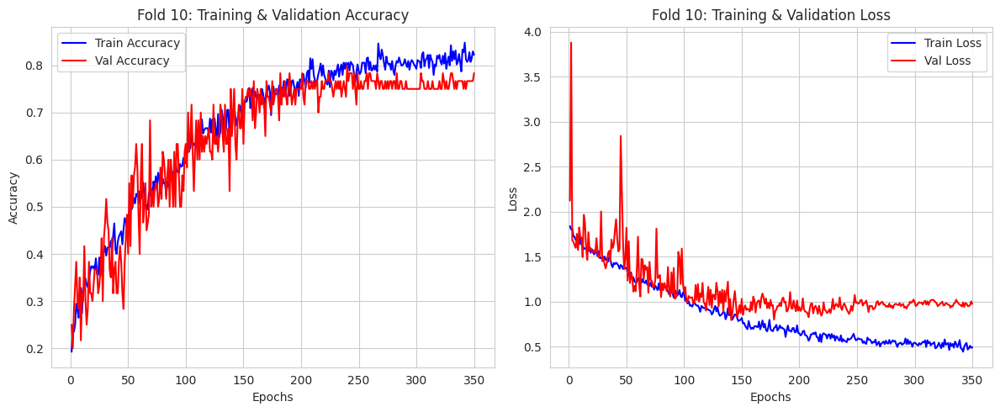

[Elapsed: 2:06:56] [RAM: 1606.8 MB] Loading 'embeddings_fold_10.npz' for Evaluation...

   [Fold 10 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_Lin    | 65.0%   | 64.7%   | 0.891    | 0.22s
   SVM_RBF    | 71.7%   | 71.4%   | 0.932    | 0.13s
   RF         | 80.0%   | 79.5%   | 0.957    | 1.22s
   MLP        | 73.3%   | 73.1%   | 0.923    | 3.68s
   >> KMeans ARI: 0.1877
   >> Spectral ARI: 0.1970

>> Running Stability Analysis for Fold 10...

>> ] Running Analysis for Fold 10...
   > Clean Baseline Acc: 70.00%
[Elapsed: 2:07:01] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:07:01] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:07:01] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:07:02] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:07:02] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:07:02] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:07:02] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:07:02] [RAM: 1606.8 MB] Perturb Dataset...

   [Fold 10 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.7000   | 1.0000
   add       

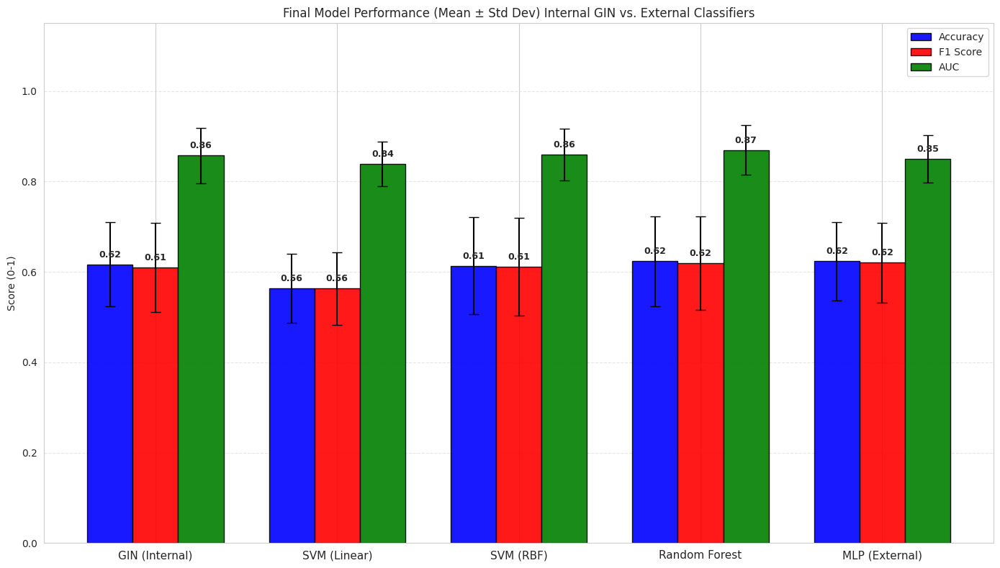

[Visuals] Saved final summary to final_performance.png


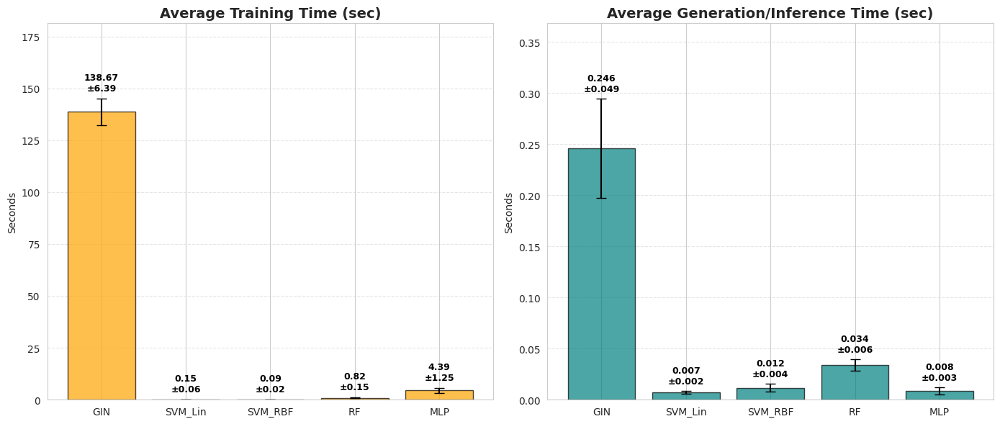

[Visuals] Saved resource usage report to resource_usage.png

      RESOURCE CONSUMPTION REPORT (Mean ± Std)
Method     | Train Time (s)       | Gen Time (s)         | Peak RAM (MB)  
---------------------------------------------------------------------------
GIN        | 138.67 ± 6.39        | 0.25 ± 0.05          | 0.45 ± 0.01    
SVM_Lin    | 0.15 ± 0.06          | 0.01 ± 0.00          | -
SVM_RBF    | 0.09 ± 0.02          | 0.01 ± 0.00          | -
RF         | 0.82 ± 0.15          | 0.03 ± 0.01          | -
MLP        | 4.39 ± 1.25          | 0.01 ± 0.00          | -


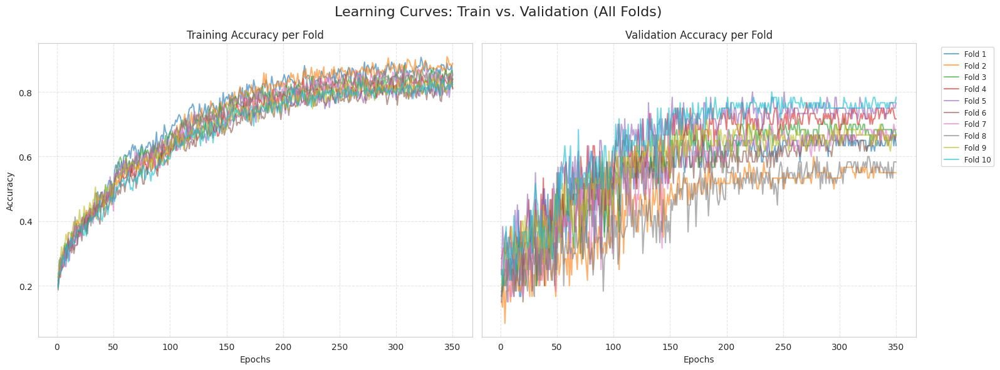

[Visuals] Saved training curves: fold_training_curves.png


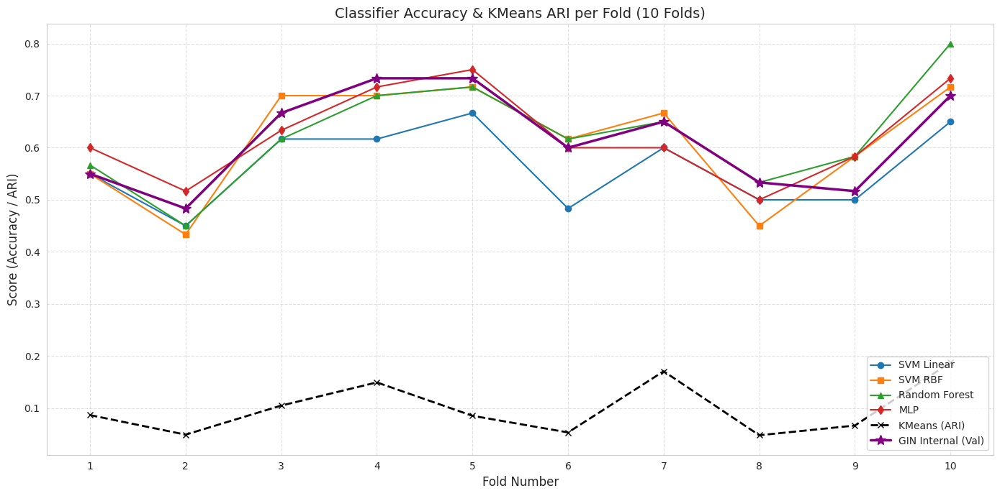

[Visuals] Saved fold performance plot: fold_performance.png
>> Generating Dual Stability Summary Plot to final_stability_bar_chart.png...


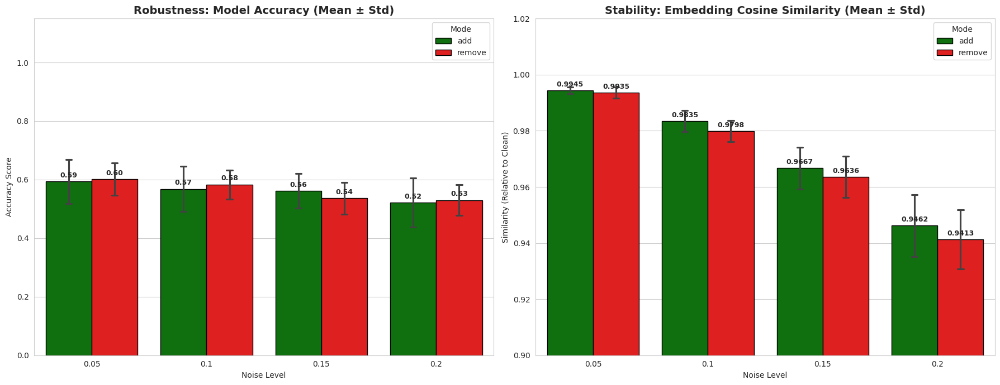

[Plots] Saved dual stability plot to final_stability_bar_chart.png

>> Merging detailed stability reports...
[Data] Saved master stability file: stability_detailed_ALL_FOLDS.csv
>> Generating Robustness Curve for Model_Accuracy...


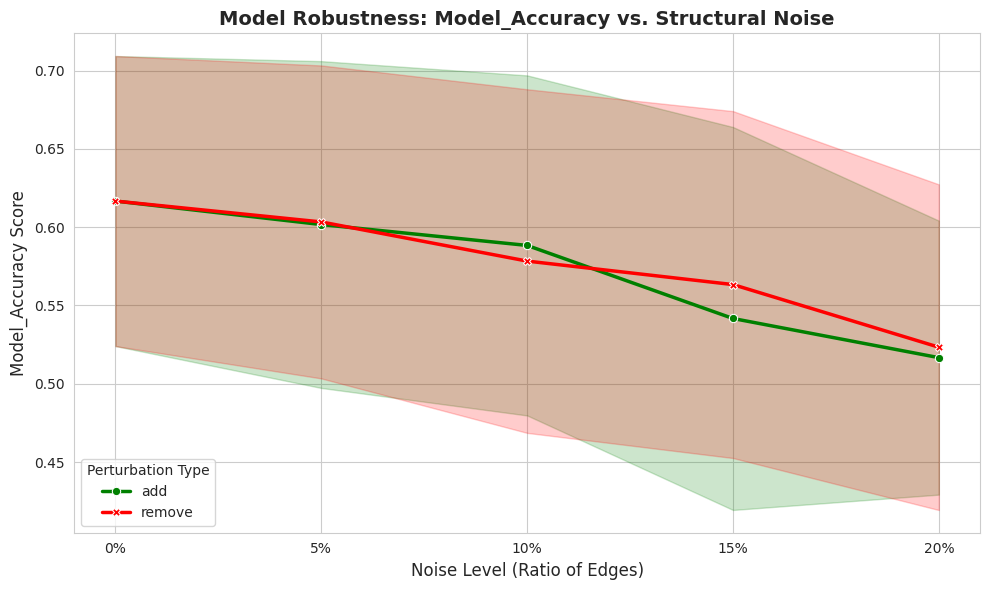

[Plots] Saved robustness curve to robustness_model_acc.png
>> Generating Robustness Curve for Cosine_Similarity...


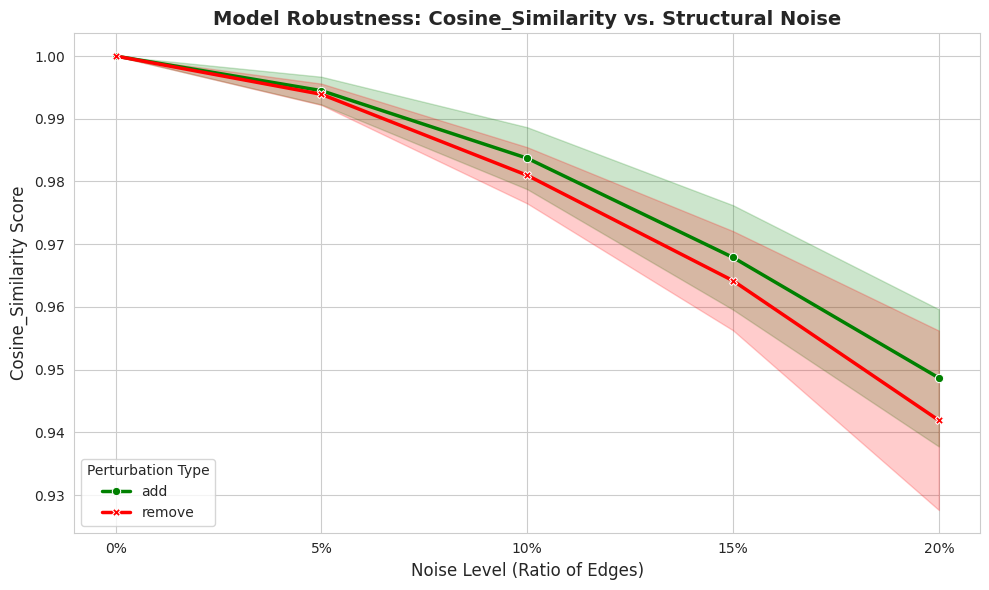

[Plots] Saved robustness curve to robustness_cosine_sim.png

Pipeline Finished in 24.36 minutes.


In [ ]:
# ==============================================================================
# CONFIGURATION
# ==============================================================================
DATASET_NAME = 'ENZYMES'
run_pipeline(run_dataset_analysis=True, run_main_experiment=True, enable_stability=True)

In [ ]:
!zip -r /content/enzymes_stepLR64.zip /content/*.npz /content/*.csv /content/*.png /content/*.json /content/*.pth

  adding: content/embeddings_fold_10.npz (deflated 10%)
  adding: content/embeddings_fold_1.npz (deflated 10%)
  adding: content/embeddings_fold_2.npz (deflated 9%)
  adding: content/embeddings_fold_3.npz (deflated 10%)
  adding: content/embeddings_fold_4.npz (deflated 9%)
  adding: content/embeddings_fold_5.npz (deflated 10%)
  adding: content/embeddings_fold_6.npz (deflated 9%)
  adding: content/embeddings_fold_7.npz (deflated 10%)
  adding: content/embeddings_fold_8.npz (deflated 10%)
  adding: content/embeddings_fold_9.npz (deflated 10%)
  adding: content/experiment_results.csv (deflated 62%)
  adding: content/stability_detailed_ALL_FOLDS.csv (deflated 69%)
  adding: content/stability_fold_10_detailed.csv (deflated 51%)
  adding: content/stability_fold_1_detailed.csv (deflated 49%)
  adding: content/stability_fold_2_detailed.csv (deflated 49%)
  adding: content/stability_fold_3_detailed.csv (deflated 52%)
  adding: content/stability_fold_4_detailed.csv (deflated 49%)
  adding: cont

STARTING PIPELINE
Loading ENZYMES

Running Dataset Analysis & Plotting...

      DATASET SUMMARY
Total Graphs:    600
Num Classes:     6
Avg Nodes/Graph: 32.63 (Min: 2, Max: 126)
Avg Edges/Graph: 124.27 (Min: 2, Max: 298)
----------------------------------------


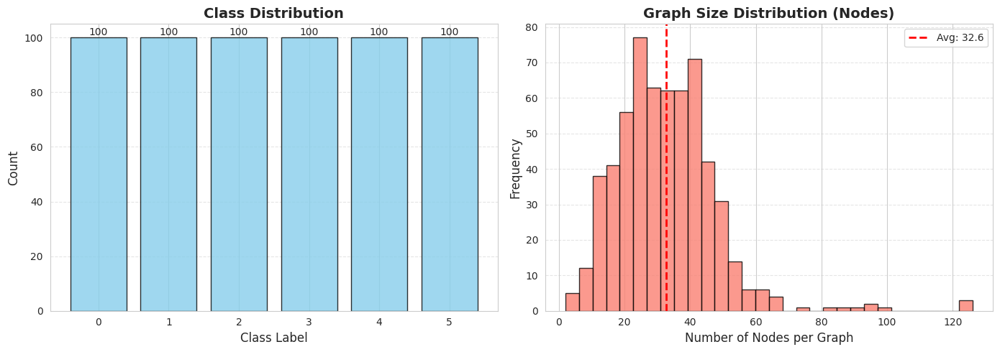

[Visuals] Saved extended dataset info to dataset_info.png
Dataset Features: 21 (Input Dimension)
Starting Main Experiment (10-Fold CV)...

STARTING FOLD 1/10
[Elapsed: 2:07:08] [RAM: 1606.8 MB] --- Fold 1: Initializing GIN ---
[Elapsed: 2:07:08] [RAM: 1606.8 MB] Starting Training Loop...
[Elapsed: 2:07:13] [RAM: 1606.8 MB] Epoch 010 | Train: 1.6747 | Val: 1.7041 (Acc: 0.2500)
[Elapsed: 2:07:16] [RAM: 1606.8 MB] Epoch 020 | Train: 1.5516 | Val: 1.7829 (Acc: 0.3667)
[Elapsed: 2:07:20] [RAM: 1606.8 MB] Epoch 030 | Train: 1.5259 | Val: 1.7623 (Acc: 0.3000)
[Elapsed: 2:07:24] [RAM: 1606.8 MB] Epoch 040 | Train: 1.4467 | Val: 1.5558 (Acc: 0.3167)
[Elapsed: 2:07:28] [RAM: 1606.8 MB] Epoch 050 | Train: 1.3251 | Val: 1.6689 (Acc: 0.3833)
[Elapsed: 2:07:31] [RAM: 1606.8 MB] Epoch 060 | Train: 1.2759 | Val: 1.4077 (Acc: 0.5500)
[Elapsed: 2:07:36] [RAM: 1606.8 MB] Epoch 070 | Train: 1.2397 | Val: 2.3959 (Acc: 0.3667)
[Elapsed: 2:07:39] [RAM: 1606.8 MB] Epoch 080 | Train: 1.1260 | Val: 1.8022 (Acc:

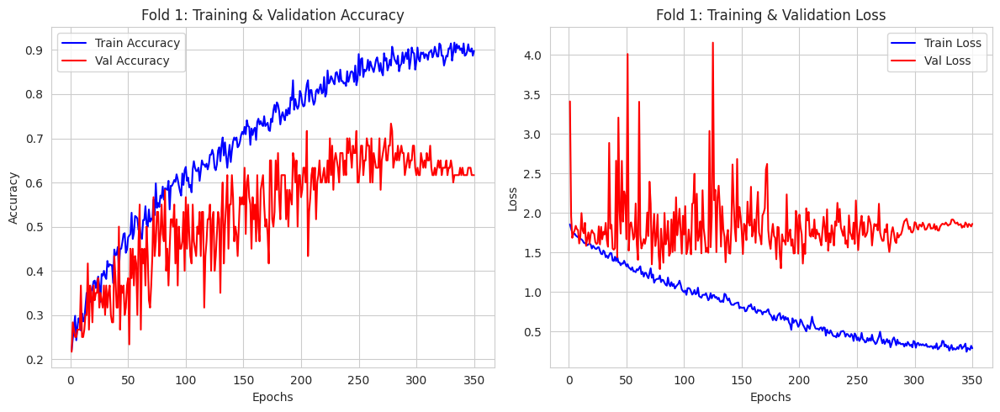

[Elapsed: 2:09:28] [RAM: 1606.8 MB] Loading 'embeddings_fold_1.npz' for Evaluation...

   [Fold 1 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_Lin    | 60.0%   | 59.7%   | 0.836    | 0.21s
   SVM_RBF    | 61.7%   | 61.4%   | 0.859    | 0.09s
   RF         | 61.7%   | 61.7%   | 0.870    | 0.77s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 65.0%   | 63.7%   | 0.870    | 4.35s
   >> KMeans ARI: 0.0413
   >> Spectral ARI: 0.1338

Computing t-SNE for cluster comparison...


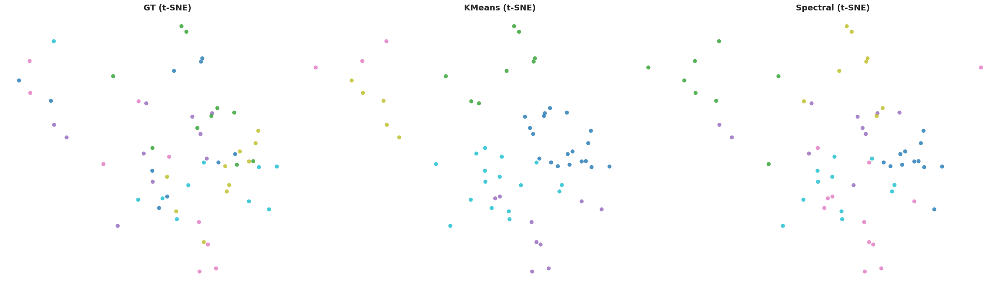

[Visuals] Saved 3-panel cluster comparison to pca_cluster_comparison_fold_1.png
>> Running Stability Analysis for Fold 1...

>> ] Running Analysis for Fold 1...
   > Clean Baseline Acc: 55.00%
[Elapsed: 2:09:34] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:09:34] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:09:34] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:09:35] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:09:35] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:09:35] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:09:35] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:09:35] [RAM: 1606.8 MB] Perturb Dataset...

   [Fold 1 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5500   | 1.0000
   add        | 5%      | 0.5000   | 0.9974
   add        | 10%      | 0.5167   | 0.9917
   add        | 15%      | 0.4833   | 0.9796
   add        | 20%      | 0.4833   | 0.9672
   remove     | 5%    

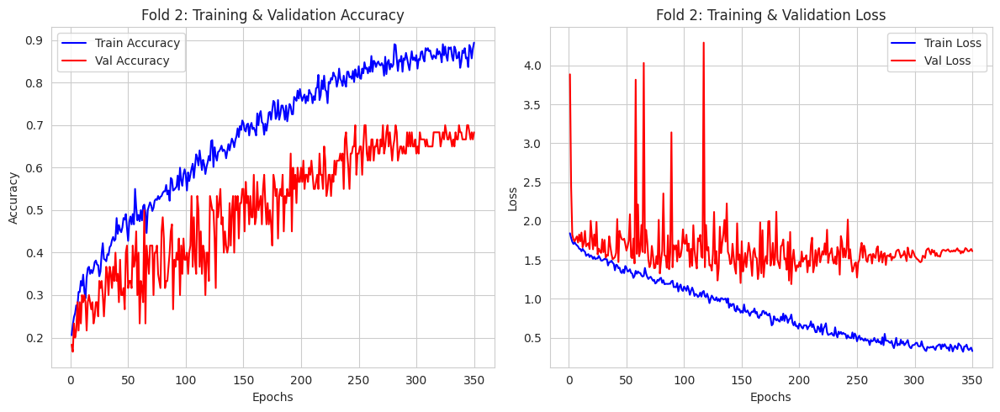

[Elapsed: 2:11:51] [RAM: 1606.8 MB] Loading 'embeddings_fold_2.npz' for Evaluation...

   [Fold 2 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 56.7%   | 57.0%   | 0.840    | 0.10s
   SVM_RBF    | 55.0%   | 55.3%   | 0.858    | 0.07s
   RF         | 65.0%   | 64.7%   | 0.865    | 0.74s
   MLP        | 56.7%   | 56.8%   | 0.850    | 3.64s
   >> KMeans ARI: 0.0571
   >> Spectral ARI: 0.0888

>> Running Stability Analysis for Fold 2...

>> ] Running Analysis for Fold 2...
   > Clean Baseline Acc: 60.00%
[Elapsed: 2:11:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:11:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:11:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:11:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:11:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:11:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:11:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elap

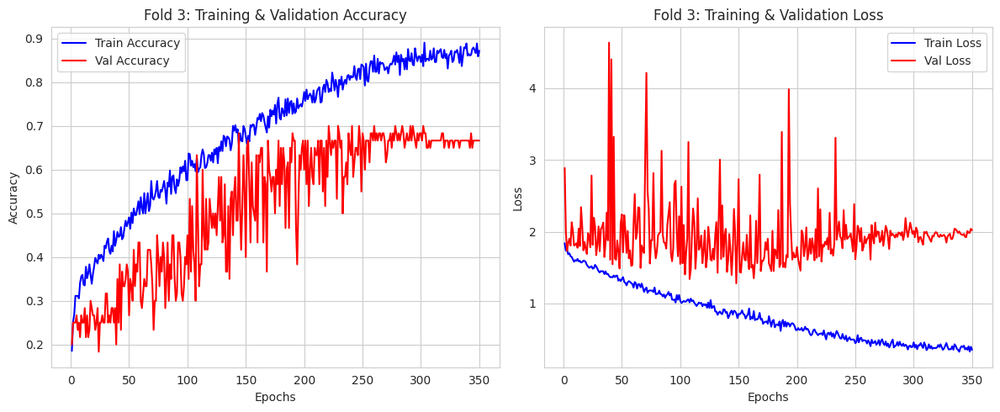

[Elapsed: 2:14:11] [RAM: 1606.8 MB] Loading 'embeddings_fold_3.npz' for Evaluation...

   [Fold 3 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 61.7%   | 62.0%   | 0.834    | 0.11s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_RBF    | 66.7%   | 66.7%   | 0.867    | 0.07s
   RF         | 66.7%   | 66.7%   | 0.894    | 0.95s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 63.3%   | 62.6%   | 0.849    | 5.70s
   >> KMeans ARI: 0.0395
   >> Spectral ARI: 0.1012

>> Running Stability Analysis for Fold 3...

>> ] Running Analysis for Fold 3...
   > Clean Baseline Acc: 63.33%
[Elapsed: 2:14:18] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:14:18] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:14:18] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:14:18] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:14:18] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:14:18] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:14:18] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:14:18] [RAM: 1606.8 MB] Perturb Dataset...

   [Fold 3 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.6333   | 1.0000
   add        | 5%      | 0.6333   | 0.9964
   add        | 10%      | 0.6333   | 0.9859
   add        | 15%      | 0.5667   | 0.9764
   add        | 20%      | 0.5833   | 0.9

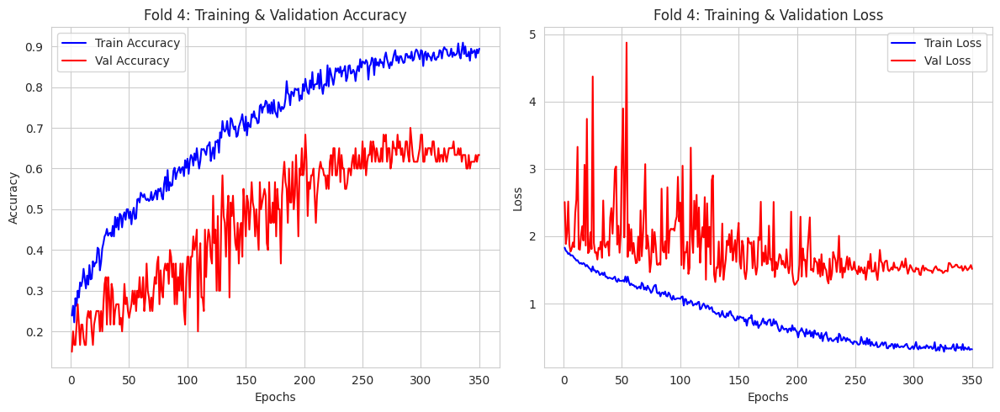

[Elapsed: 2:16:32] [RAM: 1606.8 MB] Loading 'embeddings_fold_4.npz' for Evaluation...

   [Fold 4 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 58.3%   | 58.7%   | 0.866    | 0.07s
   SVM_RBF    | 60.0%   | 60.2%   | 0.879    | 0.06s


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   RF         | 58.3%   | 58.9%   | 0.865    | 0.75s
   MLP        | 63.3%   | 64.2%   | 0.865    | 3.51s
   >> KMeans ARI: 0.0708
   >> Spectral ARI: 0.1166

>> Running Stability Analysis for Fold 4...

>> ] Running Analysis for Fold 4...
   > Clean Baseline Acc: 65.00%
[Elapsed: 2:16:37] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:16:37] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:16:37] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:16:37] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:16:37] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:16:37] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:16:37] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:16:37] [RAM: 1606.8 MB] Perturb Dataset...

   [Fold 4 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.6500   | 1.0000
   add        | 5%      | 0.6167   | 0.9957
   add        | 10%      | 0.5833   | 0.9874
   add        | 15%      | 0.5500

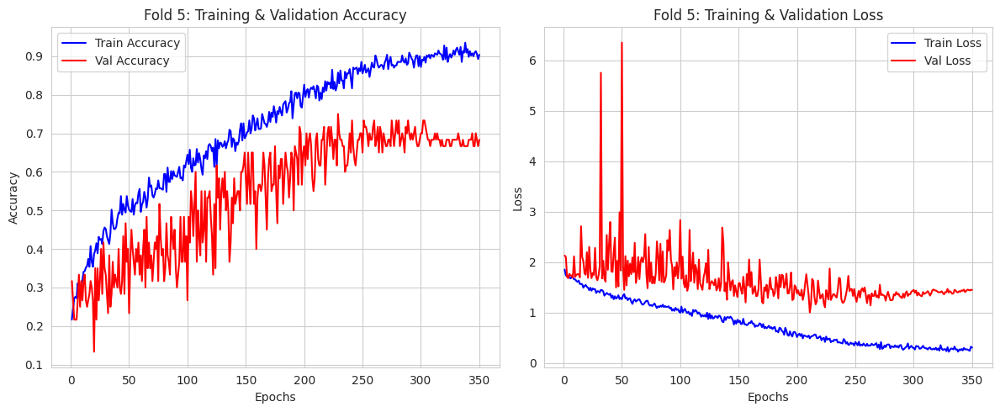

[Elapsed: 2:18:53] [RAM: 1606.8 MB] Loading 'embeddings_fold_5.npz' for Evaluation...

   [Fold 5 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 70.0%   | 69.6%   | 0.916    | 0.06s
   SVM_RBF    | 68.3%   | 68.2%   | 0.929    | 0.06s
   RF         | 71.7%   | 71.3%   | 0.934    | 0.73s
   MLP        | 70.0%   | 69.3%   | 0.926    | 2.17s
   >> KMeans ARI: 0.1049
   >> Spectral ARI: 0.1195

>> Running Stability Analysis for Fold 5...

>> ] Running Analysis for Fold 5...
   > Clean Baseline Acc: 70.00%
[Elapsed: 2:18:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:18:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:18:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:18:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:18:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:18:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:18:56] [RAM: 1606.8 MB] Perturb Dataset...
[Elap

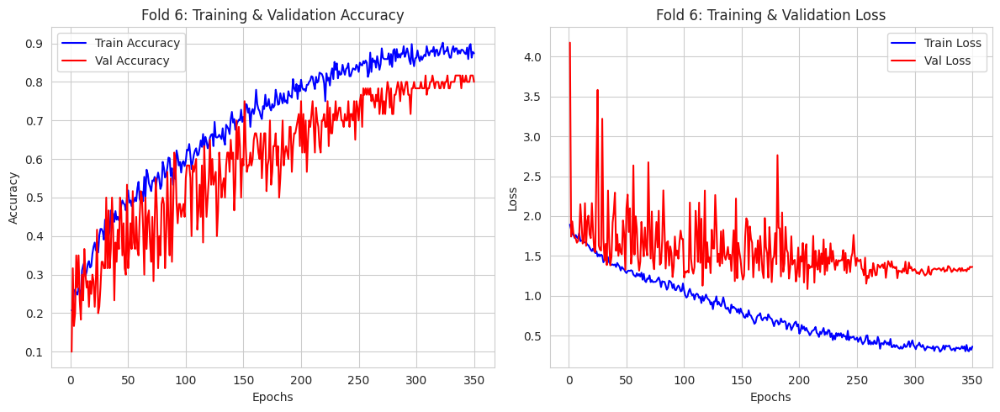

[Elapsed: 2:21:12] [RAM: 1606.8 MB] Loading 'embeddings_fold_6.npz' for Evaluation...

   [Fold 6 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 68.3%   | 68.6%   | 0.896    | 0.08s
   SVM_RBF    | 75.0%   | 75.2%   | 0.919    | 0.07s
   RF         | 75.0%   | 75.0%   | 0.922    | 0.75s
   MLP        | 71.7%   | 71.4%   | 0.919    | 2.98s
   >> KMeans ARI: 0.1527
   >> Spectral ARI: 0.2355

>> Running Stability Analysis for Fold 6...

>> ] Running Analysis for Fold 6...
   > Clean Baseline Acc: 70.00%
[Elapsed: 2:21:16] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:21:16] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:21:16] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:21:16] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:21:16] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:21:17] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:21:17] [RAM: 1606.8 MB] Perturb Dataset...
[Elap

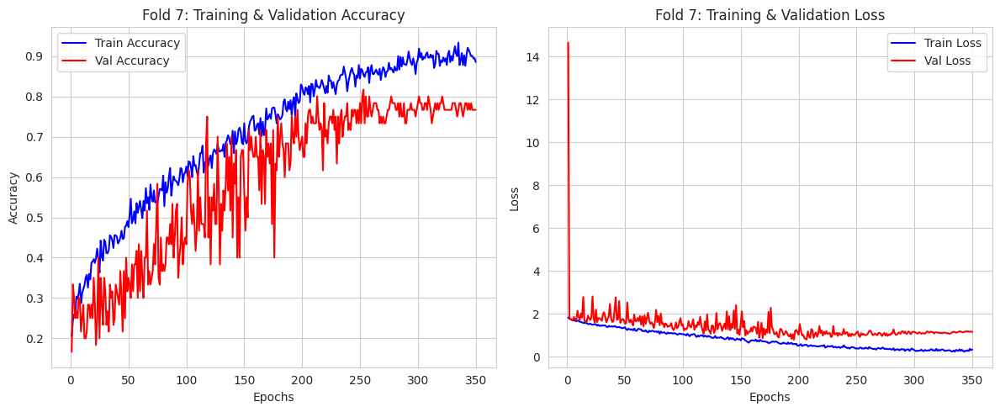

[Elapsed: 2:23:31] [RAM: 1606.8 MB] Loading 'embeddings_fold_7.npz' for Evaluation...

   [Fold 7 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 68.3%   | 67.6%   | 0.936    | 0.08s
   SVM_RBF    | 73.3%   | 73.6%   | 0.946    | 0.08s
   RF         | 66.7%   | 66.4%   | 0.940    | 0.75s
   MLP        | 73.3%   | 73.2%   | 0.938    | 2.89s
   >> KMeans ARI: 0.0879
   >> Spectral ARI: 0.2894

>> Running Stability Analysis for Fold 7...

>> ] Running Analysis for Fold 7...
   > Clean Baseline Acc: 76.67%
[Elapsed: 2:23:35] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:23:35] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:23:35] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:23:35] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:23:35] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:23:35] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:23:35] [RAM: 1606.8 MB] Perturb Dataset...
[Elap

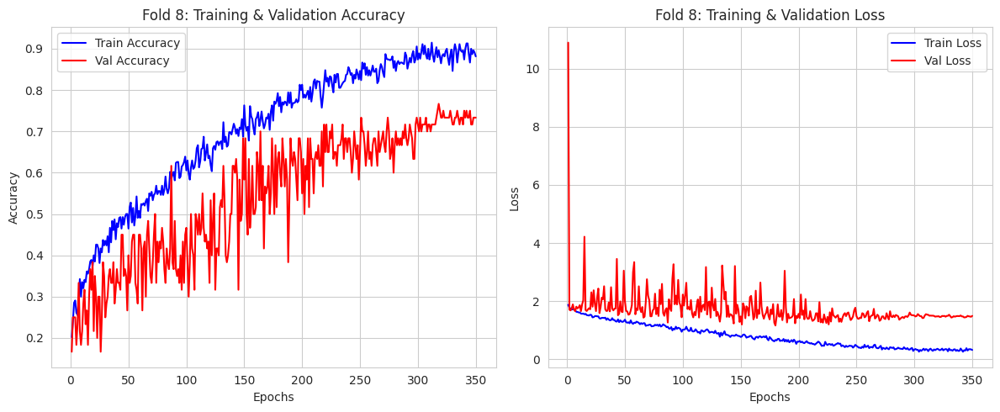

[Elapsed: 2:25:49] [RAM: 1606.8 MB] Loading 'embeddings_fold_8.npz' for Evaluation...

   [Fold 8 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 76.7%   | 76.6%   | 0.900    | 0.09s
   SVM_RBF    | 76.7%   | 76.5%   | 0.912    | 0.07s
   RF         | 76.7%   | 76.4%   | 0.912    | 0.75s
   MLP        | 70.0%   | 69.6%   | 0.907    | 3.39s
   >> KMeans ARI: 0.0287
   >> Spectral ARI: 0.1054

>> Running Stability Analysis for Fold 8...

>> ] Running Analysis for Fold 8...
   > Clean Baseline Acc: 65.00%
[Elapsed: 2:25:53] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:25:53] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:25:53] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:25:53] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:25:53] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:25:53] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:25:53] [RAM: 1606.8 MB] Perturb Dataset...
[Elap

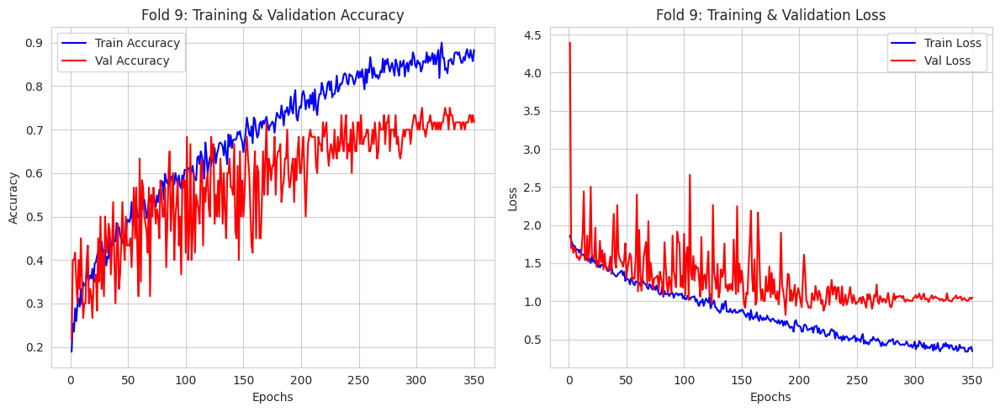

[Elapsed: 2:28:09] [RAM: 1606.8 MB] Loading 'embeddings_fold_9.npz' for Evaluation...

   [Fold 9 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------
   SVM_Lin    | 65.0%   | 64.9%   | 0.888    | 0.09s
   SVM_RBF    | 65.0%   | 64.5%   | 0.915    | 0.06s
   RF         | 61.7%   | 60.9%   | 0.905    | 0.73s
   MLP        | 63.3%   | 63.5%   | 0.891    | 2.58s
   >> KMeans ARI: 0.1837
   >> Spectral ARI: 0.2515

>> Running Stability Analysis for Fold 9...

>> ] Running Analysis for Fold 9...
   > Clean Baseline Acc: 70.00%
[Elapsed: 2:28:13] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:28:13] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:28:13] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:28:13] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:28:13] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:28:13] [RAM: 1606.8 MB] Perturb Dataset...
[Elapsed: 2:28:13] [RAM: 1606.8 MB] Perturb Dataset...
[Elap

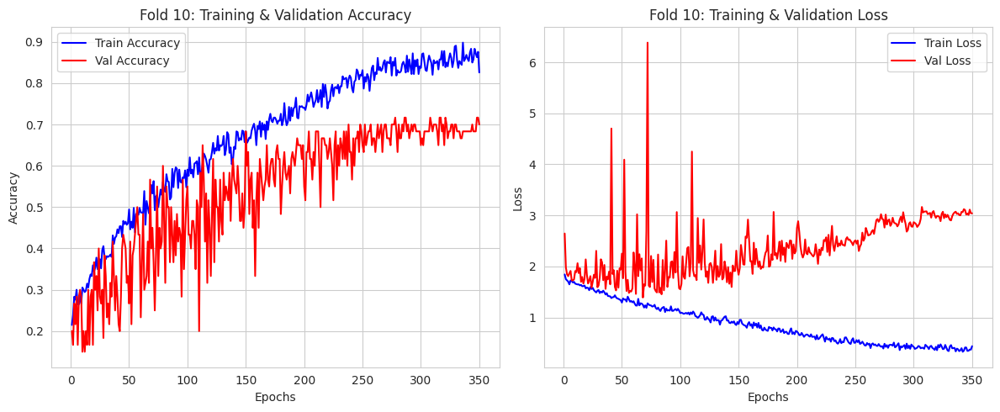

[Elapsed: 2:30:27] [RAM: 1606.9 MB] Loading 'embeddings_fold_10.npz' for Evaluation...

   [Fold 10 Evaluation]
   Model      | Acc      | F1       | AUC      | Time(s) 
   ------------------------------------------------------------


/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


   SVM_Lin    | 61.7%   | 61.2%   | 0.842    | 0.25s
   SVM_RBF    | 65.0%   | 63.8%   | 0.879    | 0.10s
   RF         | 65.0%   | 64.9%   | 0.883    | 0.77s


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


   MLP        | 63.3%   | 62.1%   | 0.873    | 6.05s
   >> KMeans ARI: 0.1126
   >> Spectral ARI: 0.1431

>> Running Stability Analysis for Fold 10...

>> ] Running Analysis for Fold 10...
   > Clean Baseline Acc: 56.67%
[Elapsed: 2:30:35] [RAM: 1606.9 MB] Perturb Dataset...
[Elapsed: 2:30:35] [RAM: 1606.9 MB] Perturb Dataset...
[Elapsed: 2:30:35] [RAM: 1606.9 MB] Perturb Dataset...
[Elapsed: 2:30:35] [RAM: 1606.9 MB] Perturb Dataset...
[Elapsed: 2:30:35] [RAM: 1606.9 MB] Perturb Dataset...
[Elapsed: 2:30:35] [RAM: 1606.9 MB] Perturb Dataset...
[Elapsed: 2:30:35] [RAM: 1606.9 MB] Perturb Dataset...
[Elapsed: 2:30:35] [RAM: 1606.9 MB] Perturb Dataset...

   [Fold 10 Stability Report]
   Mode       | Noise    | Acc      | CosSim  
   ----------------------------------------
   Clean      | 0%       | 0.5667   | 1.0000
   add        | 5%      | 0.5333   | 0.9952
   add        | 10%      | 0.5667   | 0.9766
   add        | 15%      | 0.4167   | 0.9506
   add        | 20%      | 0.4500   | 

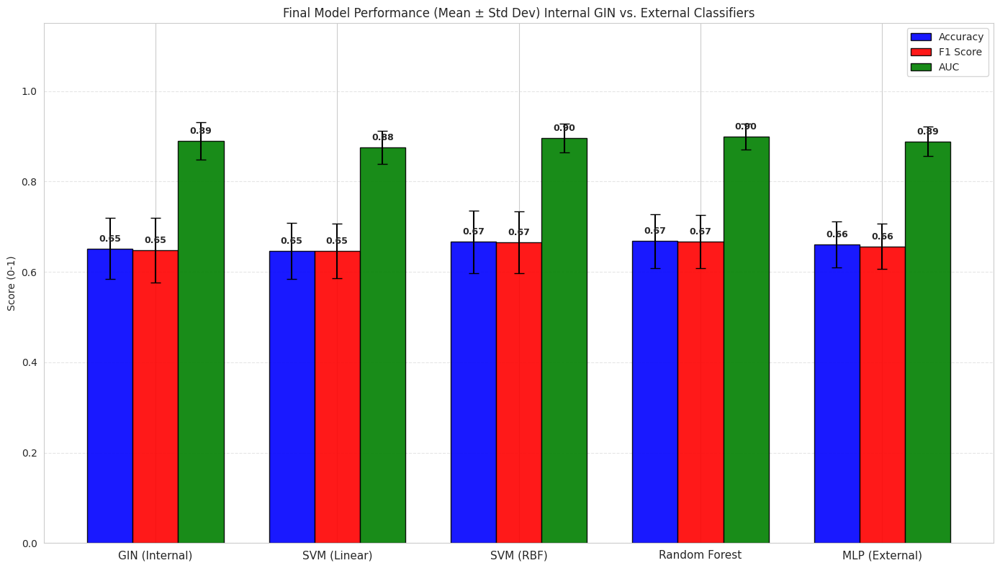

[Visuals] Saved final summary to final_performance.png


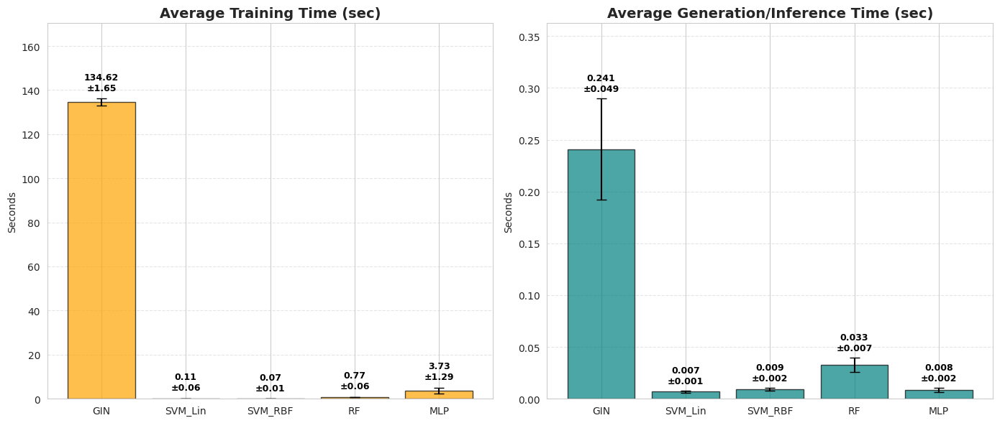

[Visuals] Saved resource usage report to resource_usage.png

      RESOURCE CONSUMPTION REPORT (Mean ± Std)
Method     | Train Time (s)       | Gen Time (s)         | Peak RAM (MB)  
---------------------------------------------------------------------------
GIN        | 134.62 ± 1.65        | 0.24 ± 0.05          | 0.45 ± 0.01    
SVM_Lin    | 0.11 ± 0.06          | 0.01 ± 0.00          | -
SVM_RBF    | 0.07 ± 0.01          | 0.01 ± 0.00          | -
RF         | 0.77 ± 0.06          | 0.03 ± 0.01          | -
MLP        | 3.73 ± 1.29          | 0.01 ± 0.00          | -


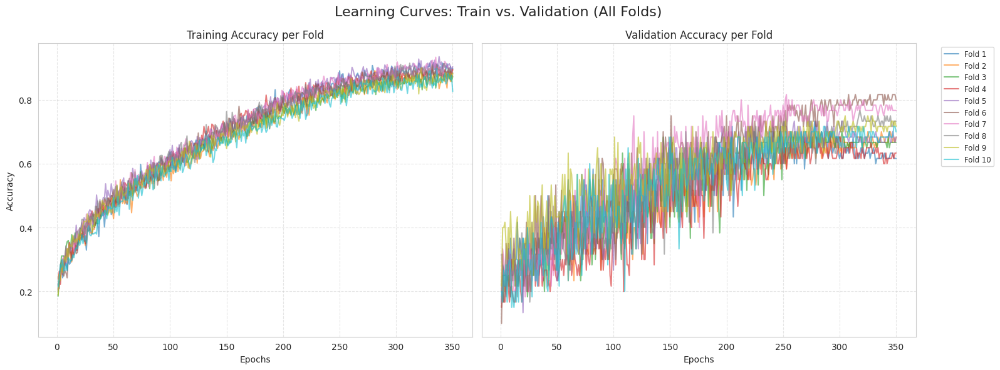

[Visuals] Saved training curves: fold_training_curves.png


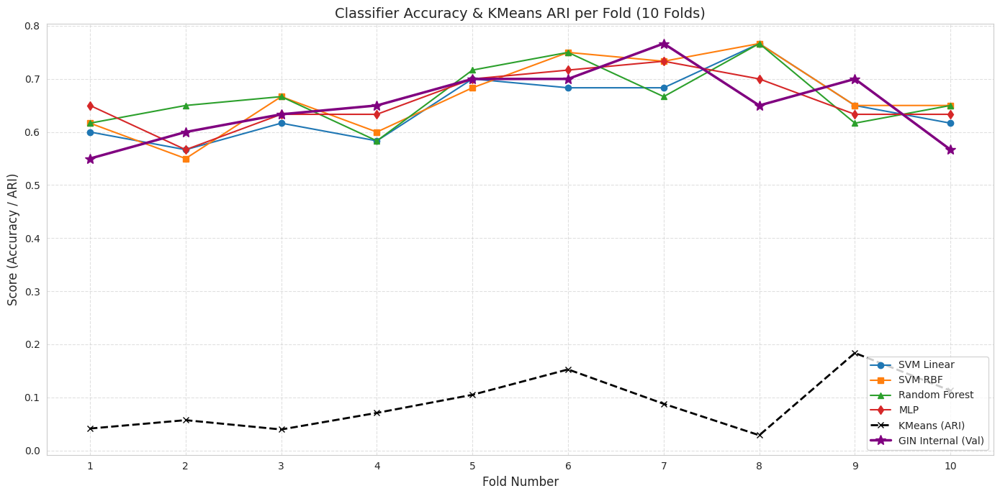

[Visuals] Saved fold performance plot: fold_performance.png
>> Generating Dual Stability Summary Plot to final_stability_bar_chart.png...


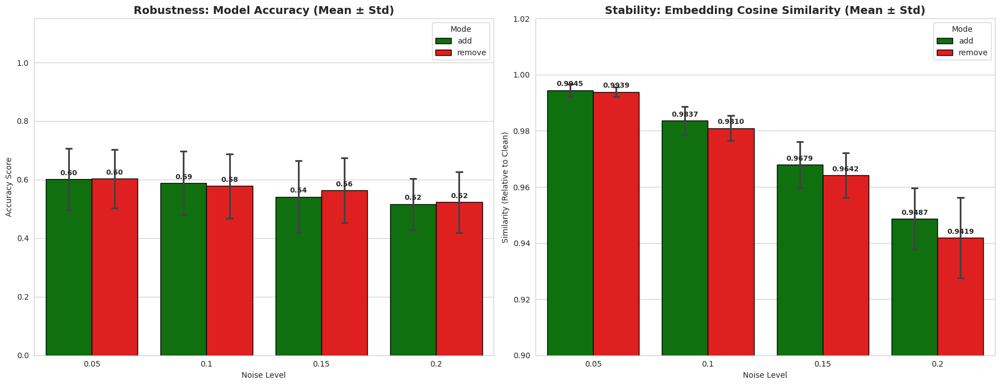

[Plots] Saved dual stability plot to final_stability_bar_chart.png

>> Merging detailed stability reports...
[Data] Saved master stability file: stability_detailed_ALL_FOLDS.csv
>> Generating Robustness Curve for Model_Accuracy...


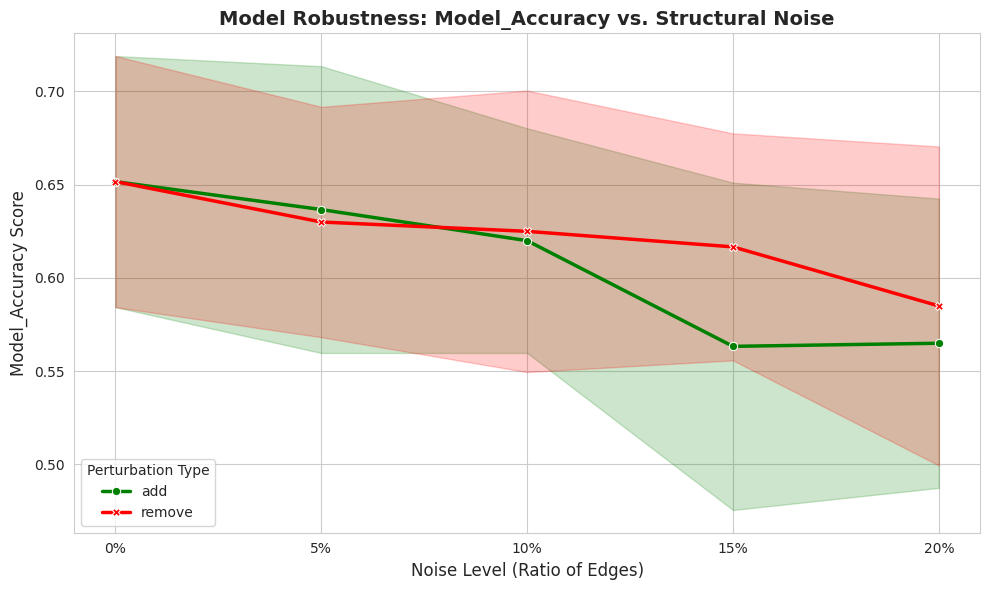

[Plots] Saved robustness curve to robustness_model_acc.png
>> Generating Robustness Curve for Cosine_Similarity...


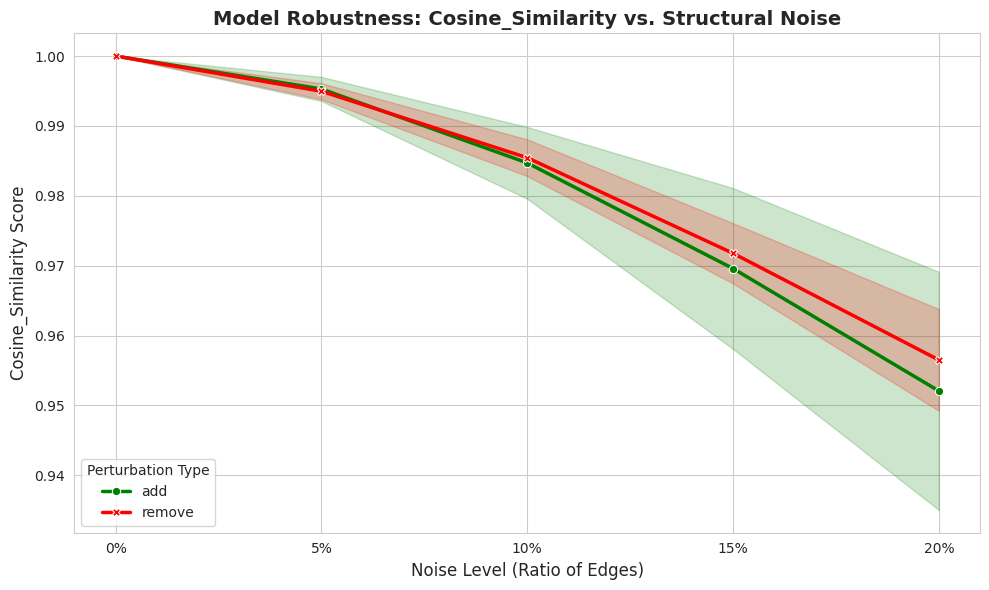

[Plots] Saved robustness curve to robustness_cosine_sim.png

Pipeline Finished in 23.56 minutes.


In [ ]:
# ==============================================================================
# CONFIGURATION
# ==============================================================================
DATASET_NAME = 'ENZYMES'
run_pipeline(run_dataset_analysis=True, run_main_experiment=True, enable_stability=True)

In [ ]:
!zip -r /content/enzymes_cos64.zip /content/*.npz /content/*.csv /content/*.png /content/*.json /content/*.pth

  adding: content/embeddings_fold_10.npz (deflated 10%)
  adding: content/embeddings_fold_1.npz (deflated 9%)
  adding: content/embeddings_fold_2.npz (deflated 9%)
  adding: content/embeddings_fold_3.npz (deflated 9%)
  adding: content/embeddings_fold_4.npz (deflated 9%)
  adding: content/embeddings_fold_5.npz (deflated 10%)
  adding: content/embeddings_fold_6.npz (deflated 9%)
  adding: content/embeddings_fold_7.npz (deflated 9%)
  adding: content/embeddings_fold_8.npz (deflated 10%)
  adding: content/embeddings_fold_9.npz (deflated 9%)
  adding: content/experiment_results.csv (deflated 63%)
  adding: content/stability_detailed_ALL_FOLDS.csv (deflated 70%)
  adding: content/stability_fold_10_detailed.csv (deflated 53%)
  adding: content/stability_fold_1_detailed.csv (deflated 52%)
  adding: content/stability_fold_2_detailed.csv (deflated 53%)
  adding: content/stability_fold_3_detailed.csv (deflated 52%)
  adding: content/stability_fold_4_detailed.csv (deflated 52%)
  adding: content/

STARTING PIPELINE
Loading ENZYMES

STARTING HYPERPARAMETER TUNING (Embedding Dimension)

»»» Testing Hidden Dimension: 16 «««
[Elapsed: 0:12:06] [RAM: 1495.1 MB] --- Fold 1000: Initializing GIN ---
[Elapsed: 0:12:06] [RAM: 1495.1 MB] Starting Training Loop...
[Elapsed: 0:12:10] [RAM: 1495.1 MB] Epoch 010 | Train: 1.7248 | Val: 1.7203 (Acc: 0.2333)
[Elapsed: 0:12:14] [RAM: 1495.1 MB] Epoch 020 | Train: 1.6317 | Val: 1.6824 (Acc: 0.3417)
[Elapsed: 0:12:17] [RAM: 1495.1 MB] Epoch 030 | Train: 1.6152 | Val: 1.7331 (Acc: 0.3000)
[Elapsed: 0:12:21] [RAM: 1495.1 MB] Epoch 040 | Train: 1.5965 | Val: 1.6555 (Acc: 0.3000)
[Elapsed: 0:12:25] [RAM: 1495.1 MB] Epoch 050 | Train: 1.5250 | Val: 1.6008 (Acc: 0.3583)
[Elapsed: 0:12:28] [RAM: 1495.1 MB] Epoch 060 | Train: 1.5394 | Val: 1.9343 (Acc: 0.3583)
[Elapsed: 0:12:32] [RAM: 1495.1 MB] Epoch 070 | Train: 1.5057 | Val: 2.7180 (Acc: 0.2833)
[Elapsed: 0:12:35] [RAM: 1495.1 MB] Epoch 080 | Train: 1.4546 | Val: 1.7480 (Acc: 0.3167)
[Elapsed: 0:12:39] [

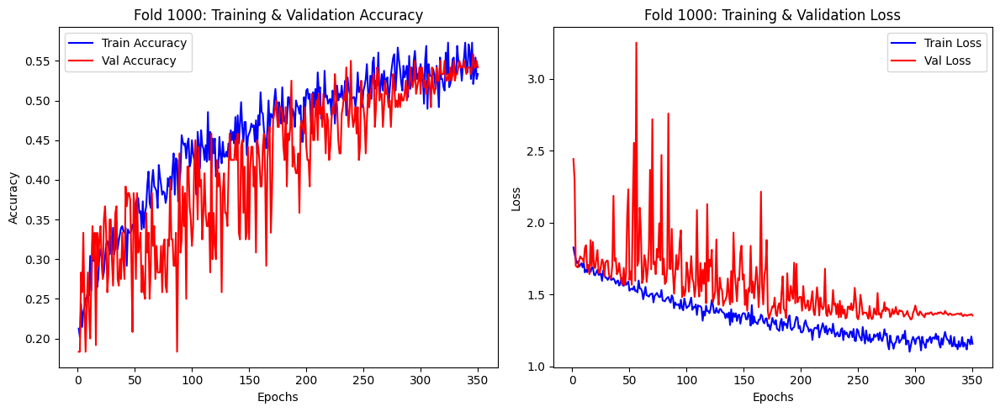


»»» Testing Hidden Dimension: 32 «««
[Elapsed: 0:14:17] [RAM: 1495.1 MB] --- Fold 1000: Initializing GIN ---
[Elapsed: 0:14:17] [RAM: 1495.1 MB] Starting Training Loop...
[Elapsed: 0:14:21] [RAM: 1495.2 MB] Epoch 010 | Train: 1.6952 | Val: 1.6972 (Acc: 0.3083)
[Elapsed: 0:14:24] [RAM: 1495.2 MB] Epoch 020 | Train: 1.5590 | Val: 1.7826 (Acc: 0.2500)
[Elapsed: 0:14:28] [RAM: 1495.2 MB] Epoch 030 | Train: 1.5608 | Val: 1.6859 (Acc: 0.3417)
[Elapsed: 0:14:31] [RAM: 1495.2 MB] Epoch 040 | Train: 1.5261 | Val: 3.3397 (Acc: 0.2500)
[Elapsed: 0:14:35] [RAM: 1495.2 MB] Epoch 050 | Train: 1.4449 | Val: 1.9184 (Acc: 0.3083)
[Elapsed: 0:14:39] [RAM: 1495.2 MB] Epoch 060 | Train: 1.3916 | Val: 2.0714 (Acc: 0.3083)
[Elapsed: 0:14:42] [RAM: 1495.2 MB] Epoch 070 | Train: 1.3792 | Val: 1.7484 (Acc: 0.3083)
[Elapsed: 0:14:46] [RAM: 1495.2 MB] Epoch 080 | Train: 1.3100 | Val: 1.7872 (Acc: 0.3583)
[Elapsed: 0:14:50] [RAM: 1495.2 MB] Epoch 090 | Train: 1.3306 | Val: 1.9506 (Acc: 0.2917)
[Elapsed: 0:14:53]

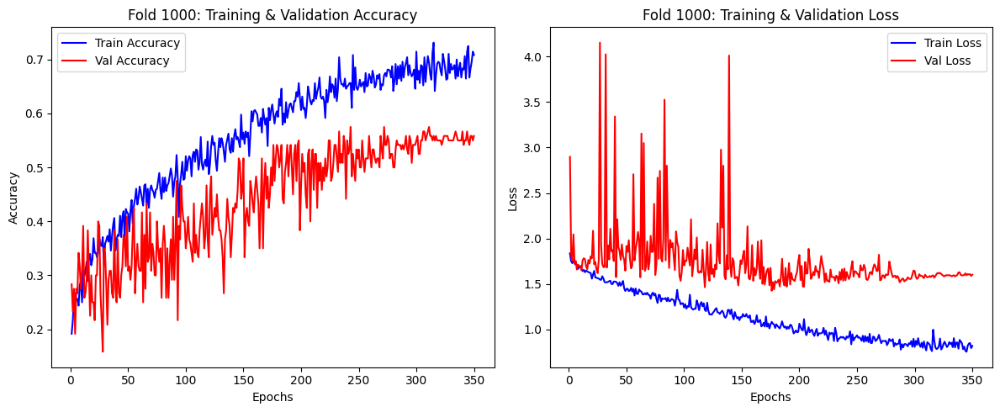


»»» Testing Hidden Dimension: 64 «««
[Elapsed: 0:16:24] [RAM: 1495.2 MB] --- Fold 1000: Initializing GIN ---
[Elapsed: 0:16:24] [RAM: 1495.2 MB] Starting Training Loop...
[Elapsed: 0:16:27] [RAM: 1495.2 MB] Epoch 010 | Train: 1.6177 | Val: 4.7434 (Acc: 0.1833)
[Elapsed: 0:16:31] [RAM: 1495.2 MB] Epoch 020 | Train: 1.5182 | Val: 1.8856 (Acc: 0.3333)
[Elapsed: 0:16:35] [RAM: 1495.2 MB] Epoch 030 | Train: 1.4006 | Val: 1.7048 (Acc: 0.2833)
[Elapsed: 0:16:39] [RAM: 1495.2 MB] Epoch 040 | Train: 1.3795 | Val: 1.7040 (Acc: 0.3833)
[Elapsed: 0:16:42] [RAM: 1495.2 MB] Epoch 050 | Train: 1.3423 | Val: 2.5930 (Acc: 0.3000)
[Elapsed: 0:16:46] [RAM: 1495.2 MB] Epoch 060 | Train: 1.2776 | Val: 1.7747 (Acc: 0.4083)
[Elapsed: 0:16:49] [RAM: 1495.2 MB] Epoch 070 | Train: 1.1434 | Val: 1.8613 (Acc: 0.4500)
[Elapsed: 0:16:53] [RAM: 1495.2 MB] Epoch 080 | Train: 1.1054 | Val: 2.5640 (Acc: 0.3500)
[Elapsed: 0:16:56] [RAM: 1495.2 MB] Epoch 090 | Train: 1.1203 | Val: 1.7788 (Acc: 0.4667)
[Elapsed: 0:17:00]

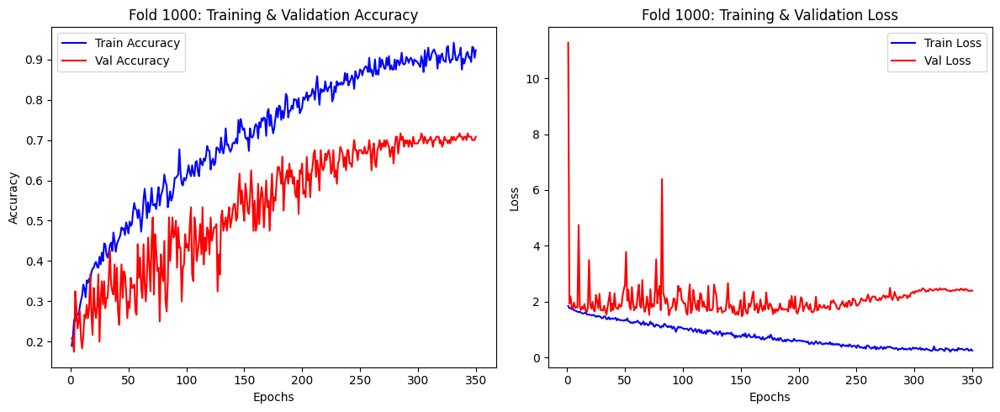


»»» Testing Hidden Dimension: 128 «««
[Elapsed: 0:18:32] [RAM: 1495.2 MB] --- Fold 1000: Initializing GIN ---
[Elapsed: 0:18:32] [RAM: 1495.2 MB] Starting Training Loop...
[Elapsed: 0:18:36] [RAM: 1495.2 MB] Epoch 010 | Train: 1.7215 | Val: 2.2627 (Acc: 0.1750)
[Elapsed: 0:18:39] [RAM: 1495.2 MB] Epoch 020 | Train: 1.5353 | Val: 1.9217 (Acc: 0.2750)
[Elapsed: 0:18:43] [RAM: 1495.2 MB] Epoch 030 | Train: 1.4747 | Val: 2.3270 (Acc: 0.2917)
[Elapsed: 0:18:47] [RAM: 1495.2 MB] Epoch 040 | Train: 1.4376 | Val: 1.7119 (Acc: 0.3250)
[Elapsed: 0:18:51] [RAM: 1495.2 MB] Epoch 050 | Train: 1.2832 | Val: 1.8773 (Acc: 0.3417)
[Elapsed: 0:18:54] [RAM: 1495.2 MB] Epoch 060 | Train: 1.1613 | Val: 1.7549 (Acc: 0.4083)
[Elapsed: 0:18:58] [RAM: 1495.2 MB] Epoch 070 | Train: 1.1115 | Val: 1.6504 (Acc: 0.5000)
[Elapsed: 0:19:02] [RAM: 1495.2 MB] Epoch 080 | Train: 1.0827 | Val: 1.6682 (Acc: 0.4667)
[Elapsed: 0:19:05] [RAM: 1495.2 MB] Epoch 090 | Train: 0.9936 | Val: 2.0276 (Acc: 0.4083)
[Elapsed: 0:19:08

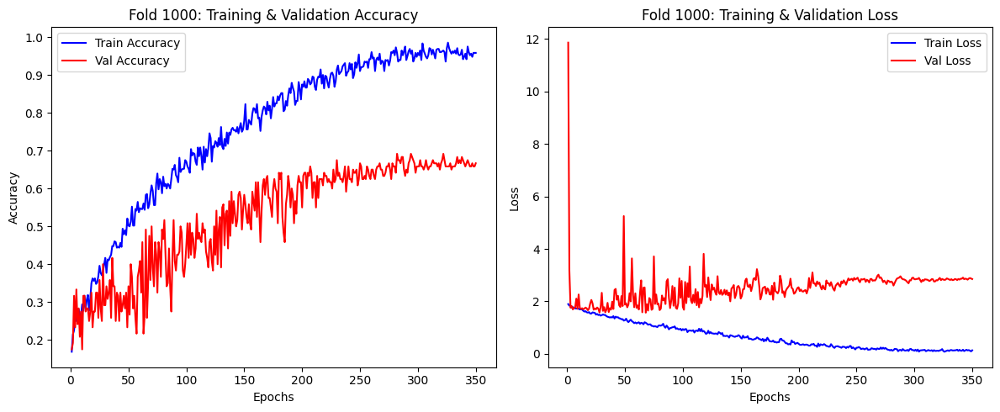


»»» Testing Hidden Dimension: 256 «««
[Elapsed: 0:20:41] [RAM: 1498.9 MB] --- Fold 1000: Initializing GIN ---
[Elapsed: 0:20:41] [RAM: 1500.1 MB] Starting Training Loop...
[Elapsed: 0:20:45] [RAM: 1500.2 MB] Epoch 010 | Train: 1.6905 | Val: 2.1544 (Acc: 0.2333)
[Elapsed: 0:20:49] [RAM: 1500.2 MB] Epoch 020 | Train: 1.5707 | Val: 3.3006 (Acc: 0.2167)
[Elapsed: 0:20:52] [RAM: 1500.2 MB] Epoch 030 | Train: 1.4754 | Val: 1.5655 (Acc: 0.4083)
[Elapsed: 0:20:56] [RAM: 1500.2 MB] Epoch 040 | Train: 1.3936 | Val: 2.5293 (Acc: 0.3083)
[Elapsed: 0:21:00] [RAM: 1500.2 MB] Epoch 050 | Train: 1.3282 | Val: 1.7608 (Acc: 0.4083)
[Elapsed: 0:21:04] [RAM: 1500.2 MB] Epoch 060 | Train: 1.2003 | Val: 1.7714 (Acc: 0.3417)
[Elapsed: 0:21:07] [RAM: 1500.2 MB] Epoch 070 | Train: 1.1415 | Val: 5.1529 (Acc: 0.2750)
[Elapsed: 0:21:11] [RAM: 1500.2 MB] Epoch 080 | Train: 1.0753 | Val: 3.7239 (Acc: 0.3167)
[Elapsed: 0:21:15] [RAM: 1500.2 MB] Epoch 090 | Train: 0.9981 | Val: 1.5103 (Acc: 0.5667)
[Elapsed: 0:21:18

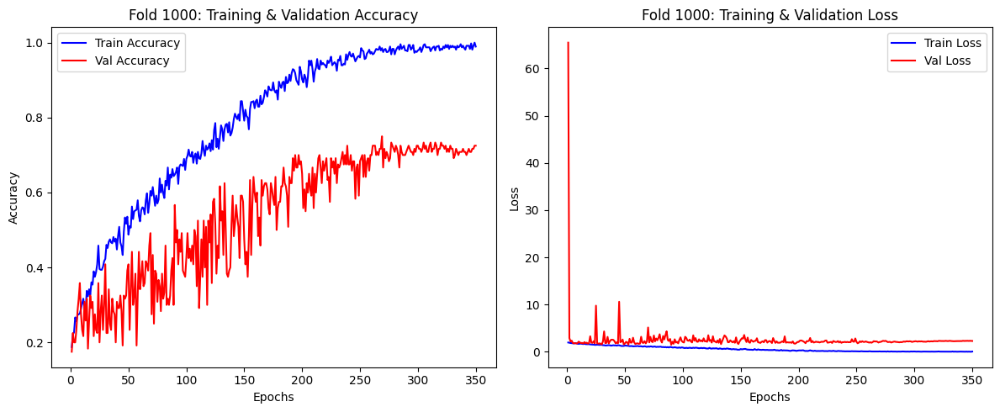

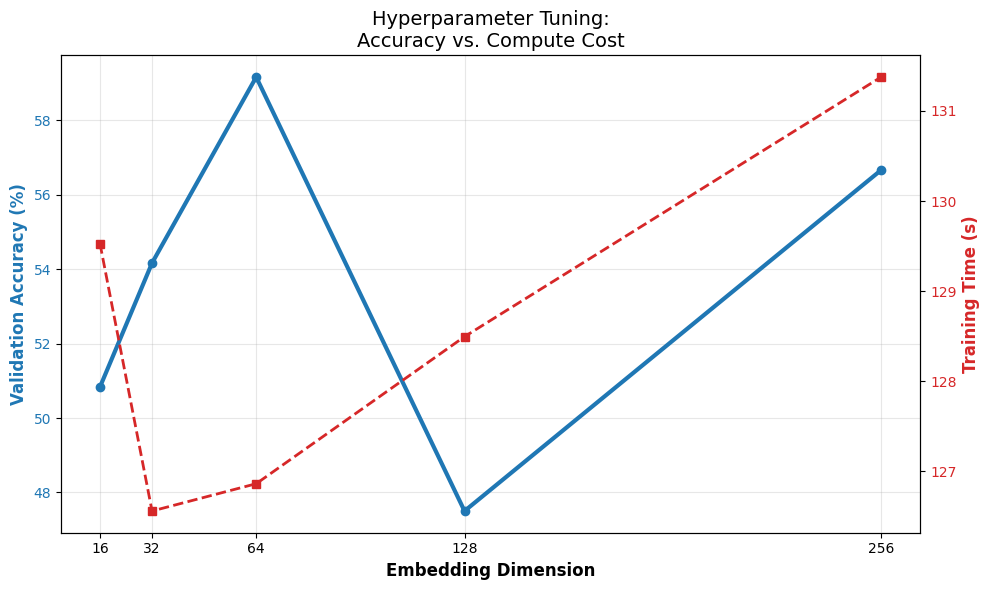

[Plot] Saved tuning tradeoff to tuning_tradeoff_plot.png

[Tuning] Completed. Check 'tuning_tradeoff_plot.png'.

Pipeline Finished in 10.79 minutes.


In [30]:
# ==============================================================================
# CONFIGURATION
# ==============================================================================
DATASET_NAME = 'ENZYMES'
run_pipeline(run_dataset_analysis=False, run_main_experiment=False, enable_stability=False, run_hyperparameter_tuning_emb==True)

STARTING PIPELINE
Loading ENZYMES

STARTING HYPERPARAMETER TUNING (Jumping Knowledge)

»»» Testing JK Mode: last (with dim=64) «««
[Elapsed: 0:43:24] [RAM: 1513.9 MB] --- Fold 1000: Initializing GIN ---
[Elapsed: 0:43:25] [RAM: 1513.9 MB] Starting Training Loop...
[Elapsed: 0:43:29] [RAM: 1513.9 MB] Epoch 010 | Train: 1.6616 | Val: 1.7184 (Acc: 0.2417)
[Elapsed: 0:43:32] [RAM: 1513.9 MB] Epoch 020 | Train: 1.5799 | Val: 1.7472 (Acc: 0.2583)
[Elapsed: 0:43:36] [RAM: 1513.9 MB] Epoch 030 | Train: 1.4958 | Val: 1.7525 (Acc: 0.3000)
[Elapsed: 0:43:40] [RAM: 1513.9 MB] Epoch 040 | Train: 1.5328 | Val: 1.8585 (Acc: 0.2833)
[Elapsed: 0:43:43] [RAM: 1513.9 MB] Epoch 050 | Train: 1.5082 | Val: 1.8328 (Acc: 0.2500)
[Elapsed: 0:43:46] [RAM: 1513.9 MB] Epoch 060 | Train: 1.4901 | Val: 2.2061 (Acc: 0.2167)
[Elapsed: 0:43:51] [RAM: 1513.9 MB] Epoch 070 | Train: 1.4547 | Val: 2.2167 (Acc: 0.1583)
[Elapsed: 0:43:54] [RAM: 1513.9 MB] Epoch 080 | Train: 1.4533 | Val: 1.8256 (Acc: 0.2833)
[Elapsed: 0:43:

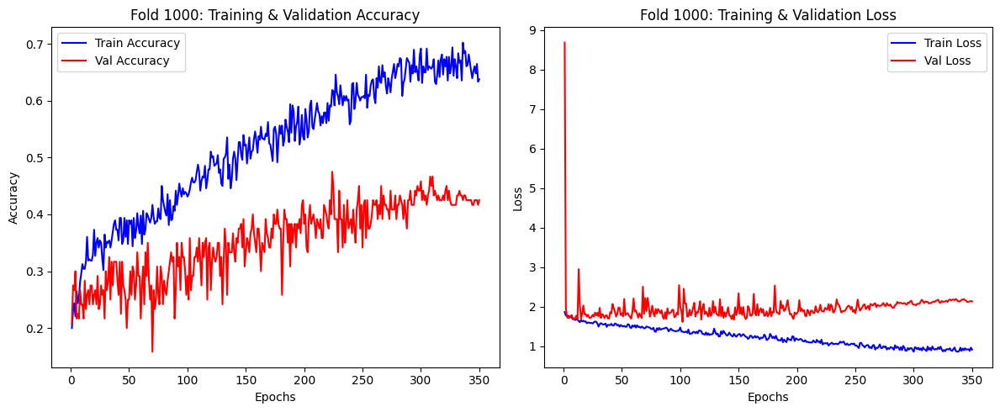


»»» Testing JK Mode: cat (with dim=64) «««
[Elapsed: 0:45:32] [RAM: 1513.9 MB] --- Fold 1000: Initializing GIN ---
[Elapsed: 0:45:32] [RAM: 1513.9 MB] Starting Training Loop...
[Elapsed: 0:45:35] [RAM: 1513.9 MB] Epoch 010 | Train: 1.6281 | Val: 1.7014 (Acc: 0.2750)
[Elapsed: 0:45:40] [RAM: 1513.9 MB] Epoch 020 | Train: 1.5291 | Val: 1.8144 (Acc: 0.2667)
[Elapsed: 0:45:43] [RAM: 1513.9 MB] Epoch 030 | Train: 1.4577 | Val: 1.6397 (Acc: 0.3667)
[Elapsed: 0:45:46] [RAM: 1513.9 MB] Epoch 040 | Train: 1.3768 | Val: 2.1807 (Acc: 0.3250)
[Elapsed: 0:45:50] [RAM: 1513.9 MB] Epoch 050 | Train: 1.4207 | Val: 2.5119 (Acc: 0.2083)
[Elapsed: 0:45:54] [RAM: 1513.9 MB] Epoch 060 | Train: 1.2656 | Val: 1.6598 (Acc: 0.3833)
[Elapsed: 0:45:57] [RAM: 1513.9 MB] Epoch 070 | Train: 1.2547 | Val: 1.6710 (Acc: 0.3833)
[Elapsed: 0:46:01] [RAM: 1513.9 MB] Epoch 080 | Train: 1.2315 | Val: 2.2137 (Acc: 0.3167)
[Elapsed: 0:46:05] [RAM: 1513.9 MB] Epoch 090 | Train: 1.1030 | Val: 1.8554 (Acc: 0.3750)
[Elapsed: 0:

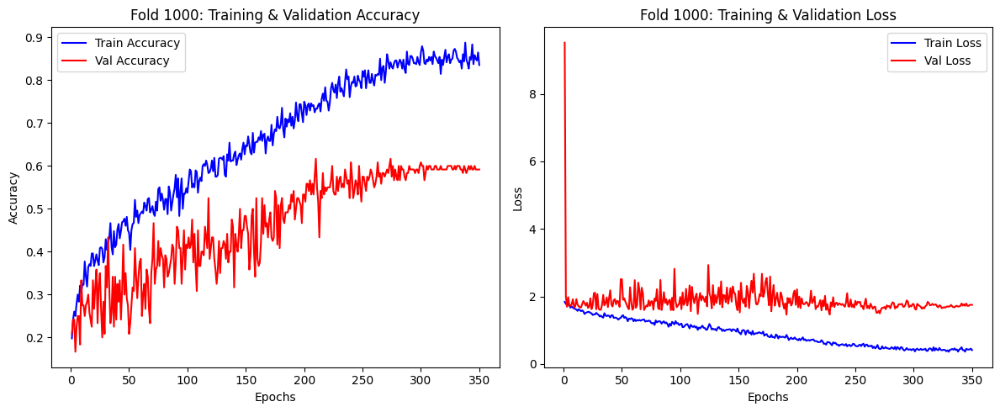


»»» Testing JK Mode: max (with dim=64) «««
[Elapsed: 0:47:40] [RAM: 1513.9 MB] --- Fold 1000: Initializing GIN ---
[Elapsed: 0:47:40] [RAM: 1513.9 MB] Starting Training Loop...
[Elapsed: 0:47:43] [RAM: 1514.1 MB] Epoch 010 | Train: 1.7021 | Val: 1.7430 (Acc: 0.2583)
[Elapsed: 0:47:47] [RAM: 1514.1 MB] Epoch 020 | Train: 1.5772 | Val: 1.6237 (Acc: 0.3333)
[Elapsed: 0:47:51] [RAM: 1514.1 MB] Epoch 030 | Train: 1.5452 | Val: 1.8193 (Acc: 0.2750)
[Elapsed: 0:47:54] [RAM: 1514.1 MB] Epoch 040 | Train: 1.4097 | Val: 1.7646 (Acc: 0.3167)
[Elapsed: 0:47:58] [RAM: 1514.1 MB] Epoch 050 | Train: 1.3047 | Val: 1.5894 (Acc: 0.3833)
[Elapsed: 0:48:01] [RAM: 1514.1 MB] Epoch 060 | Train: 1.3824 | Val: 1.8623 (Acc: 0.1500)
[Elapsed: 0:48:05] [RAM: 1514.1 MB] Epoch 070 | Train: 1.2623 | Val: 1.5525 (Acc: 0.4250)
[Elapsed: 0:48:09] [RAM: 1514.1 MB] Epoch 080 | Train: 1.1568 | Val: 1.7358 (Acc: 0.4167)
[Elapsed: 0:48:12] [RAM: 1514.1 MB] Epoch 090 | Train: 1.1922 | Val: 2.0816 (Acc: 0.3667)
[Elapsed: 0:

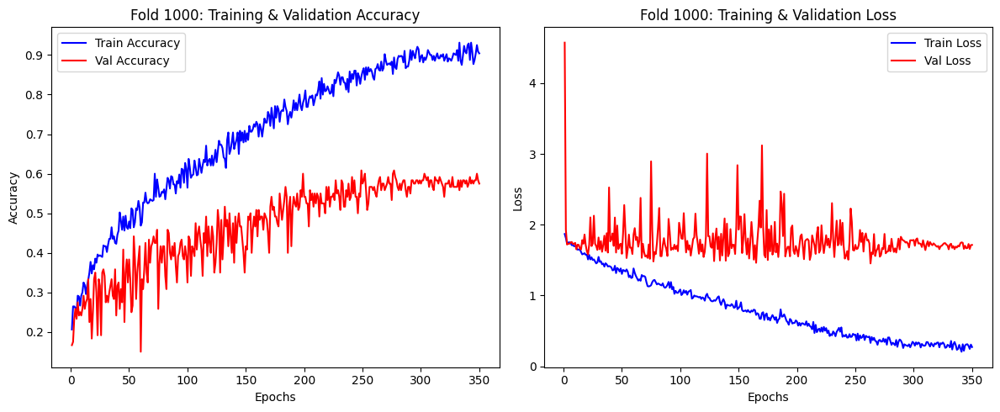


[Tuning] JK Tuning Complete. Check 'tuning_jk_plot.png'.

Pipeline Finished in 6.39 minutes.


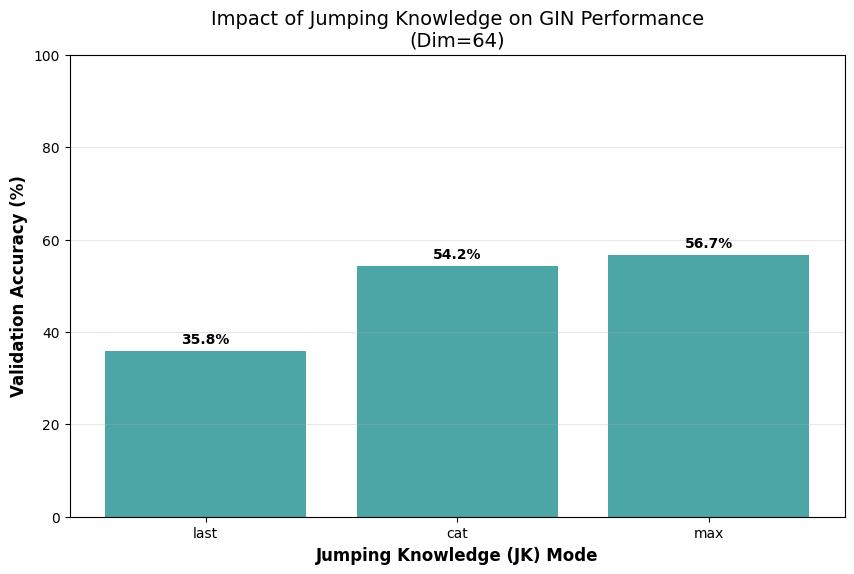

In [40]:
# ==============================================================================
# CONFIGURATION
# ==============================================================================
DATASET_NAME = 'ENZYMES'
run_pipeline(run_dataset_analysis=False, run_main_experiment=False, enable_stability=False, run_hyperparameter_tuning_emb=False, run_hyperparameter_tuning_jk=True, n_folds=10)